<a href="https://colab.research.google.com/github/d4vidi4n/EL4106/blob/main/SVM_Proy_IC_JE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preámbulo

In [49]:
import pandas as pd
import numpy as np
import scipy.stats as sp
import matplotlib.pyplot as plt
import time
import os
import seaborn as sns

#SVM
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectFromModel, SelectKBest, f_classif
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report

from statsmodels.tsa.ar_model import AutoReg
import scipy.stats as sp
import gc

import zipfile
import glob

#ANN
import torch
import torch.nn as nn
!pip install pytorch-ignite
!pip install early-stopping-pytorch
from ignite.engine import Engine, Events
from ignite.handlers import EarlyStopping
from ignite.metrics import Loss
from early_stopping_pytorch import EarlyStopping
import torch.nn.functional as F

# 1) Lectura de datos

In [2]:
from google.colab import files
uploaded = files.upload()  # sensorless_tarea3_train.txt
!ls

Saving df_test_no_labels.csv to df_test_no_labels.csv
Saving df_trainval.csv to df_trainval.csv
df_test_no_labels.csv  df_trainval.csv	sample_data


In [2]:
df_trainval = pd.read_csv('df_trainval.csv')
df_test_no_labels = pd.read_csv('df_test_no_labels.csv')
df_trainval
# df_test_no_labels

,R1_0,R1_1,R1_2,R1_3,R1_4,R1_5,R1_6,R1_7,R1_8,R1_9,...,Humidity_119,Humidity_120,Humidity_121,Humidity_122,Humidity_123,Humidity_124,Humidity_125,Humidity_126,Humidity_127,class
0,12.73430,12.73430,12.73420,12.73420,12.73550,12.73560,12.73700,12.73740,12.73710,12.73700,...,60.0959,60.1002,60.1041,60.1076,60.1108,60.1137,60.1163,60.1187,60.1208,1
1,11.51190,11.52490,11.53670,11.54820,11.55860,11.56800,11.57650,11.58420,11.59120,11.59770,...,64.9539,64.9585,64.9626,64.9663,64.9684,64.9687,64.9689,64.9691,64.9693,1
2,10.85570,10.85860,10.86130,10.86350,10.86440,10.86490,10.86450,10.86390,10.86280,10.86110,...,56.4906,56.4957,56.5004,56.5045,56.5083,56.5118,56.5149,56.5151,56.5149,1
3,12.55170,12.55180,12.55190,12.55190,12.55200,12.55200,12.55210,12.55210,12.55220,12.55220,...,64.5927,64.5912,64.5898,64.5886,64.5875,64.5865,64.5855,64.5847,64.5839,1
4,8.78442,8.77909,8.77488,8.77016,8.76573,8.76157,8.75735,8.75307,8.74919,8.74538,...,58.2097,58.2229,58.2348,58.2456,58.2553,58.2642,58.2722,58.2794,58.2948,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8791,12.39290,12.39290,12.39260,12.39240,12.39260,12.39240,12.39240,12.39290,12.39280,12.39260,...,49.8931,49.8782,49.8613,49.8459,49.8321,49.8195,49.8082,49.7979,49.7878,3
8792,12.83420,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,...,53.2695,53.2648,53.2605,53.2592,53.2585,53.2578,53.2572,53.2567,53.2562,3
8793,11.99420,11.99420,11.99400,11.99400,11.99380,11.99390,11.99390,11.99350,11.99360,11.99370,...,67.2733,67.2698,67.2665,67.2636,67.3011,67.3350,67.3656,67.3934,67.4185,3
8794,12.94500,12.94540,12.94560,12.94460,12.94370,12.94260,12.94080,12.94000,12.93950,12.93910,...,52.3949,52.3953,52.3956,52.3960,52.3963,52.3965,52.3968,52.3970,52.3989,3


# 2) Gráfico de algunas señales

Puede ser buena idea graficar una cierta cantidad de datos aleatorios que esten cerca, en grupos de la misma clase de esta manera se pueden ver ciertas correlaciones visuales entre las señales y la clase.

El R_6 puede que esté bastante relacionado con la clase ya que se aprecian lineas rectas separadas por la clase, las de clase 1 quedan abajo mientras que las de clase 2 al medio y las otras de clase 3 tienden a quedar arriba. Aunque igual se aprecia cierta confusión entre las clases 2 y 3. Se aprecia claramente en varias señales con varios sensores que las señales de clase 1 quedan abajo.

Analizando la humedad, no se aprecia ni una correlación, lo que sugiere que probablemente esta característica no es representativo del estímulo.

Puede no ser necesario aplicar un filtro ya que algraficar varias señales, se ven lineas rectas apiladas, donde a priori se conclute que el filtrado realmente no ayudaría a distinguir las líneas porque estas ya se distinguen de esta forma.

Vuelvo a reiterar, es probable que las clases 2 y 3 se confundan al momento de clasificar ya que las líneas se tienden a apilar y casi siempre las de clase 1 quedan abajo y las señales de las otras clases otras a veces se superponen.

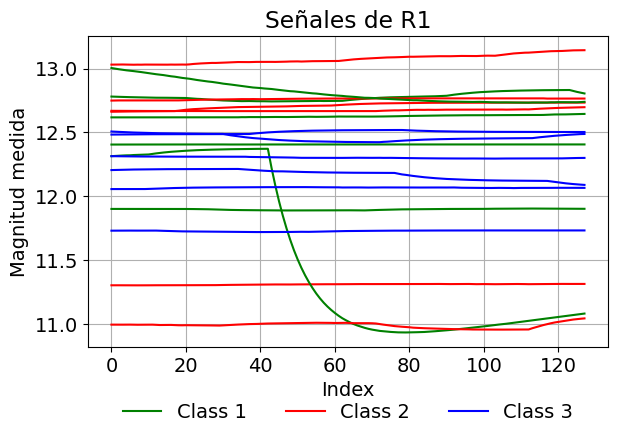

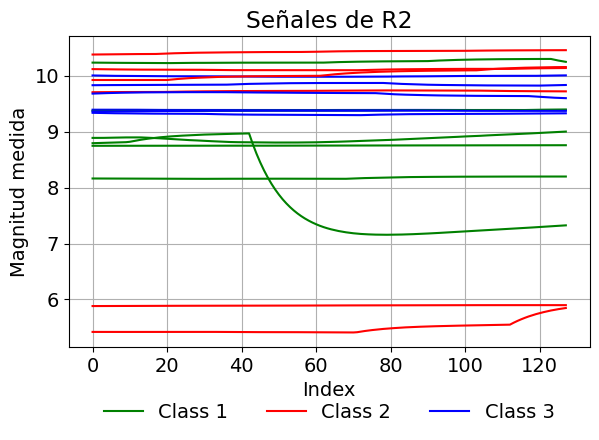

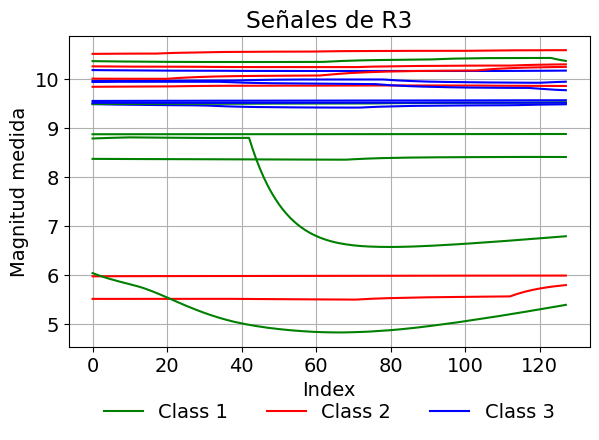

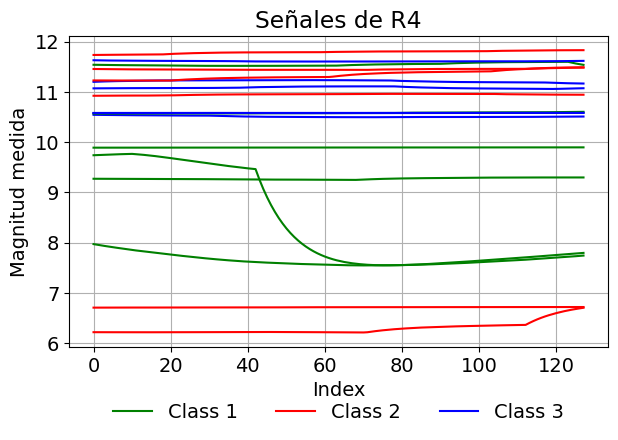

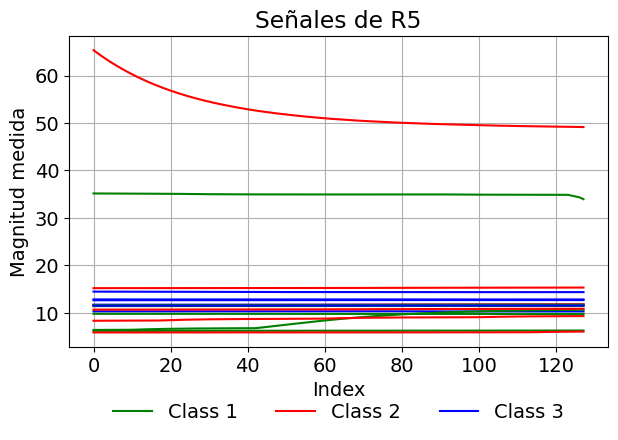

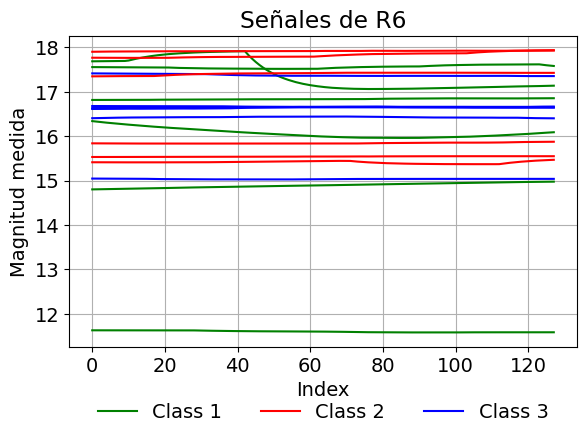

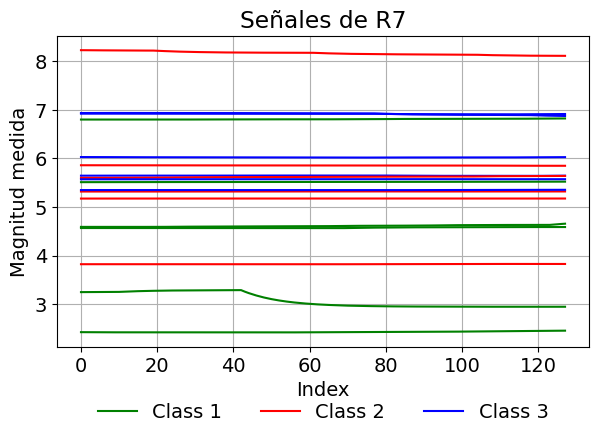

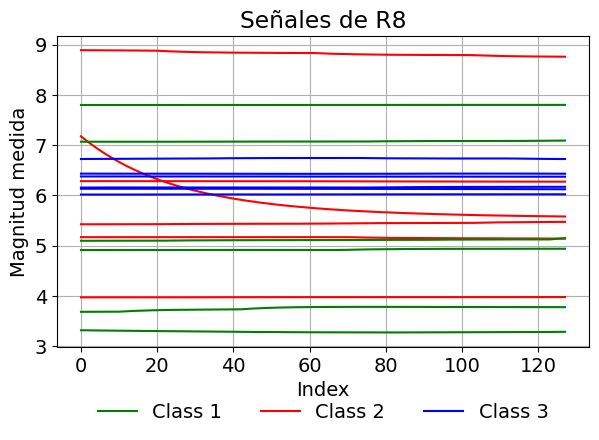

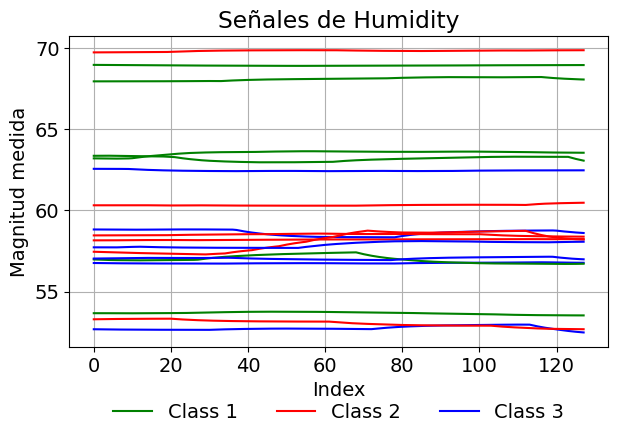

In [4]:
num_sign_per_graph = 6
rs = 20
folder = '/content/SVM/graficos_prelim/' # Ruta para guardar los gráficos, variable global en este punto
os.makedirs(folder, exist_ok=True)

# Definición única de parámetros gráficos
plot_kwargs_1 = {'color': 'green','label': 'Class 1'}
plot_kwargs_2 = {'color': 'red', 'label': 'Class 2'}
plot_kwargs_3 = {'color': 'blue', 'label': 'Class 3'}
plt.rcParams.update({'font.size': 14})  # Cambia el número según el tamaño deseado

for start in range(9):
  idx = [start*128, start*128 + 128]

  plt.figure()
  plt.grid()
  plt.xlabel('Index')
  plt.ylabel('Magnitud medida')

  plt.title(f'Señales de {df_trainval.iloc[:, idx[0]:idx[1]].keys()[0][:-2]}')

  for i in range(num_sign_per_graph):
    plt.plot(np.arange(0,128), df_trainval[df_trainval['class']==1].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]], **plot_kwargs_1)
    plt.plot(np.arange(0,128), df_trainval[df_trainval['class']==2].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]], **plot_kwargs_2)
    plt.plot(np.arange(0,128), df_trainval[df_trainval['class']==3].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]], **plot_kwargs_3)
    if i == 0:
      plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=3, frameon=False)
      plt.tight_layout()  # Ajusta el layout para que no se corte nada

  filename = f'signals_{df_trainval.iloc[:, idx[0]:idx[1]].keys()[0][:-2]}.pdf'

  filepath = os.path.join(folder, filename)
  plt.savefig(filepath)
  plt.show()

import zipfile
import glob

No se aprecian oscilaciones de ni un tipo, por lo que no se hará un análisis en frecuencia

# 3) Eliminar señales o no

Código para eliminar todos los archivos de una carpeta

In [3]:
def delete_all_files(carpeta):
  for filename in os.listdir(carpeta):
      file_path = os.path.join(carpeta, filename)
      if os.path.isfile(file_path):
          os.remove(file_path)

Código para demostrar que no hay componentes oscilatorias relevantes en relación a la media

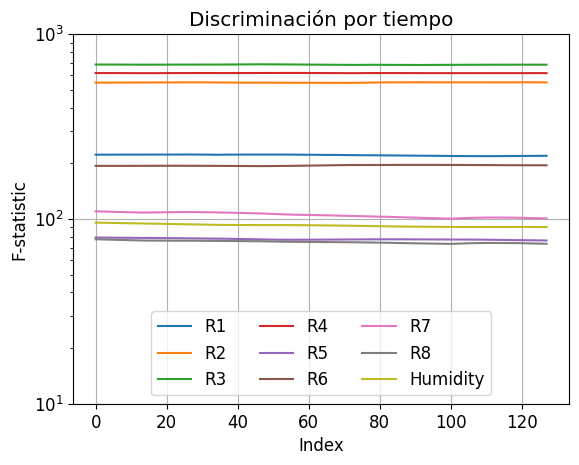

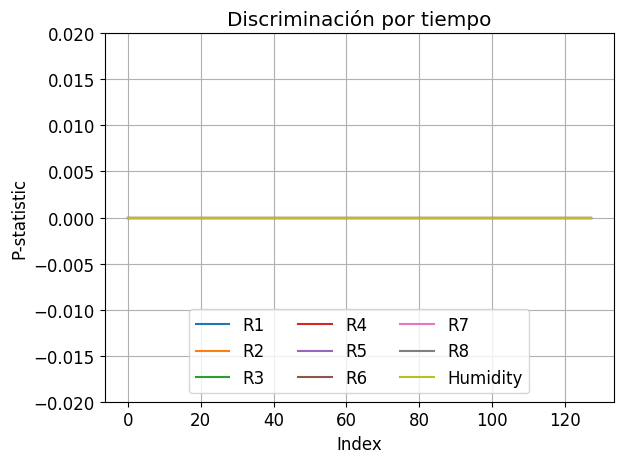

In [4]:
folder = '/content/SVM/delete_signals/graficos_ANOVA/'  # Carpeta para guardar los gráficos FFT
os.makedirs(folder, exist_ok=True)
delete_all_files(folder)

plt.rcParams.update({'font.size': 12})  # Cambia el número según el tamaño deseado

plt.figure(1)
fig1 = plt.gcf()

plt.figure(2)
fig2 = plt.gcf()

for start in range(9):
    idx = [start * 128, start * 128 + 128]
    f_values, p_values = f_classif(df_trainval.iloc[:, idx[0]:idx[1]], df_trainval['class'])
    label = df_trainval.iloc[:, idx[0]:idx[1]].keys()[0][:-2]

    # Primer gráfico (por ejemplo, con marker)
    plt.figure(fig1.number)
    plt.plot(f_values, label=label)
    plt.ylim(10, 1000)
    plt.yscale('log')
    plt.xlabel('Index')
    plt.ylabel("F-statistic")
    plt.title("Discriminación por tiempo")
    plt.grid(True)
    plt.legend(loc='lower center', ncol=3, frameon=True)

    # Segundo gráfico (igual o diferente estilo)
    plt.figure(fig2.number)
    plt.plot(p_values, label=label)
    plt.xlabel('Index')
    plt.ylabel("P-statistic")
    plt.title("Discriminación por tiempo")
    plt.grid(True)
    plt.legend()
    plt.ylim(-0.02, 0.02)
    plt.legend(loc='lower center', ncol=3, frameon=True)

plt.tight_layout()
fig1.savefig(os.path.join(folder, 'f_stat.pdf'))
fig2.savefig(os.path.join(folder, 'p_stat.pdf'))
plt.show()

# 4) Filtrado de la señal
No pq no hay ruido ni componentes periodicas que pudieran requerir la extracción de carcaterísticas frecuenciales

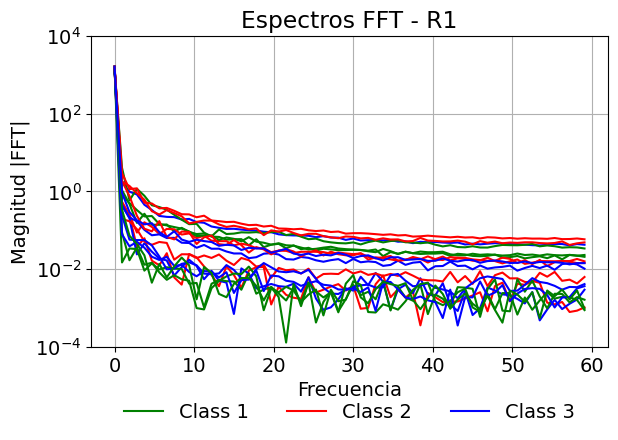

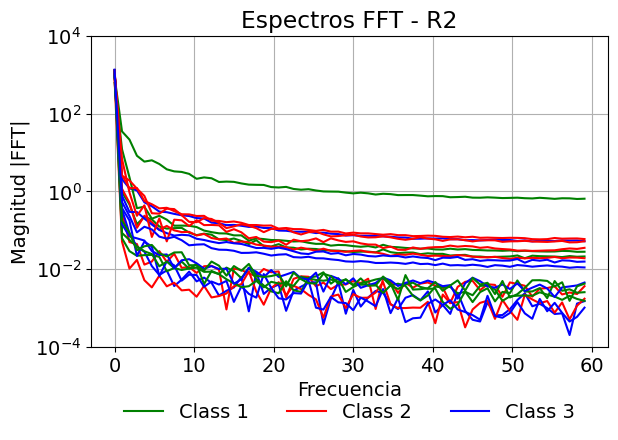

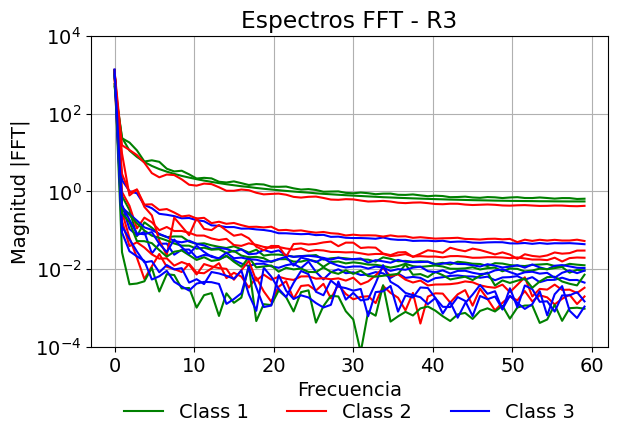

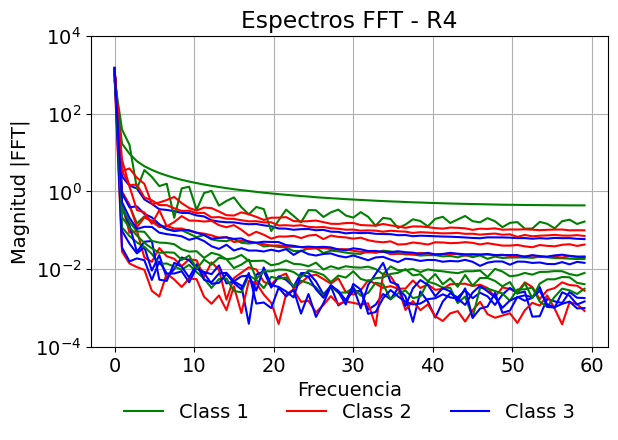

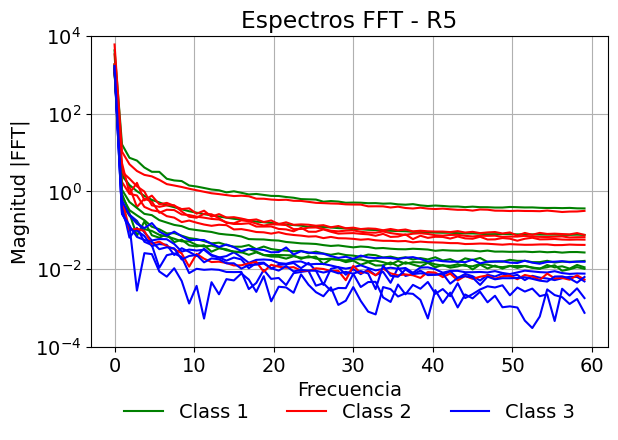

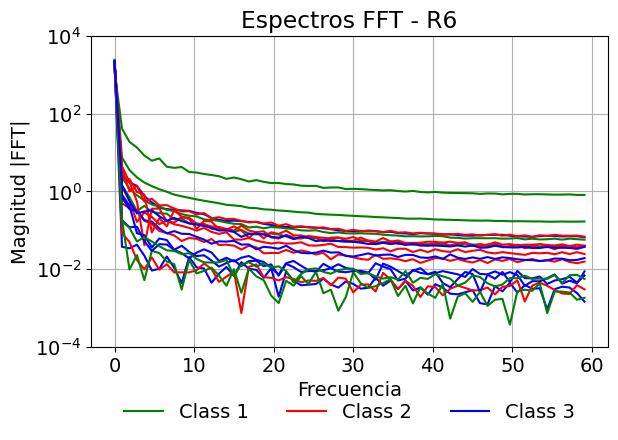

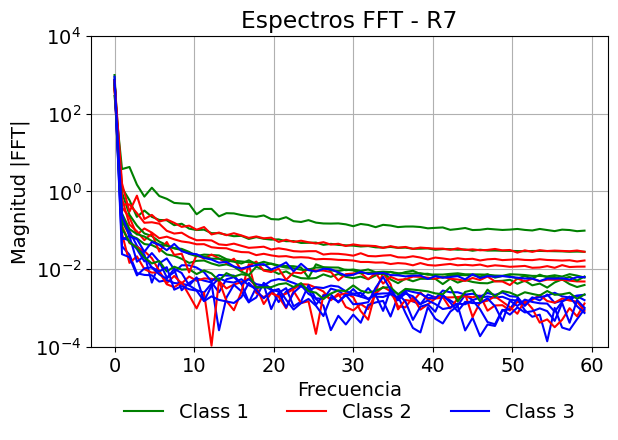

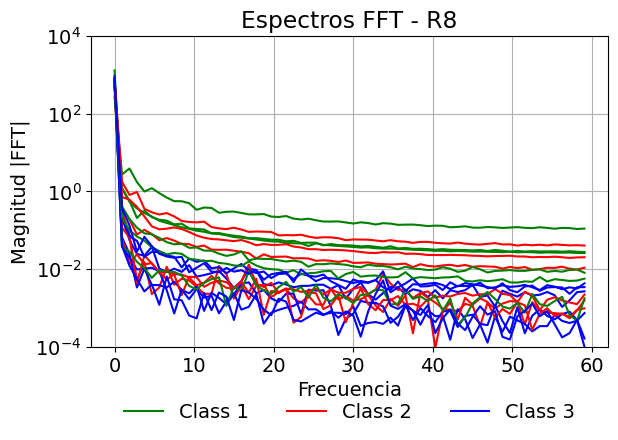

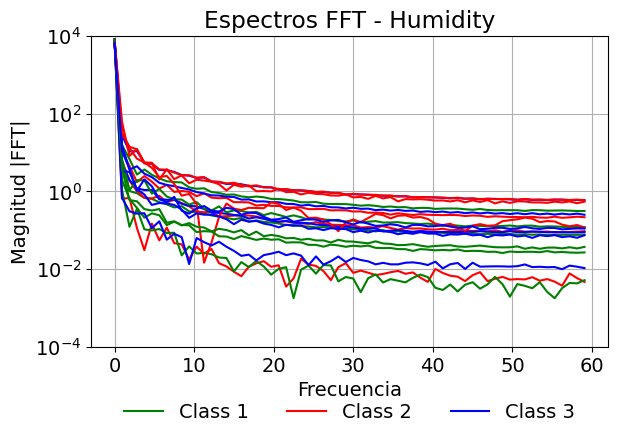

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import os

num_sign_per_graph = 6
rs = 42
folder = '/content/SVM/filter/graficos_fft/'  # Carpeta para guardar los gráficos FFT
os.makedirs(folder, exist_ok=True)

# Definición de estilo por clase
plot_kwargs_1 = {'color': 'green','label': 'Class 1'}
plot_kwargs_2 = {'color': 'red', 'label': 'Class 2'}
plot_kwargs_3 = {'color': 'blue', 'label': 'Class 3'}
plt.rcParams.update({'font.size': 14})

# Número de puntos por señal
N = 128
# Frecuencia de muestreo (puedes ajustar si tienes el valor real)
fs = 120

freqs = np.fft.fftfreq(N, d=1/fs)[:N//2]

for start in range(9):
    idx = [start*128, start*128 + 128]

    plt.figure()
    plt.grid()
    plt.xlabel('Frecuencia')
    plt.ylabel('Magnitud |FFT|')
    plt.title(f'Espectros FFT - {df_trainval.iloc[:, idx[0]:idx[1]].columns[0][:-2]}')
    plt.ylim(10**-4 , 10**4)

    for i in range(num_sign_per_graph):
        for class_id, plot_kwargs in zip([1, 2, 3], [plot_kwargs_1, plot_kwargs_2, plot_kwargs_3]):
            signal = df_trainval[df_trainval['class'] == class_id].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]].values # signal = signal - np.mean(signal)
            fft_vals = np.fft.fft(signal)
            magnitude = np.abs(fft_vals[:N//2])
            plt.plot(freqs, magnitude, **plot_kwargs)
            plt.yscale('log')

        if i == 0:
            plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=3, frameon=False)
            plt.tight_layout()

    filename = f'fft_{df_trainval.iloc[:, idx[0]:idx[1]].columns[0][:-2]}.pdf'
    filepath = os.path.join(folder, filename)
    plt.savefig(filepath)
    plt.show()

# 5) Definición de las características

Vector de cálculo de características (Media, Varianza, etc) ()

In [6]:
from statsmodels.tsa.ar_model import AutoReg

def get_single_ar_coeff(signal, order=3, method='mean'):
    try:
        model = AutoReg(signal, lags=order, old_names=False)
        result = model.fit()
        coeffs = result.params[1:]  # Ignorar el intercepto
        if method == 'mean':
            return np.mean(coeffs)
        elif method == 'norm':
            return np.linalg.norm(coeffs)
        elif method == 'first':
            return coeffs[0]
        elif method == 'max_abs':
            return coeffs[np.argmax(np.abs(coeffs))]
        else:
            return np.nan
    except:
        return np.nan

In [7]:
def extract_features(signal):
  STD_THRESHOLD = 1e-12

  is_constant = np.std(signal) < STD_THRESHOLD
  # is_constant = np.std(signal) == 0
  is_too_short = len(signal) < 2

  return {
      'mean': np.mean(signal),
      'var': np.var(signal),
      'mad': np.median(np.abs(signal - np.median(signal))),
      'max': np.max(signal),
      'min': np.min(signal),
      'ran': np.max(signal) - np.min(signal),
      'sma': np.sum(np.abs(signal)),
      'enrgy': np.sum(signal**2) / len(signal),
      'iqr': sp.iqr(signal),
      'entpy': sp.entropy(signal),
      'arCoeff': get_single_ar_coeff(signal),  # Placeholder; lo puedes reemplazar cuando tengas la función
      'corr': 0.0 if is_constant or is_too_short else np.corrcoef(signal[:-1], signal[1:])[0, 1]
  }

def calculation_feature_vector(df_data):
    sensors = [f'R{j}' for j in range(1, 9)] + ['Humidity']
    feature_list = []

    # for idx, row in df_data[8215:8220].iterrows():
    # for idx, row in df_data[8216:8217].iterrows(): #Dato problemático -> df_data.iloc[8216]
    for idx, row in df_data.iterrows():
        features = {}
        for sensor in sensors:
            start_col = f'{sensor}_0'
            end_col = f'{sensor}_127'
            signal = row[start_col:end_col].to_numpy()
            feats = extract_features(signal)
            # Prefix feature names with sensor ID
            feats_prefixed = {f'{key}_{sensor}': value for key, value in feats.items()}
            features.update(feats_prefixed)
        if 'class' in df_data.columns:
            features['class'] = row['class']
        feature_list.append(features)

    df_features = pd.DataFrame(feature_list)
    return df_features

Hay un caso de un sample que da un valor muy bajo en la varianza, esto genra una división por cero, por esta razón de establecerá una forma de lidiar con este caso y evitar que haya un NaN

#### Cálculo del vector de cracterísticas

In [8]:
train_val_data = calculation_feature_vector(df_trainval)
df_test_data = calculation_feature_vector(df_test_no_labels)

En la celda a continuación se definen los conjuntos que se utilizarán para entrenar los modelo y los subconjuntos del conjunto de validación para cuando busque los mejore hiperparámetros de la red neuronal

In [9]:
df_train, df_val = train_test_split(train_val_data, test_size=0.3, random_state=10, stratify=train_val_data['class'])

df_test = df_test_data.copy()

Normalización y separación del vector de cracaterísticas y la clase de los datos

In [10]:
# df_test = calculation_feature_vector(df_test_no_labels)
scaler = StandardScaler().fit(df_train.iloc[:,0:-1])

df_train.iloc[:,0:-1] = scaler.transform(df_train.iloc[:,0:-1])
df_val.iloc[:,0:-1] = scaler.transform(df_val.iloc[:,0:-1])
df_test.iloc[:,0:] = scaler.transform(df_test_data.iloc[:,0:])

df_train_w_class = df_train.copy()
df_val_w_class = df_val.copy()

y_train = df_train.pop('class')# - 1
y_val = df_val.pop('class')# - 1

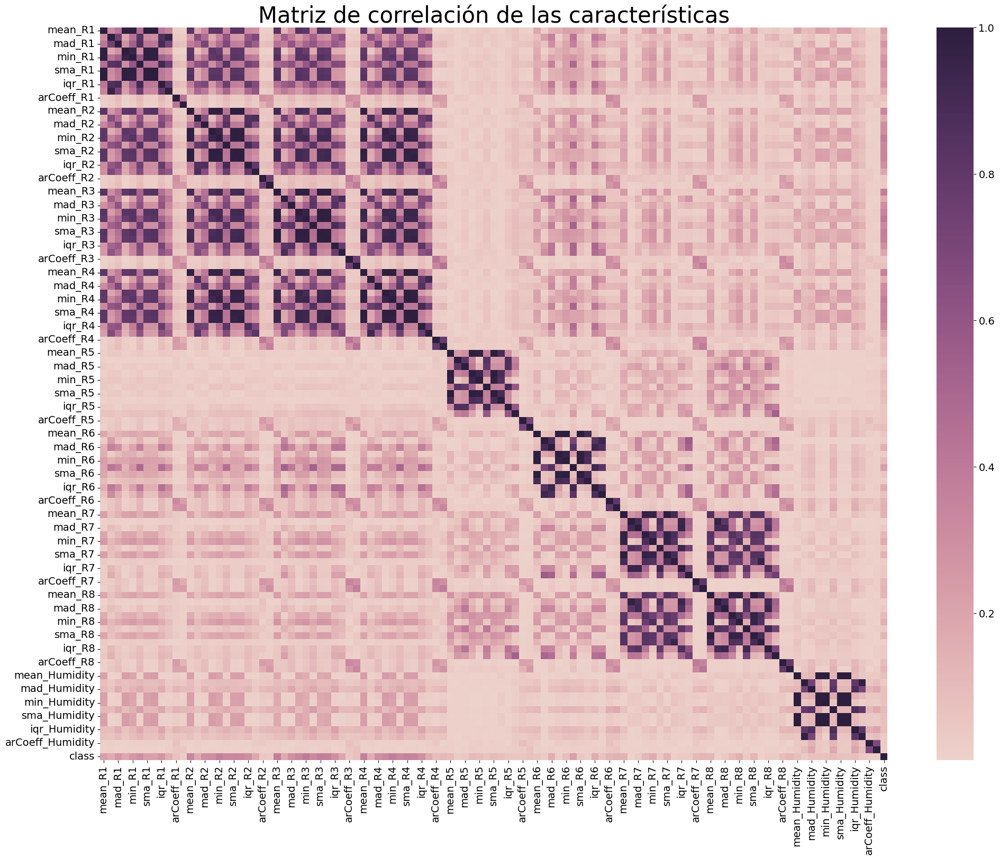

In [11]:
plt.figure(figsize=(24, 18))
correlation_data = df_train_w_class.corr(method='pearson')
correlation_data_abs_value = abs(df_train_w_class.corr(method='pearson'))
sns.heatmap(correlation_data_abs_value, cmap=sns.cubehelix_palette(as_cmap=True))
plt.title("Matriz de correlación de las características", fontsize=30)

folder = '/content/SVM/corr_mat/'
os.makedirs(folder, exist_ok=True)
plt.savefig(f'{folder}corr_lineal_all_fetures.svg', format='svg', bbox_inches='tight', pad_inches=0)

# 7) a) Clasificador SVM

Permutación predefinida para la validación del modelo

In [12]:
def predefined_split(class_val):
  n_samples = len(class_val)                                    # Longitud del set de datos de validación, este dato se usará para definir que elementos se usarán para entrenamiento y validación en GridSearchCV()
  n_train_grid_search = int(n_samples * 0.7)                    # 80% de los datos utilizdos para entrenamiento
  n_val_grid_search = n_samples - n_train_grid_search           # El 20% restante para validación

  np.random.seed(42)
  indices = np.random.permutation(n_samples)                    # Tomar índices de forma aleatoria
  test_fold = np.full(n_samples, -1)                            # Se define el arreglo de los índices de elemntos de train y test

  # Asignar 1 a los índices que serán test
  test_indices = indices[:n_val_grid_search]
  test_fold[test_indices] = 1

  ps = PredefinedSplit(test_fold)

  return ps

Cálculo de la proporción de observaciones de cada clase en los subconjuntos de test par ala búsqueda de hiperparámetros

In [13]:
# Permutación predefinida para la validación del modelo con el conjunto completo de cracaterísticas
ps = predefined_split(y_val)

test_fold = ps.test_fold
y_val_array = np.array(y_val)

# Índices a partir de la permutación predefinida
train_indices = np.where(test_fold == -1)[0]
val_indices = np.where(test_fold == 1)[0]

# Obtener subconjuntos de clases
y_val_train_subset = y_val_array[train_indices]
y_val_val_subset = y_val_array[val_indices]

# Calcular proporciones
train_class_dist = pd.Series(y_val_train_subset).value_counts(normalize=True).sort_index()
val_class_dist = pd.Series(y_val_val_subset).value_counts(normalize=True).sort_index()

# Mostrar proporciones
print("Distribución de clases en el subset de entrenamiento (dentro de validación):")
print(train_class_dist)

print("\nDistribución de clases en el subset de validación (dentro de validación):")
print(val_class_dist)


Distribución de clases en el subset de entrenamiento (dentro de validación):
1.0    0.329182
2.0    0.343801
3.0    0.327017
Name: proportion, dtype: float64

Distribución de clases en el subset de validación (dentro de validación):
1.0    0.342172
2.0    0.309343
3.0    0.348485
Name: proportion, dtype: float64


Función para gejecutar la clasificación dado los hiperparámetros de un SVM y los conjuntos de entrenamiento y validación

In [14]:
def make_clf(svc, params_svc, df_t, y_t, df_v, y_v):

  clf = GridSearchCV(svc, params_svc, cv=ps) #ps es una variable global, no se coloca como entrada para reducir al máximo las entradas de la función y hacer menos confusa las iteraciones

  # GridSearch
  t0 = time.time()
  clf.fit(df_v, y_v)
  t = time.time()
  tiempo_svm_lin_grid_search = t - t0
  print('Tiempo GridSearch SVM lineal: ',tiempo_svm_lin_grid_search)

  display(pd.DataFrame(clf.cv_results_)) # Resultados del GridSearchCV()

  best_clf = clf.best_estimator_ # Se extraen los mejores hiperparámetros calculados a través de GridSearchCV()

  # Entrenamiento del SVM lineal con el conjunto de entrenamiento
  t0 = time.time()
  best_clf.fit(df_t, y_t)
  t = time.time()
  tiempo_svm_lin_training = t - t0
  print('Tiempo entrenamiento SVM lineal: ',tiempo_svm_lin_training)

  print('Tiempo GridSearch + Entrenamiento =',tiempo_svm_lin_grid_search+tiempo_svm_lin_training)

  return best_clf

Función para determinar la matriz de confusión dado un SVM y los conjuntos de validación y predicción de la validación

In [15]:
def conf_mat(bst_clf, y_v, y_pr):

  plt.rcParams['font.size'] = 10.0

  gamma_val = round(bst_clf.gamma, 3) if isinstance(bst_clf.gamma, float) else bst_clf.gamma

  accu_score = accuracy_score(y_v, y_pr)

  disp = ConfusionMatrixDisplay(np.round(confusion_matrix(y_v, y_pr, normalize='true'), decimals=6))#, annot=True, cmap=sns.cubehelix_palette(as_cmap=True), xticklabels=[1, 2, 3],yticklabels=[1, 2, 3])
  disp.plot(cmap='RdPu')

  if bst_clf.kernel == 'poly':
    plt.title(f'C={bst_clf.C}, coef0={bst_clf.coef0}, deg={bst_clf.degree}, gamma={gamma_val}\nAccuracy = {accu_score:.4f}', fontsize = 10)
    filename = f'mat_conf_kernel-{bst_clf.kernel}_C-{bst_clf.C}_deg-{bst_clf.degree}_gamma-{gamma_val}.svg'
  else:
    plt.title(f'C={bst_clf.C}, gamma={gamma_val}\nAccuracy = {accu_score:.4f}', fontsize = 10)
    filename = f'mat_conf_kernel-{bst_clf.kernel}_C-{bst_clf.C}_gamma-{gamma_val}.svg'

  plt.suptitle(f'Matriz de confusión normalizada SVM, kernel {bst_clf.kernel}', x=0.43, y=1.00)

  filepath = os.path.join(folder, filename)

  os.makedirs(folder, exist_ok=True)

  plt.savefig(filepath)

  plt.show()

### Grid search para encontrar el mejor kernel, con todas las características


In [16]:
n_features = df_val.shape[1]
gamma_default = 1 / (n_features * df_val.var().mean()) #gamma predefinido para todo el dataset

#### Encontrar el mejor kernel

Tiempo GridSearch SVM lineal:  50.801342725753784


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_kernel,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.218316,0.0,0.055368,0.0,0.01,linear,"{'C': 0.01, 'kernel': 'linear'}",0.670455,0.670455,0.0,9
1,0.314918,0.0,0.076022,0.0,0.01,poly,"{'C': 0.01, 'kernel': 'poly'}",0.368687,0.368687,0.0,20
2,0.405590,0.0,0.188866,0.0,0.01,rbf,"{'C': 0.01, 'kernel': 'rbf'}",0.416667,0.416667,0.0,19
3,0.514879,0.0,0.144390,0.0,0.01,sigmoid,"{'C': 0.01, 'kernel': 'sigmoid'}",0.535354,0.535354,0.0,14
4,0.263061,0.0,0.049676,0.0,0.10,linear,"{'C': 0.1, 'kernel': 'linear'}",0.689394,0.689394,0.0,7
5,0.288899,0.0,0.072739,0.0,0.10,poly,"{'C': 0.1, 'kernel': 'poly'}",0.459596,0.459596,0.0,18
6,0.336048,0.0,0.166890,0.0,0.10,rbf,"{'C': 0.1, 'kernel': 'rbf'}",0.654040,0.654040,0.0,10
7,0.436855,0.0,0.122033,0.0,0.10,sigmoid,"{'C': 0.1, 'kernel': 'sigmoid'}",0.597222,0.597222,0.0,12
8,0.606327,0.0,0.045521,0.0,1.00,linear,"{'C': 1, 'kernel': 'linear'}",0.707071,0.707071,0.0,6
9,0.270740,0.0,0.066218,0.0,1.00,poly,"{'C': 1, 'kernel': 'poly'}",0.574495,0.574495,0.0,13


Tiempo entrenamiento SVM lineal:  2.565037488937378
Tiempo GridSearch + Entrenamiento = 53.36638021469116


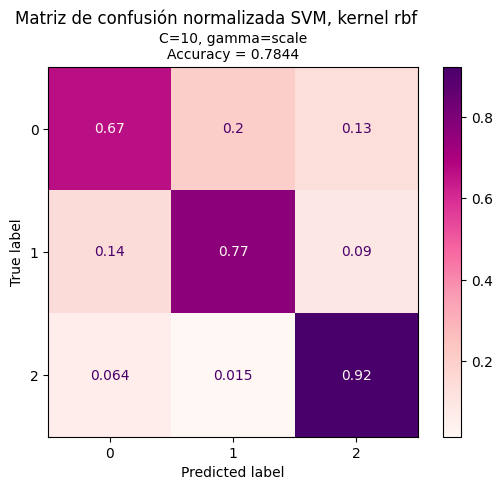

In [17]:
params = {'C':[0.01, 0.1, 1, 10, 100], 'kernel':['linear', 'poly', 'rbf', 'sigmoid']}
svc = svm.SVC()
best_model_kernel = make_clf(svc, params, df_train, y_train, df_val, y_val) # Todas las características

y_pred = best_model_kernel.predict(df_val) # Predicción del conjunto de validación

folder = '/content/SVM/train/full_dataset/Grid_Search_best_kernel/'

conf_mat(best_model_kernel, y_val, y_pred)

#### Encontrar el mejor RBF
Al encontrar el mejor kernel, este fue el rbf y debido a que el mejor valor de C fue 10 (cerca del máximo valor dado en el Grid Search), se pueban mayores valores de C.


Tiempo GridSearch SVM lineal:  16.123555421829224


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.371057,0.0,0.263201,0.0,1,0.000089,"{'C': 1, 'gamma': 8.857553770170197e-05}",0.539141,0.539141,0.0,25
1,0.319665,0.0,0.228892,0.0,1,0.000886,"{'C': 1, 'gamma': 0.0008857553770170198}",0.652778,0.652778,0.0,19
2,0.277078,0.0,0.201173,0.0,1,0.008858,"{'C': 1, 'gamma': 0.008857553770170197}",0.715909,0.715909,0.0,6
3,0.338065,0.0,0.229850,0.0,1,0.088576,"{'C': 1, 'gamma': 0.08857553770170197}",0.704545,0.704545,0.0,13
4,0.455108,0.0,0.277149,0.0,1,0.885755,"{'C': 1, 'gamma': 0.8857553770170198}",0.592172,0.592172,0.0,24
5,0.312449,0.0,0.230146,0.0,10,0.000089,"{'C': 10, 'gamma': 8.857553770170197e-05}",0.655303,0.655303,0.0,18
6,0.285975,0.0,0.199533,0.0,10,0.000886,"{'C': 10, 'gamma': 0.0008857553770170198}",0.694444,0.694444,0.0,15
7,0.257404,0.0,0.180112,0.0,10,0.008858,"{'C': 10, 'gamma': 0.008857553770170197}",0.743687,0.743687,0.0,1
8,0.407130,0.0,0.225856,0.0,10,0.088576,"{'C': 10, 'gamma': 0.08857553770170197}",0.715909,0.715909,0.0,6
9,0.448530,0.0,0.279941,0.0,10,0.885755,"{'C': 10, 'gamma': 0.8857553770170198}",0.601010,0.601010,0.0,20


Tiempo entrenamiento SVM lineal:  2.575932264328003
Tiempo GridSearch + Entrenamiento = 18.699487686157227


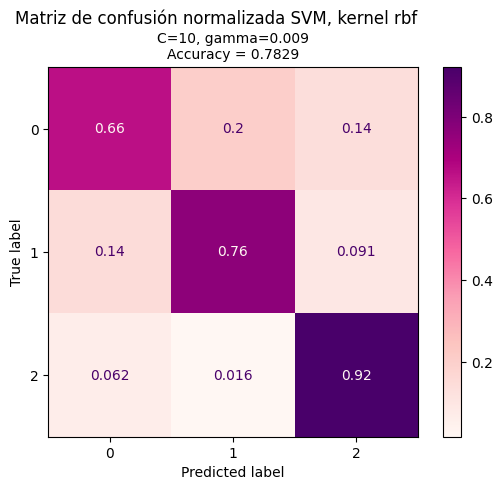

In [18]:
parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')
best_model_rbf_all_feat = make_clf(svc, parameters, df_train, y_train, df_val, y_val)

y_pred = best_model_rbf_all_feat.predict(df_val) # Predicción del conjunto de validación
folder = '/content/SVM/train/full_dataset/Grid_Search_best_rbf/'
conf_mat(best_model_rbf_all_feat, y_val, y_pred)

#### Encontrar el mejor lineal
Aqui el mejor C fue de 10, por lo tanto se establece un rango que incluya este valor y algunos más altos


Tiempo GridSearch SVM lineal:  12.002401351928711


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.620220,0.0,0.047963,0.0,1,{'C': 1},0.707071,0.707071,0.0,3
1,1.012382,0.0,0.043919,0.0,2,{'C': 2},0.707071,0.707071,0.0,3
2,1.877268,0.0,0.042299,0.0,5,{'C': 5},0.719697,0.719697,0.0,1
3,4.467171,0.0,0.041433,0.0,10,{'C': 10},0.718434,0.718434,0.0,2


Tiempo entrenamiento SVM lineal:  18.278643131256104
Tiempo GridSearch + Entrenamiento = 30.281044483184814


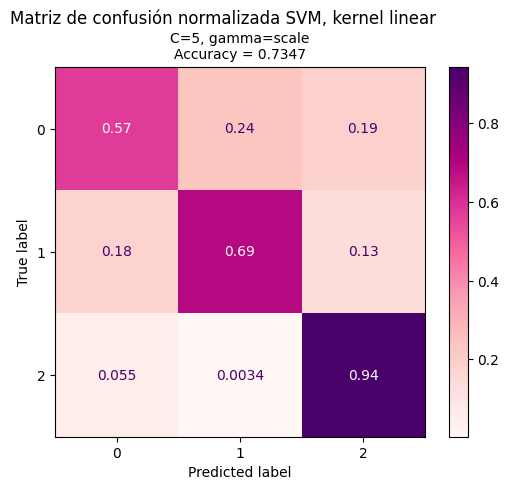

In [19]:
# parameters = {'C':[1, 10, 100, 200, 500]} #Estos valores tan altos hacen que el modelo se tarde demasiado en entrenar
parameters = {'C':[1, 2, 5, 10]}
svc = svm.SVC(kernel='linear')
best_model_lin_all_feat = make_clf(svc, parameters, df_train, y_train, df_val, y_val)

y_pred = best_model_lin_all_feat.predict(df_val) # Predicción del conjunto de validación
folder = '/content/SVM/train/full_dataset/Grid_Search_best_lin/'
conf_mat(best_model_lin_all_feat, y_val, y_pred)

#### Encontrar el mejor poly
Se decidió probar ya que el kernel rbf no dió buenos resultados, no mejoró con respecto al resultado de la búsqueda del mejor grid search


Tiempo GridSearch SVM lineal:  18.16038155555725


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.224946,0.0,0.052000,0.0,1,2,"{'C': 1, 'degree': 2}",0.723485,0.723485,0.0,8
1,0.213132,0.0,0.049974,0.0,1,3,"{'C': 1, 'degree': 3}",0.727273,0.727273,0.0,7
2,0.215170,0.0,0.049211,0.0,1,4,"{'C': 1, 'degree': 4}",0.729798,0.729798,0.0,4
3,0.221653,0.0,0.049285,0.0,1,5,"{'C': 1, 'degree': 5}",0.728535,0.728535,0.0,5
4,0.247941,0.0,0.046422,0.0,10,2,"{'C': 10, 'degree': 2}",0.746212,0.746212,0.0,1
5,0.277467,0.0,0.044837,0.0,10,3,"{'C': 10, 'degree': 3}",0.733586,0.733586,0.0,3
6,0.278785,0.0,0.046135,0.0,10,4,"{'C': 10, 'degree': 4}",0.728535,0.728535,0.0,5
7,0.312859,0.0,0.045073,0.0,10,5,"{'C': 10, 'degree': 5}",0.742424,0.742424,0.0,2
8,0.650592,0.0,0.044789,0.0,100,2,"{'C': 100, 'degree': 2}",0.715909,0.715909,0.0,11
9,0.555530,0.0,0.041640,0.0,100,3,"{'C': 100, 'degree': 3}",0.723485,0.723485,0.0,8


Tiempo entrenamiento SVM lineal:  2.9863903522491455
Tiempo GridSearch + Entrenamiento = 21.146771907806396


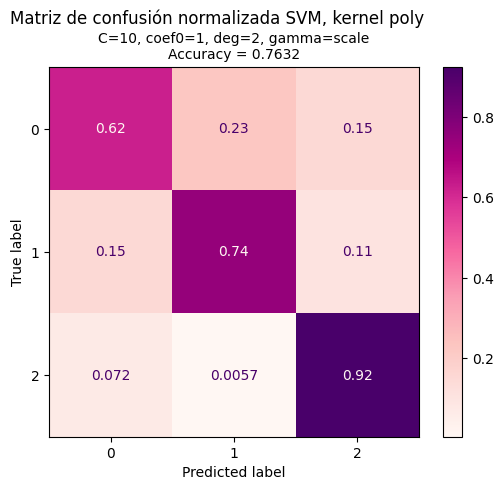

In [20]:
parameters = {'C':[1, 10, 100, 1000, 2000], 'degree':[2,3,4,5]}
svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')
best_model_poly_all_feat = make_clf(svc, parameters, df_train, y_train, df_val, y_val)

y_pred = best_model_poly_all_feat.predict(df_val) # Predicción del conjunto de validación
folder = '/content/SVM/train/full_dataset/Grid_Search_best_poly/'
conf_mat(best_model_poly_all_feat, y_val, y_pred)

### Reducción de carcaterísticas preliminar (Solo medias)
Idea sustentada en la forma de las señales y la matriz de correlación

Matriz de confusión de solo las medias, esta idea está sustentada en el hecho de que la mayoría de las señales son líneas rectas o tienen una pendiente muy baja, teniendo esto en cuenta se plantea reducir el vector de carcaterísticas

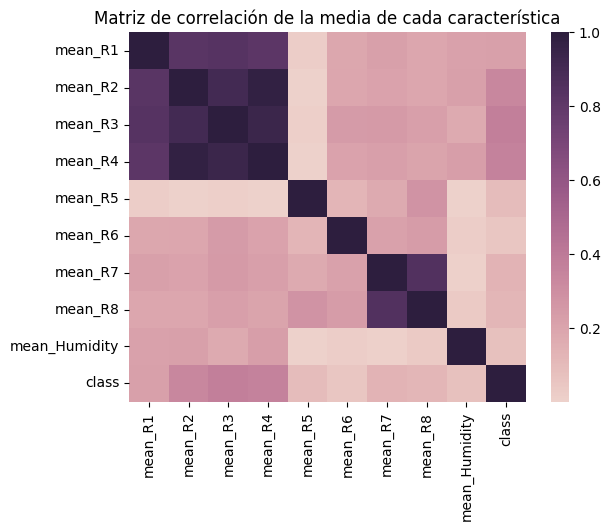

In [21]:
correlation_data_abs_value = abs(df_train[[col for col in df_train.columns if col.startswith('mean_')]].assign(**{'class': y_train}).corr(method='pearson'))
sns.heatmap(correlation_data_abs_value, cmap=sns.cubehelix_palette(as_cmap=True))
plt.title("Matriz de correlación de la media de cada característica")#, fontsize=20)

folder = '/content/SVM/corr_mat/'
os.makedirs(folder, exist_ok=True)
plt.savefig(f'{folder}corr_lineal_all_means.svg', format='svg', bbox_inches='tight', pad_inches=0)

gamma_default en función de los datos

In [22]:
gamma_default = 1 / (n_features * df_val.var().mean()) #gamma predefinido para todo el dataset

Se observó que al definir el gamma en función del vector de características completo, los resultados en validación fueron ligeramente inferiores pero superiores en test (Kaggle). diferencia entre la versión v8 y el archivo best_SVM

#### El mejor SVM con el conjunto reducido de características

Ojo que el gamma está calculado con el conjunto reucido de características

Tiempo GridSearch SVM lineal:  5.605769395828247


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.148088,0.0,0.067931,0.0,1,0.000089,"{'C': 1, 'gamma': 8.857553770170197e-05}",0.309343,0.309343,0.0,25
1,0.137408,0.0,0.065573,0.0,1,0.000886,"{'C': 1, 'gamma': 0.0008857553770170198}",0.551768,0.551768,0.0,23
2,0.120619,0.0,0.058589,0.0,1,0.008858,"{'C': 1, 'gamma': 0.008857553770170197}",0.651515,0.651515,0.0,19
3,0.094393,0.0,0.045992,0.0,1,0.088576,"{'C': 1, 'gamma': 0.08857553770170197}",0.737374,0.737374,0.0,13
4,0.088196,0.0,0.042213,0.0,1,0.885755,"{'C': 1, 'gamma': 0.8857553770170198}",0.842172,0.842172,0.0,7
5,0.137174,0.0,0.065061,0.0,10,0.000089,"{'C': 10, 'gamma': 8.857553770170197e-05}",0.547980,0.547980,0.0,24
6,0.122240,0.0,0.058114,0.0,10,0.000886,"{'C': 10, 'gamma': 0.0008857553770170198}",0.645202,0.645202,0.0,21
7,0.113245,0.0,0.049001,0.0,10,0.008858,"{'C': 10, 'gamma': 0.008857553770170197}",0.710859,0.710859,0.0,16
8,0.092983,0.0,0.040106,0.0,10,0.088576,"{'C': 10, 'gamma': 0.08857553770170197}",0.780303,0.780303,0.0,11
9,0.079082,0.0,0.034077,0.0,10,0.885755,"{'C': 10, 'gamma': 0.8857553770170198}",0.905303,0.905303,0.0,4


Tiempo entrenamiento SVM lineal:  0.7904813289642334
Tiempo GridSearch + Entrenamiento = 6.3962507247924805


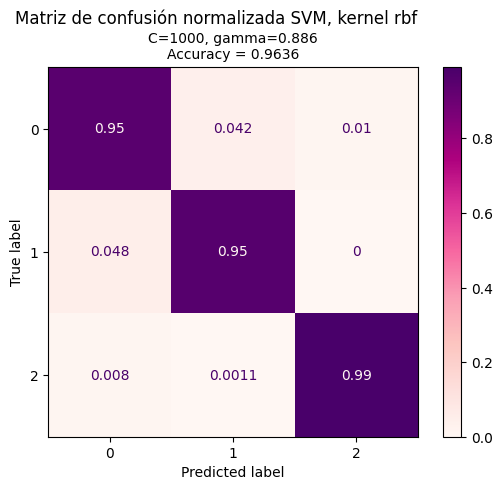

In [23]:
parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')
best_model_only_mean = make_clf(svc, parameters, df_train[[col for col in df_train.columns if col.startswith('mean_')]], y_train, df_val[[col for col in df_val.columns if col.startswith('mean_')]], y_val) # Solo las medias de las mediciones de cada sensor (EMPÍRICO)

y_pred = best_model_only_mean.predict(df_val[[col for col in df_val.columns if col.startswith('mean_')]]) # Predicción del conjunto de validación
folder = '/content/SVM/train/only_mean_dataset/grid_search/'
conf_mat(best_model_only_mean, y_val, y_pred)

El anterior resultó ser el mejor resultado en test, con un accuracy en test de 0.96!!!!!

### 6) Selección de características mediante métodos más sofisticados

#### Reducción de carcaterísticas mediante SelectKBest
De esta forma sofisticamos un poco la reducción de características, y se puede optimizar el resultado del accuracy en función de las características

Este conjunto tiene las 12 características de las señales captadas por los sensores R_1, R_2, R_3, R_4, esto está basado en ele hecho de que ne esa zona de la matriz de confusión hay un color más oscuro, por la escala de colores esto significa una mayor correlación con la clase

In [24]:
# selector = SelectKBest(score_func=f_classif, k=9).fit(df_train, y_train)
selector = SelectKBest(score_func=f_classif, k=54).fit(df_train, y_train)
# selector = SelectKBest(score_func=f_classif, k=9).fit(df_train[[col for col in df_train.columns if col.startswith('mean_')]], y_train)

best_indx_filter = np.where(selector.get_support())[0]
best_feat_filter = [df_train.keys()[i] for i in np.where(selector.get_support())[0]] #Toma los indices de aquellas características que fueron seleccionadas como importantes con el método y luego busca el nombre de la característica correspodiente en la lista original de nombres definida al inicio del código

print('Mejores características:', best_feat_filter)

# # Se define el nuevo conjunto de entrenamiento y validación tomando las características más importantes encontradas con este método
df_train_filter = df_train[best_feat_filter]
df_val_filter = df_val[best_feat_filter]
df_test_filter = df_test[best_feat_filter]

Mejores características: ['mean_R1', 'var_R1', 'mad_R1', 'max_R1', 'min_R1', 'ran_R1', 'sma_R1', 'enrgy_R1', 'iqr_R1', 'entpy_R1', 'mean_R2', 'var_R2', 'mad_R2', 'max_R2', 'min_R2', 'ran_R2', 'sma_R2', 'enrgy_R2', 'iqr_R2', 'entpy_R2', 'mean_R3', 'var_R3', 'mad_R3', 'max_R3', 'min_R3', 'ran_R3', 'sma_R3', 'enrgy_R3', 'iqr_R3', 'entpy_R3', 'mean_R4', 'var_R4', 'mad_R4', 'max_R4', 'min_R4', 'ran_R4', 'sma_R4', 'enrgy_R4', 'iqr_R4', 'entpy_R4', 'mean_R6', 'mad_R6', 'max_R6', 'min_R6', 'ran_R6', 'sma_R6', 'iqr_R6', 'arCoeff_R6', 'corr_R6', 'min_R7', 'mad_Humidity', 'max_Humidity', 'ran_Humidity', 'iqr_Humidity']


Tiempo GridSearch SVM lineal:  10.278931856155396


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.253608,0.0,0.123257,0.0,1,0.000148,"{'C': 1, 'gamma': 0.00014818141957159063}",0.522727,0.522727,0.0,25
1,0.219083,0.0,0.112718,0.0,1,0.001482,"{'C': 1, 'gamma': 0.0014818141957159065}",0.646465,0.646465,0.0,23
2,0.173607,0.0,0.090443,0.0,1,0.014818,"{'C': 1, 'gamma': 0.014818141957159064}",0.702020,0.702020,0.0,20
3,0.196314,0.0,0.099111,0.0,1,0.148181,"{'C': 1, 'gamma': 0.14818141957159064}",0.782828,0.782828,0.0,5
4,0.314675,0.0,0.125418,0.0,1,1.481814,"{'C': 1, 'gamma': 1.4818141957159063}",0.742424,0.742424,0.0,16
5,0.220009,0.0,0.111262,0.0,10,0.000148,"{'C': 10, 'gamma': 0.00014818141957159063}",0.638889,0.638889,0.0,24
6,0.189247,0.0,0.093856,0.0,10,0.001482,"{'C': 10, 'gamma': 0.0014818141957159065}",0.686869,0.686869,0.0,21
7,0.165582,0.0,0.080754,0.0,10,0.014818,"{'C': 10, 'gamma': 0.014818141957159064}",0.752525,0.752525,0.0,14
8,0.215787,0.0,0.090714,0.0,10,0.148181,"{'C': 10, 'gamma': 0.14818141957159064}",0.805556,0.805556,0.0,2
9,0.327827,0.0,0.124687,0.0,10,1.481814,"{'C': 10, 'gamma': 1.4818141957159063}",0.756313,0.756313,0.0,9


Tiempo entrenamiento SVM lineal:  2.860332489013672
Tiempo GridSearch + Entrenamiento = 13.139264345169067


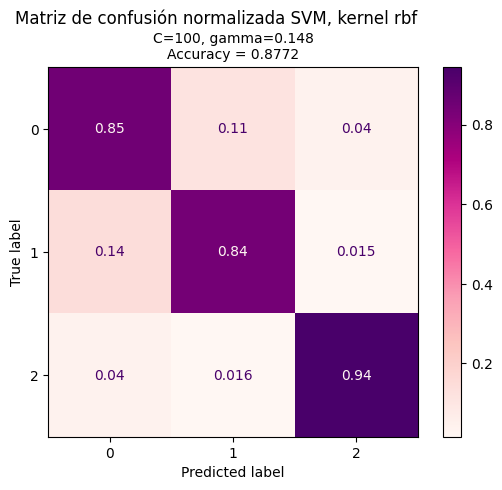

In [25]:
gamma_default = 1 / (df_val_filter.shape[1] * df_val_filter.var().mean())

parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')

best_model_k_best = make_clf(svc, parameters, df_train_filter, y_train, df_val_filter, y_val)

y_pred_filter = best_model_k_best.predict(df_val_filter)
folder = '/content/SVM/train/filter_method_dataset/grid_search/'
conf_mat(best_model_k_best, y_val, y_pred_filter)

#### Selección de características mediante *wrapper strategy*

In [26]:
# Asegúrate de que el SVC sea lineal
svc = svm.SVC(kernel='linear', C=10)
svc.fit(df_train, y_train)

# selector = SelectFromModel(estimator=svc, prefit=True, max_features=54, importance_getter='coef_') #Investigar que es prefit
selector = SelectFromModel(estimator=svc, max_features=54, threshold=-np.inf)

best_indx_wrapper = np.where(selector.get_support())[0]
best_feat_wrapper = [df_train.keys()[i] for i in np.where(selector.get_support())[0]] #Toma los indices de aquellas características que fueron seleccionadas como importantes con el método y luego busca el nombre de la característica correspodiente en la lista original de nombres definida al inicio del código

print('Mejores características:',best_feat_wrapper)
# Se define el nuevo conjunto de entrenamiento y validación tomando las características más importantes encontradas con este método
df_train_wrapper = df_train[best_feat_wrapper]
df_val_wrapper = df_val[best_feat_wrapper]
df_test_wrapper = df_test[best_feat_wrapper]

Mejores características: ['mean_R1', 'var_R1', 'max_R1', 'sma_R1', 'enrgy_R1', 'iqr_R1', 'entpy_R1', 'mean_R2', 'var_R2', 'mad_R2', 'ran_R2', 'sma_R2', 'enrgy_R2', 'iqr_R2', 'entpy_R2', 'mean_R3', 'var_R3', 'max_R3', 'min_R3', 'sma_R3', 'enrgy_R3', 'entpy_R3', 'mean_R4', 'var_R4', 'max_R4', 'min_R4', 'ran_R4', 'sma_R4', 'enrgy_R4', 'iqr_R4', 'enrgy_R5', 'mean_R6', 'var_R6', 'mad_R6', 'max_R6', 'min_R6', 'ran_R6', 'sma_R6', 'enrgy_R6', 'entpy_R6', 'mean_R7', 'var_R7', 'mad_R7', 'max_R7', 'min_R7', 'ran_R7', 'sma_R7', 'enrgy_R7', 'iqr_R7', 'var_R8', 'enrgy_R8', 'max_Humidity', 'min_Humidity', 'enrgy_Humidity']


Tiempo GridSearch SVM lineal:  8.797568798065186


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.263339,0.0,0.123800,0.0,1,0.000176,"{'C': 1, 'gamma': 0.00017625053399005178}",0.549242,0.549242,0.0,25
1,0.224095,0.0,0.111135,0.0,1,0.001763,"{'C': 1, 'gamma': 0.0017625053399005178}",0.643939,0.643939,0.0,23
2,0.168817,0.0,0.087666,0.0,1,0.017625,"{'C': 1, 'gamma': 0.017625053399005178}",0.713384,0.713384,0.0,19
3,0.164587,0.0,0.086319,0.0,1,0.176251,"{'C': 1, 'gamma': 0.17625053399005178}",0.808081,0.808081,0.0,12
4,0.253658,0.0,0.099046,0.0,1,1.762505,"{'C': 1, 'gamma': 1.7625053399005177}",0.886364,0.886364,0.0,9
5,0.229351,0.0,0.110446,0.0,10,0.000176,"{'C': 10, 'gamma': 0.00017625053399005178}",0.627525,0.627525,0.0,24
6,0.193577,0.0,0.092518,0.0,10,0.001763,"{'C': 10, 'gamma': 0.0017625053399005178}",0.700758,0.700758,0.0,21
7,0.162635,0.0,0.077866,0.0,10,0.017625,"{'C': 10, 'gamma': 0.017625053399005178}",0.771465,0.771465,0.0,14
8,0.161603,0.0,0.077153,0.0,10,0.176251,"{'C': 10, 'gamma': 0.17625053399005178}",0.891414,0.891414,0.0,8
9,0.287220,0.0,0.093528,0.0,10,1.762505,"{'C': 10, 'gamma': 1.7625053399005177}",0.898990,0.898990,0.0,2


Tiempo entrenamiento SVM lineal:  1.2517881393432617
Tiempo GridSearch + Entrenamiento = 10.049356937408447


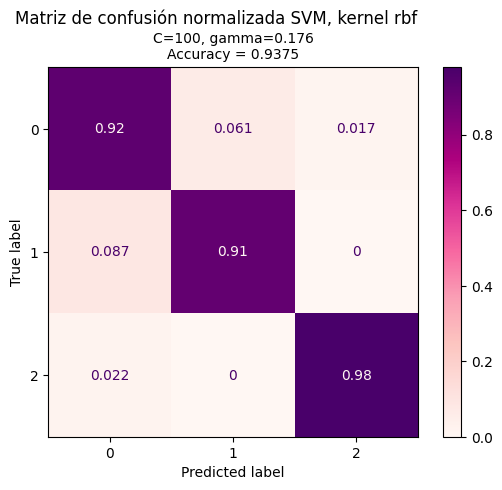

In [70]:
gamma_default = 1 / (df_val_wrapper.shape[1] * df_val_wrapper.var().mean())

parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')

# parameters = {'C':[1, 10, 100, 1000, 2000], 'degree':[2,3,4,5]} #MISMOS c PROBADOS EN LA BÚSQUEDA DEL MEJOR POLY
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

best_model_wrapper = make_clf(svc, parameters, df_train_wrapper, y_train, df_val_wrapper, y_val)

y_pred_wrapper = best_model_wrapper.predict(df_val_wrapper)
folder = '/content/SVM/train/wrapper_method_dataset/grid_search/'
conf_mat(best_model_wrapper, y_val, y_pred_wrapper)

#### Selección de carcaterísticas mediante PCA

In [28]:
pca = PCA(n_components=54)
pca.fit(df_train)

df_train_pca = pd.DataFrame(pca.transform(df_train))
df_val_pca = pd.DataFrame(pca.transform(df_val))
df_test_pca = pd.DataFrame(pca.transform(df_test))

Tiempo GridSearch SVM lineal:  10.853206872940063


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.286927,0.0,0.127306,0.0,1,0.000090,"{'C': 1, 'gamma': 8.963633710732663e-05}",0.539141,0.539141,0.0,25
1,0.215269,0.0,0.111128,0.0,1,0.000896,"{'C': 1, 'gamma': 0.0008963633710732663}",0.652778,0.652778,0.0,19
2,0.188469,0.0,0.096299,0.0,1,0.008964,"{'C': 1, 'gamma': 0.008963633710732662}",0.713384,0.713384,0.0,8
3,0.235386,0.0,0.109983,0.0,1,0.089636,"{'C': 1, 'gamma': 0.08963633710732663}",0.704545,0.704545,0.0,14
4,0.322562,0.0,0.134298,0.0,1,0.896363,"{'C': 1, 'gamma': 0.8963633710732662}",0.592172,0.592172,0.0,24
5,0.218656,0.0,0.110669,0.0,10,0.000090,"{'C': 10, 'gamma': 8.963633710732663e-05}",0.656566,0.656566,0.0,18
6,0.192027,0.0,0.094792,0.0,10,0.000896,"{'C': 10, 'gamma': 0.0008963633710732663}",0.693182,0.693182,0.0,16
7,0.183120,0.0,0.086385,0.0,10,0.008964,"{'C': 10, 'gamma': 0.008963633710732662}",0.739899,0.739899,0.0,2
8,0.295458,0.0,0.108118,0.0,10,0.089636,"{'C': 10, 'gamma': 0.08963633710732663}",0.717172,0.717172,0.0,6
9,0.321914,0.0,0.134917,0.0,10,0.896363,"{'C': 10, 'gamma': 0.8963633710732662}",0.602273,0.602273,0.0,20


Tiempo entrenamiento SVM lineal:  2.9201583862304688
Tiempo GridSearch + Entrenamiento = 13.773365259170532


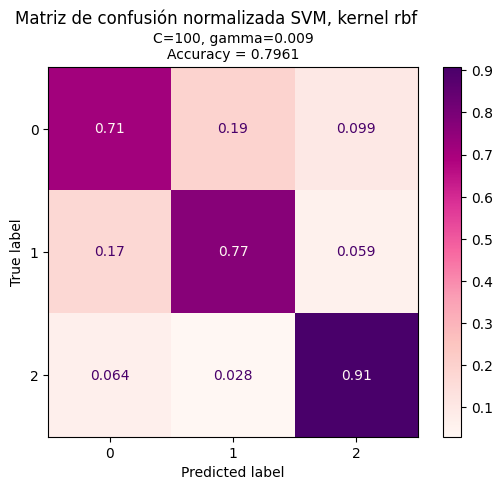

In [29]:
gamma_default = 1 / (df_val_pca.shape[1] * df_val_pca.var().mean())

parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')

# parameters = {'C':[1, 10, 100, 1000, 2000], 'degree':[2,3,4,5]} #MISMOS c PROBADOS EN LA BÚSQUEDA DEL MEJOR POLY
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

best_model = make_clf(svc, parameters, df_train_pca, y_train, df_val_pca, y_val)

y_pred_pca = best_model.predict(df_val_pca)
folder = '/content/SVM/train/PCA_method_dataset/grid_search/'
conf_mat(best_model, y_val, y_pred_pca)

#### Selección de carcaterísticas, máxima derivada y media

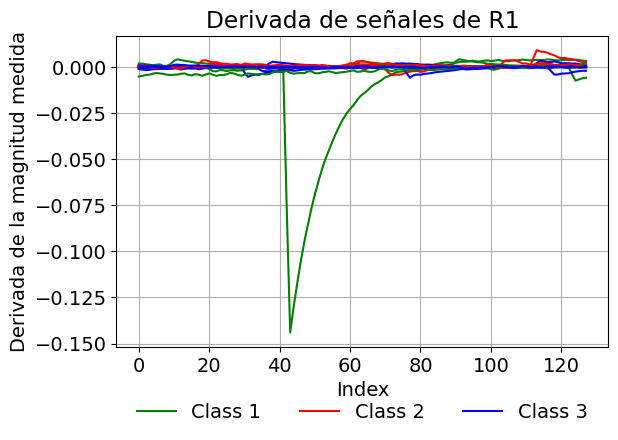

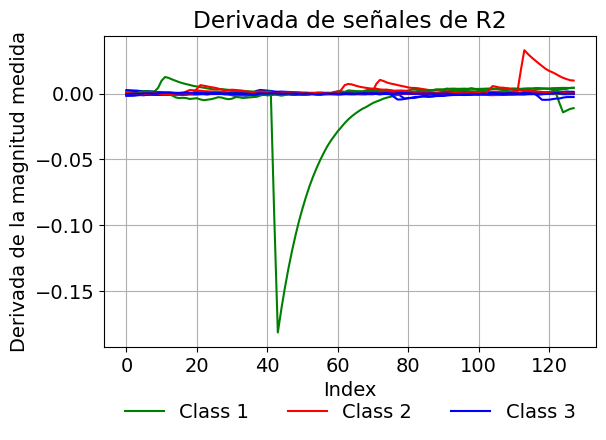

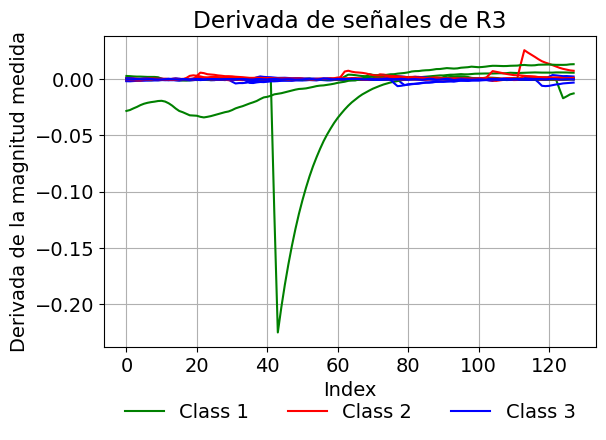

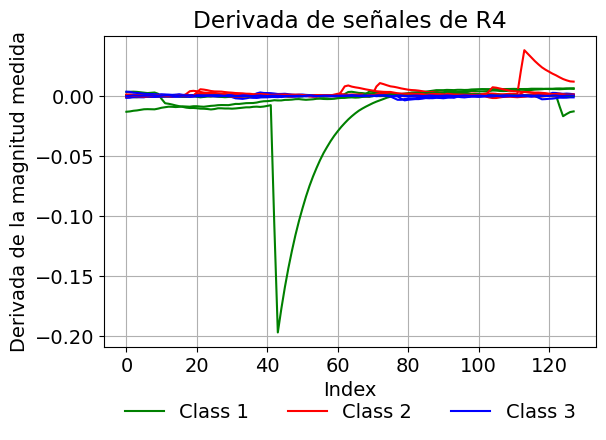

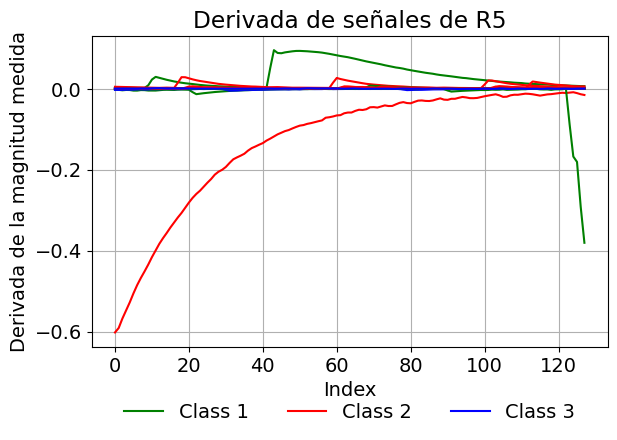

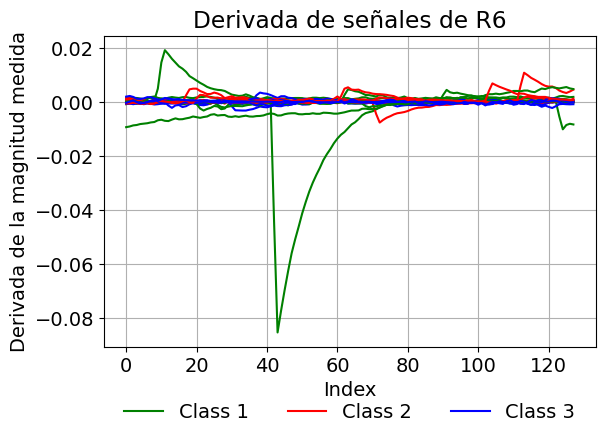

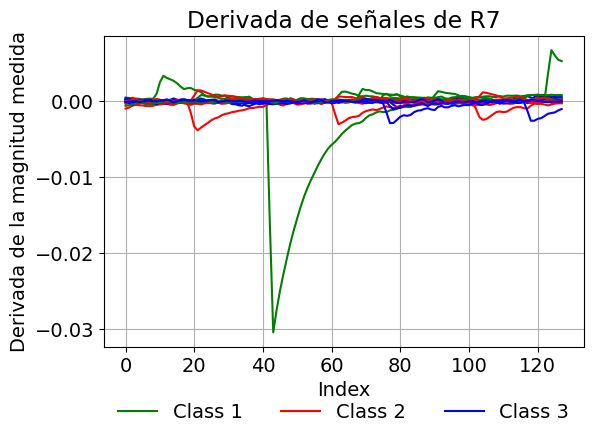

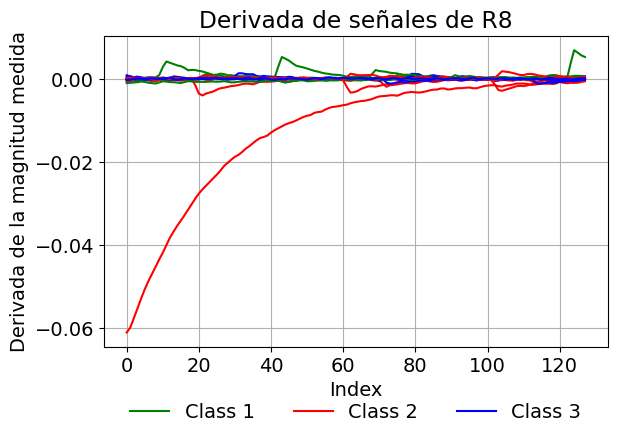

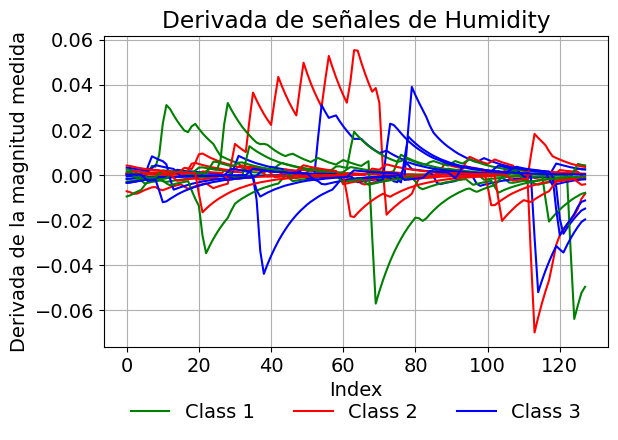

In [71]:
num_sign_per_graph = 6
rs = 20
folder = '/content/SVM/train/mean_and_gradient_dataset/' # Ruta para guardar los gráficos, variable global en este punto
os.makedirs(folder, exist_ok=True)

# Definición única de parámetros gráficos
plot_kwargs_1 = {'color': 'green','label': 'Class 1'}
plot_kwargs_2 = {'color': 'red', 'label': 'Class 2'}
plot_kwargs_3 = {'color': 'blue', 'label': 'Class 3'}
plt.rcParams.update({'font.size': 14})  # Cambia el número según el tamaño deseado

for start in range(9):
  idx = [start*128, start*128 + 128]

  plt.figure()
  plt.grid()
  plt.xlabel('Index')
  plt.ylabel('Derivada de la magnitud medida')

  plt.title(f'Derivada de señales de {df_trainval.iloc[:, idx[0]:idx[1]].keys()[0][:-2]}')

  for i in range(num_sign_per_graph):
    plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==1].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]]), **plot_kwargs_1)
    plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==2].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]]), **plot_kwargs_2)
    plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==3].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]]), **plot_kwargs_3)
    if i == 0:
      plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=3, frameon=False)
      plt.tight_layout()  # Ajusta el layout para que no se corte nada

  filename = f'gradient_signals_{df_trainval.iloc[:, idx[0]:idx[1]].keys()[0][:-2]}.pdf'

  filepath = os.path.join(folder, filename)
  plt.savefig(filepath)
  plt.show()

##### Cálculo de un nuevo vector de cracterísticas más intuitivas
Tales como pendiente, derivada, carcaterísticas asociadas a la monotonía de las funciones

In [72]:
def extract_features_II(signal):

  return {
      'mean': np.mean(signal),
      'max_grad': max(abs(np.gradient(signal)))
  }

def calculation_feature_vector_II(df_data):
    sensors = [f'R{j}' for j in range(1, 9)] + ['Humidity']
    feature_list = []

    for idx, row in df_data.iterrows():
        features = {}
        for sensor in sensors:
            start_col = f'{sensor}_0'
            end_col = f'{sensor}_127'
            signal = row[start_col:end_col].to_numpy()
            feats = extract_features_II(signal)

            # Prefix feature names with sensor ID
            feats_prefixed = {f'{key}_{sensor}': value for key, value in feats.items()}
            features.update(feats_prefixed)
        if 'class' in df_data.columns:
            features['class'] = row['class']
        feature_list.append(features)

    df_features = pd.DataFrame(feature_list)
    return df_features

##### Cálculo del vector de cracterísticas

In [32]:
train_val_data_II = calculation_feature_vector_II(df_trainval)
df_test_data_II = calculation_feature_vector_II(df_test_no_labels)

In [33]:
df_train_II, df_val_II = train_test_split(train_val_data_II, test_size=0.3, random_state=10, stratify=train_val_data_II['class'])
df_test_II = df_test_data_II.copy()

In [34]:
# df_test = calculation_feature_vector(df_test_no_labels)
scaler = StandardScaler().fit(df_train_II.iloc[:,0:-1])

df_train_II.iloc[:,0:-1] = scaler.transform(df_train_II.iloc[:,0:-1])
df_val_II.iloc[:,0:-1] = scaler.transform(df_val_II.iloc[:,0:-1])
df_test_II.iloc[:,0:] = scaler.transform(df_test_II.iloc[:,0:])

df_train_w_class_II = df_train_II.copy()
df_val_w_class_II = df_val_II.copy()

y_train = df_train_II.pop('class')# - 1
y_val = df_val_II.pop('class')# - 1

##### Matriz de correlación

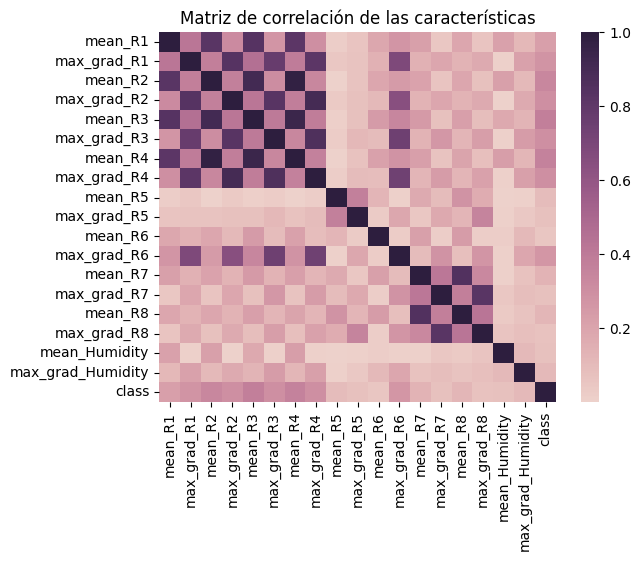

In [35]:
plt.rcParams.update({'font.size': 10})  # Cambia el número según el tamaño deseado
# correlation_data = df_train_w_class.corr(method='pearson')
correlation_data_abs_value = abs(df_train_w_class_II.corr(method='pearson'))
sns.heatmap(correlation_data_abs_value, cmap=sns.cubehelix_palette(as_cmap=True))
plt.title("Matriz de correlación de las características", fontsize=12)

folder = '/content/SVM/corr_mat/'
os.makedirs(folder, exist_ok=True)
plt.savefig(f'{folder}corr_lineal_means_and_grads.svg', format='svg', bbox_inches='tight', pad_inches=0)

Tiempo GridSearch SVM lineal:  6.689620733261108


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.152474,0.0,0.073214,0.0,1,0.000583,"{'C': 1, 'gamma': 0.0005829141633940371}",0.558081,0.558081,0.0,25
1,0.131305,0.0,0.062923,0.0,1,0.005829,"{'C': 1, 'gamma': 0.005829141633940372}",0.670455,0.670455,0.0,23
2,0.105179,0.0,0.051917,0.0,1,0.058291,"{'C': 1, 'gamma': 0.05829141633940371}",0.737374,0.737374,0.0,18
3,0.121340,0.0,0.054078,0.0,1,0.582914,"{'C': 1, 'gamma': 0.5829141633940371}",0.782828,0.782828,0.0,15
4,0.196467,0.0,0.067001,0.0,1,5.829142,"{'C': 1, 'gamma': 5.829141633940371}",0.820707,0.820707,0.0,9
5,0.133445,0.0,0.063025,0.0,10,0.000583,"{'C': 10, 'gamma': 0.0005829141633940371}",0.652778,0.652778,0.0,24
6,0.118010,0.0,0.053109,0.0,10,0.005829,"{'C': 10, 'gamma': 0.005829141633940372}",0.713384,0.713384,0.0,21
7,0.108107,0.0,0.046174,0.0,10,0.058291,"{'C': 10, 'gamma': 0.05829141633940371}",0.784091,0.784091,0.0,14
8,0.136008,0.0,0.047493,0.0,10,0.582914,"{'C': 10, 'gamma': 0.5829141633940371}",0.839646,0.839646,0.0,4
9,0.203549,0.0,0.066313,0.0,10,5.829142,"{'C': 10, 'gamma': 5.829141633940371}",0.827020,0.827020,0.0,6


Tiempo entrenamiento SVM lineal:  1.2575159072875977
Tiempo GridSearch + Entrenamiento = 7.947136640548706


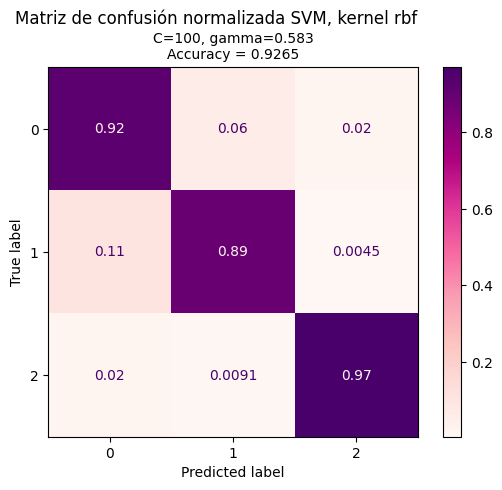

In [36]:
gamma_default = 1 / (df_val_II.shape[1] * df_val_II.var().mean())

parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')
best_model_mean_grad_dataset = make_clf(svc, parameters, df_train_II, y_train, df_val_II, y_val)

y_pred = best_model_mean_grad_dataset.predict(df_val_II) # Predicción del conjunto de validación
folder = '/content/SVM/train/new_feature_vector/grid_search/'
conf_mat(best_model_mean_grad_dataset, y_val, y_pred)

### Reducción de carcaterísticas

In [37]:
# Asegúrate de que el SVC sea lineal
svc = svm.SVC(kernel='linear', C=10)
svc.fit(df_train_II, y_train)

# selector = SelectFromModel(estimator=svc, prefit=True, max_features=54, importance_getter='coef_') #Investigar que es prefit
selector = SelectFromModel(estimator=svc, max_features=9, threshold=-np.inf)

best_indx_wrapper = np.where(selector.get_support())[0]
best_feat_wrapper = [df_train_II.keys()[i] for i in np.where(selector.get_support())[0]] #Toma los indices de aquellas características que fueron seleccionadas como importantes con el método y luego busca el nombre de la característica correspodiente en la lista original de nombres definida al inicio del código

print('Mejores características:',best_feat_wrapper)
# Se define el nuevo conjunto de entrenamiento y validación tomando las características más importantes encontradas con este método
df_train_II_wrapper = df_train_II[best_feat_wrapper]
df_val_II_wrapper = df_val_II[best_feat_wrapper]
df_test_II_wrapper = df_test_II[best_feat_wrapper]

Mejores características: ['mean_R1', 'mean_R2', 'max_grad_R2', 'mean_R3', 'mean_R4', 'mean_R5', 'mean_R6', 'max_grad_R6', 'max_grad_R7']


Tiempo GridSearch SVM lineal:  6.772560358047485


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.135684,0.0,0.063700,0.0,1,0.001134,"{'C': 1, 'gamma': 0.001134146772129865}",0.555556,0.555556,0.0,25
1,0.114808,0.0,0.057247,0.0,1,0.011341,"{'C': 1, 'gamma': 0.01134146772129865}",0.657828,0.657828,0.0,23
2,0.094747,0.0,0.046036,0.0,1,0.113415,"{'C': 1, 'gamma': 0.1134146772129865}",0.705808,0.705808,0.0,18
3,0.104953,0.0,0.047495,0.0,1,1.134147,"{'C': 1, 'gamma': 1.134146772129865}",0.758838,0.758838,0.0,11
4,0.133748,0.0,0.054104,0.0,1,11.341468,"{'C': 1, 'gamma': 11.341467721298649}",0.821970,0.821970,0.0,8
5,0.122483,0.0,0.057389,0.0,10,0.001134,"{'C': 10, 'gamma': 0.001134146772129865}",0.635101,0.635101,0.0,24
6,0.104476,0.0,0.047711,0.0,10,0.011341,"{'C': 10, 'gamma': 0.01134146772129865}",0.680556,0.680556,0.0,21
7,0.102502,0.0,0.042856,0.0,10,0.113415,"{'C': 10, 'gamma': 0.1134146772129865}",0.726010,0.726010,0.0,14
8,0.105053,0.0,0.041996,0.0,10,1.134147,"{'C': 10, 'gamma': 1.134146772129865}",0.803030,0.803030,0.0,9
9,0.162049,0.0,0.050350,0.0,10,11.341468,"{'C': 10, 'gamma': 11.341467721298649}",0.849747,0.849747,0.0,1


Tiempo entrenamiento SVM lineal:  1.5395328998565674
Tiempo GridSearch + Entrenamiento = 8.312093257904053


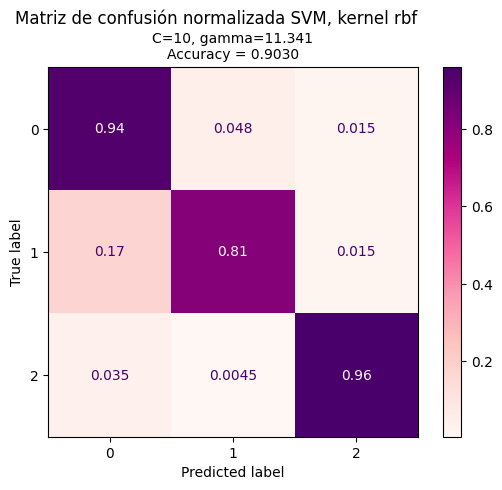

In [38]:
gamma_default = 1 / (df_val_II_wrapper.shape[1] * df_val_II_wrapper.var().mean())

parameters = {'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
svc = svm.SVC(kernel='rbf')

# parameters = {'C':[1, 10, 100, 1000, 2000], 'degree':[2,3,4,5]} #MISMOS c PROBADOS EN LA BÚSQUEDA DEL MEJOR POLY
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

best_model_wrapper = make_clf(svc, parameters, df_train_II_wrapper, y_train, df_val_II_wrapper, y_val)

y_pred_II_wrapper = best_model_wrapper.predict(df_val_II_wrapper)
folder = '/content/SVM/train/new_feature_vector/filter_method/grid_search/'
conf_mat(best_model_wrapper, y_val, y_pred_II_wrapper)

# 8) Predicción del conjunto de test

In [68]:
best_model_only_mean

SVC(C=1000, gamma=np.float64(0.8857553770170198))

In [236]:
# y_pred_test = best_model.predict(df_test)
y_pred_test = best_model_only_mean.predict(df_test[[col for col in df_test.columns if col.startswith('mean_')]])

with open('pred_test_best_SVM.csv', 'w') as f:
  f.write('Id,Category\n')
  for i in range(len(df_test)):
    f.write(f'{df_test.index[i]},{int(y_pred_test[i])}\n')

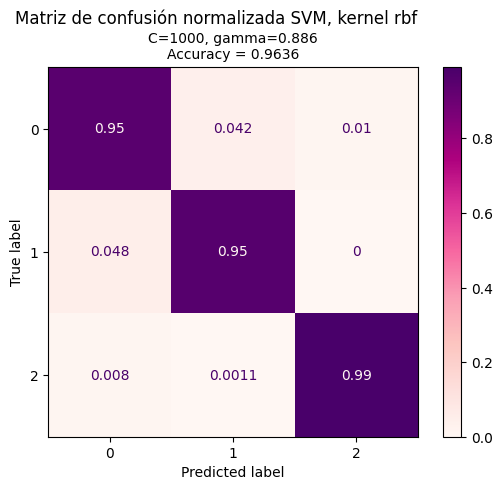

In [69]:
y_predd = best_model_only_mean.predict(df_val[[col for col in df_val.columns if col.startswith('mean_')]])
folder = '/content/borradores/'
conf_mat(best_model_only_mean, y_val, y_predd)

# Descargas de todos los gráficos

In [74]:
import os
import zipfile

folder_path = "/content/SVM"
zip_path = "/content/SVM.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            # Guardar la estructura relativa para mantener los subdirectorios
            arcname = os.path.relpath(file_path, start=folder_path)
            zipf.write(file_path, arcname=arcname)

#

# 7) b) **Clasificador ANN**

# Funciones necesarias

### Entrenamiento y validación

Se define una modificación del código base de EarlyStopping de Pytorch con el propósito de evitar que imprima cada vez que está guardando el modelo y la cuenta de cuantas épocas han pasado desde que el loss comenzó a subir de nuevo

In [75]:
# Sustituye esto:
from early_stopping_pytorch import EarlyStopping

# Por esto (versión propia):
class EarlyStoppingCustom:
    def __init__(self, patience=15, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float("inf")

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Guarda el modelo si ha habido mejora'''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), 'best_model.pt')
        self.val_loss_min = val_loss


Esta función se utiliza para entrenar el modelo y validarlo

In [43]:
# def train_model(model, patience, n_epochs, optimizer):
def train_model_generic(model, patience, n_epochs, optimizer, dataloader_tr, dataloader_vl):

  # Listas para guardar valores de loss por cada batch y por cada época
  train_losses = []
  valid_losses = []
  # Listas para guardar los pesos de cada batch, depende del tamaño de cada batch, esto es importante porque el último batch siempre es más pequeño
  batch_weights_train = []
  batch_weights_val = []
  # Listas para guardar la pérdida promedio de cada época
  avg_train_losses = []
  avg_valid_losses = []
  #Bandera para guardar el modelo una única vez bajo el nombre best_model.pt
  model_saved = False

  # initialize the early_stopping object
  early_stopping = EarlyStoppingCustom(patience=patience, verbose=False)

  start = time.time()
  for epoch in range(1, n_epochs + 1):

    # Entrenamiento
    model.train() # prep model for training

    for batch in dataloader_train:
      inputs = batch["features"].to(device)
      targets = batch["labels"].to(device) # Correponde a las clases de los datos

      # Igualar a 0 los gradientes de todas las variables optimizadas
      optimizer.zero_grad()
      # Predicciones
      output = model(inputs)
      # Cálculo de la pérdida
      loss = criterion(output, targets)
      # backward pass
      loss.backward()
      # Actualización de parámetros de la red (mediante Adam)
      optimizer.step()
      train_losses.append(loss.item())
      batch_weights_train.append(targets.size(0))

    # Validación
    model.eval()
    with torch.no_grad():
      for batch in dataloader_val:
        inputs = batch["features"].to(device)
        targets = batch["labels"].to(device)

        # Predicciones
        output = model(inputs)
        # Cálculo de la pérdida
        loss = criterion(output, targets)
        # Loss de validación de un solo batch
        valid_losses.append(loss.item())
        batch_weights_val.append(targets.size(0))


    train_loss = np.average(np.array(train_losses), weights = np.array(batch_weights_train))
    valid_loss = np.average(np.array(valid_losses), weights = np.array(batch_weights_val))

    # Se calcula el promedio del loss de todas las épocas
    avg_train_losses.append(train_loss)
    avg_valid_losses.append(valid_loss)

    epoch_len = len(str(n_epochs))

    print_msg = (f'[{epoch:>{epoch_len}}/{n_epochs:>{epoch_len}}] ' + f'train_loss: {train_loss:.6f} ' + f'valid_loss: {valid_loss:.6f}')
    # print(print_msg)

    # Se reinician las listas para guardar los valores de loss y los pesos de cada batch de la siguiente época
    train_losses = []
    valid_losses = []
    batch_weights_train = []
    batch_weights_val = []

    early_stopping(valid_loss, model)

    if early_stopping.early_stop and not model_saved:
        best_epoch = epoch - patience
        val_loss_min = avg_valid_losses[best_epoch - 1]
        print('Early stopping at -------------------------------------------------->',best_epoch)
        torch.save(model.state_dict(), 'best_model.pt') # En la línea a continuación se guarda el último checkpoint guardado por earlystopping, despues no se vuelve a guardar bajo este mismo nombre, de manera que este es el mejor modelo basado en patience early stopping
        model_saved = True
        training_time = time.time() - start # Se calcula aqui porque el modelo puede terminar de entrenarse antes de las 1000 épocas, por lo tanto, no sería correcto calcularlo al final, ya que el loss de validación y entrenamiento que se sigue calculando es para ver que tanto diverge el de validación en comparación al de entrenamiento para la totalidad de las épocas

  # Cargar el mejor modelo guardado con el criterio de patience early stopping
  model.load_state_dict(torch.load('best_model.pt', weights_only=True))
  print(f"Mejor modelo en la época {best_epoch} con loss de validación = {val_loss_min:.6f}")

  return  model, avg_train_losses, avg_valid_losses, training_time, best_epoch, dataloader_tr, dataloader_vl

### Gráficos de resultados

In [100]:
plt.rcParams.update({'font.size': 10})  # Cambia el número según el tamaño deseado

def results_ANN(model, train_loss_values, valid_loss_values, t_time, best_ep, dataloader_tr, dataloader_vl):
    os.makedirs(ruta, exist_ok=True)

    # Obtener el nombre del modelo
    nombre_red = model.name  # Devuelve: 'MiRed'
    epochs = np.linspace(1, len(train_loss_values), len(train_loss_values))
    loss_valid_best_epoch = valid_loss_values[best_ep - 1]
    loss_train_best_epoch = train_loss_values[best_ep - 1]

    # Gráfico de loss de validación y entrenamiento
    prop = 0.95
    figsize = (prop*6.4, 0.95*4.8)
    plt.figure(figsize = figsize)
    plt.plot(epochs, train_loss_values, lw=1, color='blue', label='Train')
    plt.plot(epochs, valid_loss_values, lw=1, color='red', label='Validation')
    plt.axvline(x=best_ep, color='black', ls='--', lw=1)#, label='Best epoch')
    plt.text(x=best_ep, y=0.8, s=f'Valid Loss: {loss_valid_best_epoch:.4f}\nTrain Loss: {loss_train_best_epoch:.4f}\nBest epoch: {best_ep}', fontsize=8, fontfamily='sans-serif', verticalalignment='top', horizontalalignment='left', bbox=dict(facecolor='yellow', boxstyle='round', alpha=1))
    plt.text(x=0, y=0.02, s=f'Tiempo de entrenamiento: {t_time:.2f} [s]', fontsize=8, fontfamily='sans-serif', verticalalignment='bottom', horizontalalignment='left', bbox=dict(facecolor='yellow', boxstyle='round', alpha=1))
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.ylim(-0.05,1)
    if nombre_red[-6] != '1':
      plt.title(f'Loss de entrenamiento y validación, ANN de\n{nombre_red[-6]} capas ocultas de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}')
    else:
      plt.title(f'Loss de entrenamiento y validación, ANN de\ncapa oculta de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}')
    plt.grid()
    plt.legend()
    plt.savefig(f'{ruta}loss_epoch{nombre_red[5:]}.pdf')

    # Matriz de confusión normalizada - Conjunto de entrenamiento
    model.eval()
    all_preds = []
    all_labels = []
    correct_total = 0
    total = 0

    with torch.no_grad():
      for batch in dataloader_train:
          inputs = batch["features"].to(device)
          targets = batch["labels"].to(device)

          # Predicciones
          output = model(inputs)
          output = torch.softmax(output, dim=1)  # predictions.shape = [batch_size]

          # Acumula las predicciones y etiquetas
          out = torch.argmax(output, dim=1)  # Forma [batch_size]
          all_preds.append(out.cpu().numpy())
          all_labels.append(targets.cpu().numpy())

          # Contar aciertos en este batch
          predicted_classes = torch.argmax(output, dim=1)  # Forma [batch_size]
          correct = (predicted_classes == targets).sum().item()
          correct_total += correct # Contador de predicciones correctas
          total += targets.size(0) #Tamaño de cada batch

    # Concatenar todas las predicciones y etiquetas
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)

    # Precisión
    accuracy_tr = correct_total / total

    # Mostrar la matriz de confusión
    disp = ConfusionMatrixDisplay(np.round(confusion_matrix(all_labels, all_preds, normalize='true'), decimals=4))#, display_labels=labels_train)
    disp.plot(cmap='RdPu')

    if nombre_red[-6] != '1':
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de entrenamiento, ANN de\n{nombre_red[-6]} capas ocultas de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)
    else:
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de entrenamiento, ANN de\ncapa oculta de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)

    plt.title(f'Accuracy = {accuracy_tr:.4f}', fontsize = 10)
    plt.savefig(f'{ruta}conf_mat_train{nombre_red[5:]}.pdf', bbox_inches='tight')


    # Matriz de confusión normalizada - Conjunto de validación
    all_preds = []
    all_labels = []
    correct_total = 0
    total = 0
    with torch.no_grad():

      for batch in dataloader_val:
          inputs = batch["features"].to(device)
          targets = batch["labels"].to(device)

          # Predicciones
          output = model(inputs)
          output = torch.softmax(output, dim=1)  # predictions.shape = [batch_size]

          # Acumula las predicciones y etiquetas
          out = torch.argmax(output, dim=1)  # Forma [batch_size]
          all_preds.append(out.cpu().numpy())
          all_labels.append(targets.cpu().numpy())

          # Contar aciertos en este batch
          predicted_classes = torch.argmax(output, dim=1)  # Forma [batch_size]
          correct = (predicted_classes == targets).sum().item()
          correct_total += correct # Contador de predicciones correctas
          total += targets.size(0) #Tamaño de cada batch

    # Concatenar todas las predicciones y etiquetas
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)

    # Precisión
    accuracy_vl = correct_total / total
    # print(f"Accuracy promedio conjunto de entrenamiento: {accuracy:.4f}")

    # Mostrar la matriz de confusión
    disp = ConfusionMatrixDisplay(np.round(confusion_matrix(all_labels, all_preds, normalize='true'), decimals=4))#, display_labels=labels_train)
    disp.plot(cmap='RdPu')
    if nombre_red[-6] != '1':
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de validación, ANN de\n{nombre_red[-6]} capas ocultas de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)
    else:
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de validación, ANN de\ncapa oculta de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)
    plt.title(f'Accuracy = {accuracy_vl:.4f}', fontsize = 10)
    plt.savefig(f'{ruta}conf_mat_val{nombre_red[5:]}.pdf', bbox_inches='tight')

    plt.show()

    return accuracy_vl

Se vuelven a crear los conjunto de entrenamiento para verificar que no han sido sobreescritos

In [83]:
df_train, df_val = train_test_split(train_val_data, test_size=0.3, random_state=10, stratify=train_val_data['class'])

df_train_GS, df_val_GS = train_test_split(df_val, test_size=0.3, random_state=10, stratify=df_val['class'])

df_test = df_test_data.copy()

In [86]:
df_train

,mean_R1,var_R1,mad_R1,max_R1,min_R1,ran_R1,sma_R1,enrgy_R1,iqr_R1,entpy_R1,...,max_Humidity,min_Humidity,ran_Humidity,sma_Humidity,enrgy_Humidity,iqr_Humidity,entpy_Humidity,arCoeff_Humidity,corr_Humidity,class
5693,12.644984,3.466606e-05,0.00495,12.65440,12.6340,0.02040,1618.55790,159.895645,0.009925,4.852030,...,58.1536,57.9196,0.2340,7424.1937,3364.181590,0.113625,4.852029,0.333149,0.999443,1.0
2435,12.371512,3.985797e-05,0.00425,12.38260,12.3591,0.02350,1583.55360,153.054361,0.010100,4.852030,...,60.1148,59.7786,0.3362,7672.6030,3593.077966,0.167450,4.852029,0.331350,0.996545,2.0
67,12.788637,8.804560e-05,0.00690,12.80430,12.7748,0.02950,1636.94550,163.549317,0.018325,4.852030,...,59.2670,58.3929,0.8741,7536.8482,3467.108769,0.387925,4.852021,0.332383,0.998498,1.0
7082,13.122703,7.453027e-07,0.00030,13.12470,13.1207,0.00400,1679.70600,172.205338,0.000425,4.852030,...,52.6503,52.5968,0.0535,6735.6534,2769.105902,0.027900,4.852030,0.331276,0.995481,2.0
5029,12.057973,5.894021e-04,0.02225,12.10310,12.0260,0.07710,1543.42050,145.395294,0.037100,4.852028,...,67.1463,66.1757,0.9706,8526.2214,4437.108262,0.256500,4.852022,0.332120,0.998929,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,12.889478,3.001749e-05,0.00080,12.89860,12.8842,0.01440,1649.85320,166.138676,0.010825,4.852030,...,53.1508,52.9711,0.1797,6790.1312,2814.083029,0.100650,4.852030,0.331556,0.996953,2.0
5723,11.675642,8.976820e-03,0.01860,11.73680,11.2474,0.48940,1494.48220,136.329597,0.050175,4.851997,...,63.4139,62.5356,0.8783,8016.2366,3922.151539,0.071225,4.852027,0.330187,0.999961,1.0
8741,12.713240,2.867037e-05,0.00145,12.72110,12.7011,0.02000,1627.29470,161.626496,0.009600,4.852030,...,54.7245,54.4134,0.3111,6982.7874,2976.038085,0.133525,4.852029,0.333604,0.999312,3.0
1939,12.800555,4.148926e-04,0.01595,12.83220,12.7644,0.06780,1638.47110,163.854635,0.031325,4.852029,...,64.5677,64.2084,0.3593,8239.2082,4143.362774,0.284550,4.852028,0.332966,0.999677,2.0


Separar en conjuntos de características y las clases, además de normalizan los conjuntos de entrenamieno, validación y test

In [87]:
# df_test = calculation_feature_vector(df_test_no_labels)
scaler = StandardScaler().fit(df_train.iloc[:,0:-1])

df_train.iloc[:,0:-1] = scaler.transform(df_train.iloc[:,0:-1])
df_val.iloc[:,0:-1] = scaler.transform(df_val.iloc[:,0:-1])
df_test.iloc[:,:] = scaler.transform(df_test_data.iloc[:,0:])

df_train_GS.iloc[:,0:-1] = scaler.transform(df_train_GS.iloc[:,0:-1])
df_val_GS.iloc[:,0:-1] = scaler.transform(df_val_GS.iloc[:,0:-1])

df_train_w_class = df_train.copy()
df_val_w_class = df_val.copy()

df_train_GS_w_class = df_train_GS.copy()
df_val_GS_w_class = df_val_GS.copy()

y_train = df_train.pop('class')# - 1
y_val = df_val.pop('class')# - 1

y_train_GS = df_train_GS.pop('class')# - 1
y_val_GS = df_val_GS.pop('class')# - 1

Función para crear un dataloader con cualquier conjunto de datos

In [88]:
def dataloader_creator(X_train, y_train, X_val, y_val, X_test, batch_size=128):

    # Convertir todo a array y clases en formato int
    X_train = np.array(X_train)
    y_train = np.array(y_train).astype(int)

    X_val = np.array(X_val)
    y_val = np.array(y_val).astype(int)

    X_test = np.array(X_test)

    # Dataset de entrenamiento y validación
    dataset_train = [{"features": X_train[i], "labels": y_train[i]} for i in range(len(y_train))]
    dataset_val   = [{"features": X_val[i],   "labels": y_val[i]}   for i in range(len(y_val))]

    # Dataset de test (sin etiquetas)
    dataset_test  = [{"features": X_test[i]} for i in range(len(X_test))]

    # DataLoaders
    dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
    dataloader_val   = torch.utils.data.DataLoader(dataset_val, batch_size=batch_size, shuffle=False)
    dataloader_test  = torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=False)

    return dataloader_train, dataloader_val, dataloader_test

### Crear datasets y dataloaders para pytorch (train)

Datasets de todo el vector de cracaterísticas

In [63]:
# Crear datasets
feats_train = df_train.to_numpy()[:,0:108].astype(np.float32)
labels_train = df_train_w_class.to_numpy()[:,108].astype(int) - 1
dataset_train = [ {"features":feats_train[i,:], "labels":labels_train[i]} for i in range(feats_train.shape[0]) ]

feats_val = df_val.to_numpy()[:,0:108].astype(np.float32)
labels_val = df_val_w_class.to_numpy()[:,108].astype(int) - 1
dataset_val = [ {"features":feats_val[i,:], "labels":labels_val[i]} for i in range(feats_val.shape[0]) ]

feats_test = df_test.to_numpy()[:,:].astype(np.float32)
dataset_test = [ {"features":feats_test[i,:]} for i in range(feats_test.shape[0]) ]

Datasets de los subconjuntos de validación

In [64]:
feats_train_GS = df_train_GS.to_numpy()[:,0:108].astype(np.float32)
labels_train_GS = df_train_GS_w_class.to_numpy()[:,108].astype(int) - 1
dataset_train_GS = [ {"features":feats_train_GS[i,:], "labels":labels_train_GS[i]} for i in range(feats_train_GS.shape[0]) ]

feats_val_GS = df_val_GS.to_numpy()[:,0:108].astype(np.float32)
labels_val_GS = df_val_GS_w_class.to_numpy()[:,108].astype(int) - 1
dataset_val_GS = [ {"features":feats_val_GS[i,:], "labels":labels_val_GS[i]} for i in range(feats_val_GS.shape[0]) ]

In [65]:
# Crear dataloaders
dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=128, shuffle=True, num_workers=0)
dataloader_val = torch.utils.data.DataLoader(dataset_val, batch_size=128, shuffle=True, num_workers=0)
dataloader_test = torch.utils.data.DataLoader(dataset_test, batch_size=128, shuffle=True, num_workers=0)

dataloader_train_GS = torch.utils.data.DataLoader(dataset_train_GS, batch_size=128, shuffle=True, num_workers=0)
dataloader_val_GS = torch.utils.data.DataLoader(dataset_val_GS, batch_size=128, shuffle=True, num_workers=0)

### Función para crear el dataloader de los conjuntos reducidos de características

Función para crear el dataloader de los conjuntos reducidos de características

In [66]:
def dataloader_creator_GS(df_features, labels, batch_size=128, test_size=0.3, random_state=10):

    labels = np.array(labels).astype(int)

    # Separar datos
    X_train, X_val, y_train, y_val = train_test_split(
        df_features.to_numpy().astype(np.float32),
        labels,
        test_size=test_size,
        random_state=random_state,
        stratify=labels
    )

    # Crear datasets como listas de diccionarios
    dataset_train = [{"features": X_train[i], "labels": y_train[i]} for i in range(len(y_train))]
    dataset_val   = [{"features": X_val[i],   "labels": y_val[i]}   for i in range(len(y_val))]

    # Crear DataLoaders
    dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
    dataloader_val   = torch.utils.data.DataLoader(dataset_val,   batch_size=batch_size, shuffle=False)

    return dataloader_train, dataloader_val


## Dispositivo y función de Loss

In [67]:
device = torch.device('cuda')
criterion = nn.CrossEntropyLoss()

# Grid Search para encontrar los mejores hiperparámetros de la ANN


Se define un subconjunto de entrenamiento y validación a partir del conjunto de validación, esto se hace para encontrar los mejores hiperparámetros de la red, tales como la función de activación, el número de capas ocultas y el número de perceptrones en las capas ocultas

In [89]:
def GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dl_train, dl_val):
  res = []

  for h in hidden_sizes:
      for act_name, act_func in activations.items():
          for layers in num_hidden_layers:
              for lr in learning_rates:
                  layers_list = [nn.Linear(108, h)]
                  for _ in range(layers - 1):
                      layers_list.append(nn.Linear(h, h))
                  layers_list.append(act_func())
                  layers_list.append(nn.Linear(h, 3))

                  model = nn.Sequential(*layers_list).to(device)
                  model.name = f'model_{h}co{layers}_{act_name}'
                  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

                  print(f'\nEntrenando: {model.name} con LR={lr}')
                  model_validated, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model, patience=patience, n_epochs=n_epochs, optimizer=optimizer, dataloader_tr=dl_train, dataloader_vl=dl_val)
                  # model_validated, train_loss, valid_loss, t_time, best_ep = validate_model(model, patience=15, n_epochs=400, optimizer=optimizer)
                  acc_val_GS = results_ANN(model_validated, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

                  # Guardar resultados
                  res.append({
                      "name": model.name,
                      "activation": act_func,
                      "layers": layers,
                      "hidden_size": h,
                      "lr": lr,
                      "valid_loss": valid_loss[best_ep - 1],
                      "train_loss": train_loss[best_ep - 1],
                      "best_epoch": best_ep,
                      "time": t_time,
                      "acc_val": acc_val_GS})

                  # Liberar modelo y memoria GPU
                  del model
                  del optimizer
                  torch.cuda.empty_cache()
                  gc.collect()

  res = pd.DataFrame(res).sort_values(by='acc_val', ascending=False)
  res.index = np.arange(1, len(res) + 1)  # Índice desde 1
  return res

Función para construir una ANN a partir del mejor resultado del Grid Search

In [90]:
def ANN_by_name(res):
  model_name = res.iloc[0,0]

  h = res.iloc[0,3]
  n = res.iloc[0,2]
  activ_funct = res.iloc[0,1]
  lr = res.iloc[0,4]

  layers_list = [nn.Linear(108, h)]
  for _ in range(n - 1):
      layers_list.append(nn.Linear(h, h))

  layers_list.append(activ_funct())
  layers_list.append(nn.Linear(h, 3))

  model = nn.Sequential(*layers_list).to(device)
  model.name = model_name

  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

  return model, optimizer

In [91]:
def ANN_by_name_v2(res):
  model_name = res.iloc[0,0]

  h = res.iloc[0,3]
  n = res.iloc[0,2]
  activ_funct = res.iloc[0,1]
  lr = res.iloc[0,4]

  layers_list = [nn.Linear(108, h)]
  for _ in range(n - 1):
      layers_list.append(nn.Linear(h, h))
      layers_list.append(activ_funct())

  # layers_list.append(activ_funct())
  layers_list.append(nn.Linear(h, 3))

  model = nn.Sequential(*layers_list).to(device)
  model.name = model_name

  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

  return model, optimizer

Ejecución del Grid Search utilizando el conjunto de validación


Entrenando: model_40co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 123
Mejor modelo en la época 123 con loss de validación = 0.407033


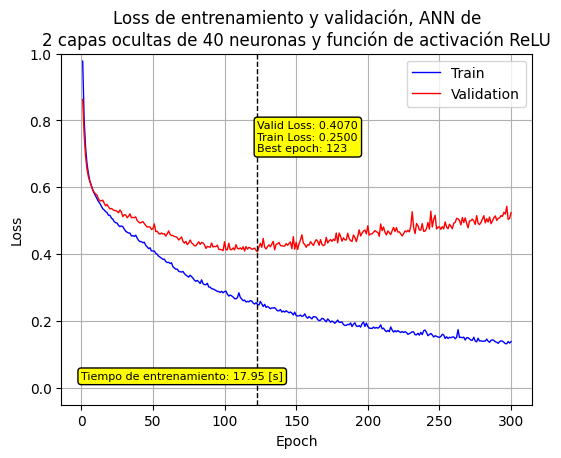

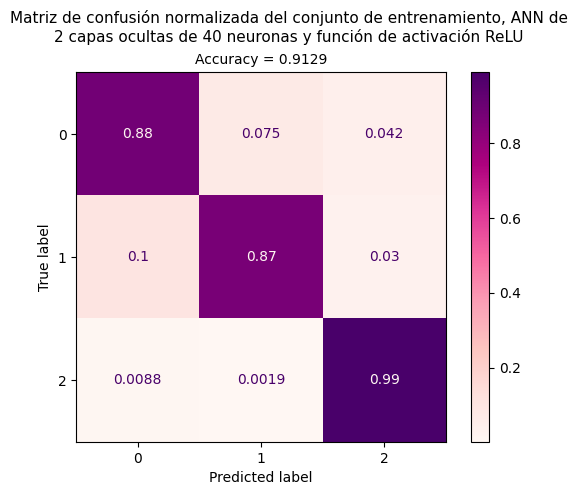

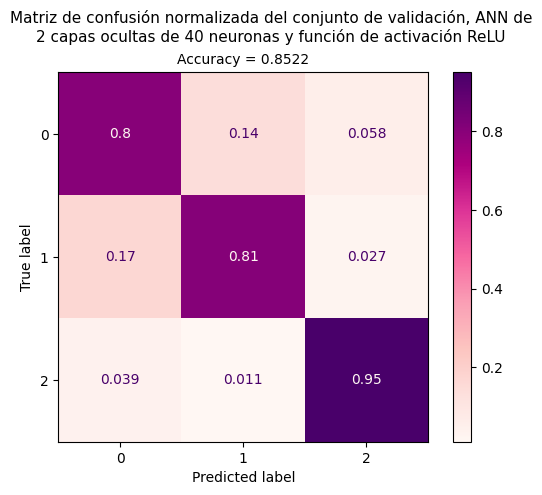


Entrenando: model_40co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 83
Mejor modelo en la época 83 con loss de validación = 0.441457


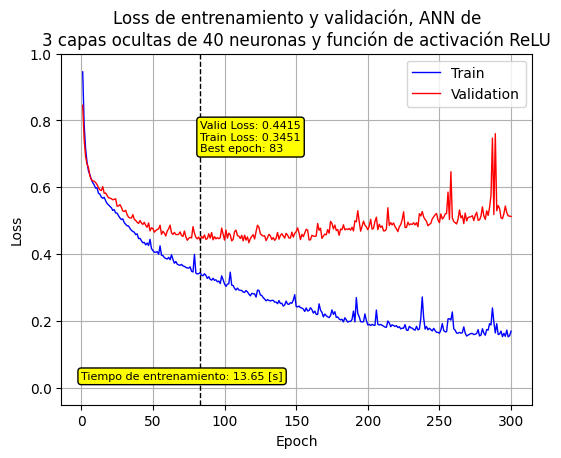

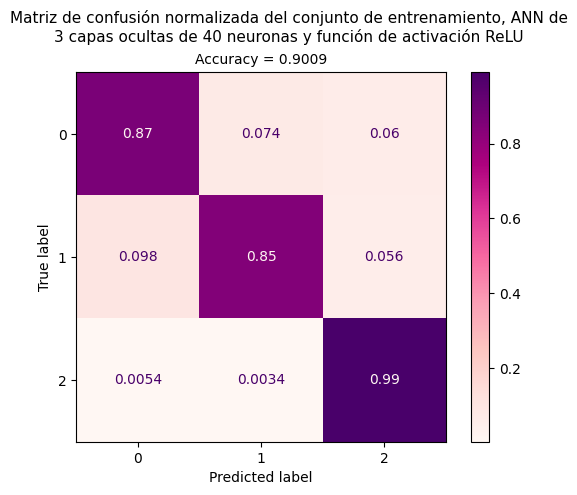

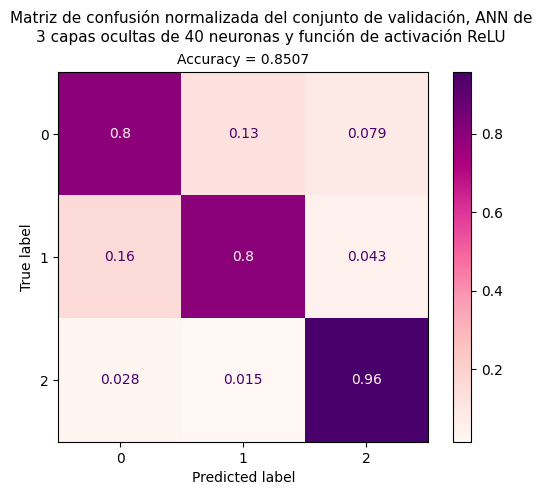


Entrenando: model_40co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 98
Mejor modelo en la época 98 con loss de validación = 0.408301


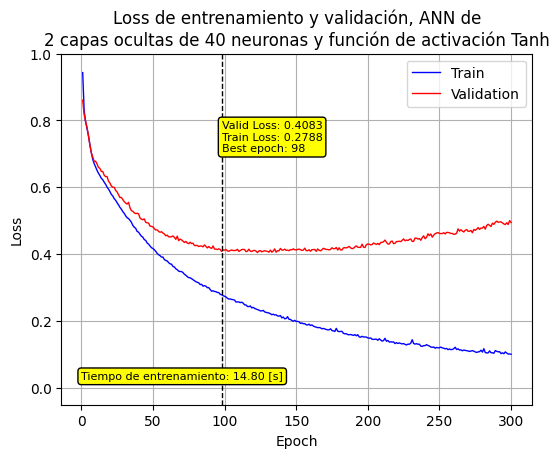

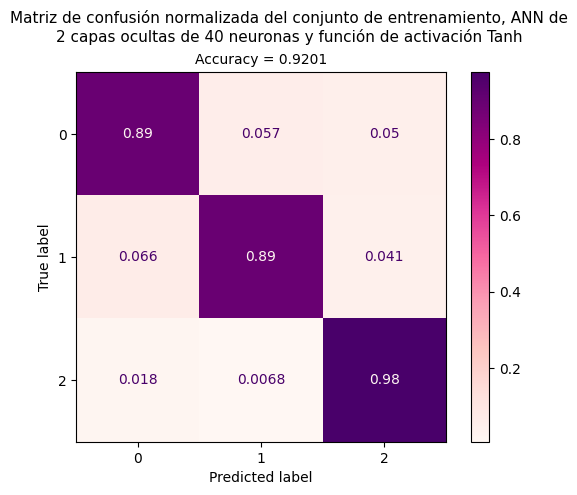

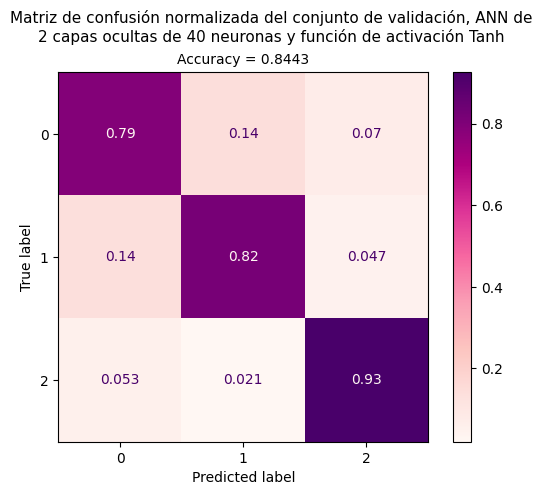


Entrenando: model_40co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 102
Mejor modelo en la época 102 con loss de validación = 0.429346


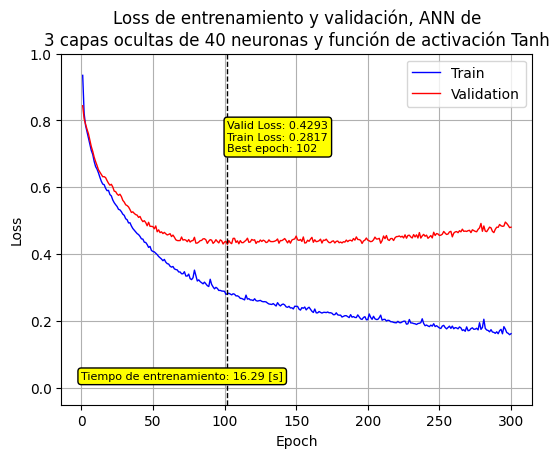

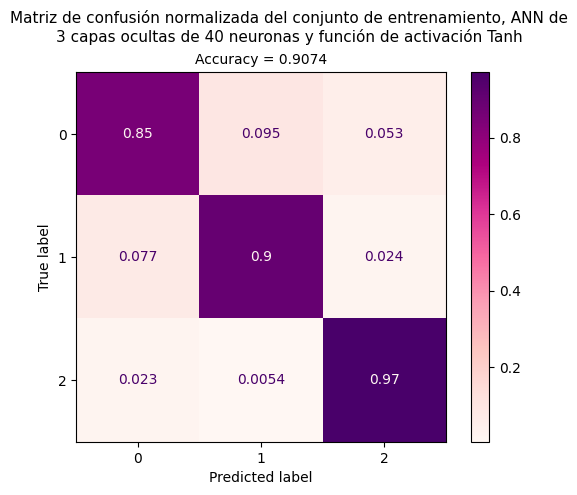

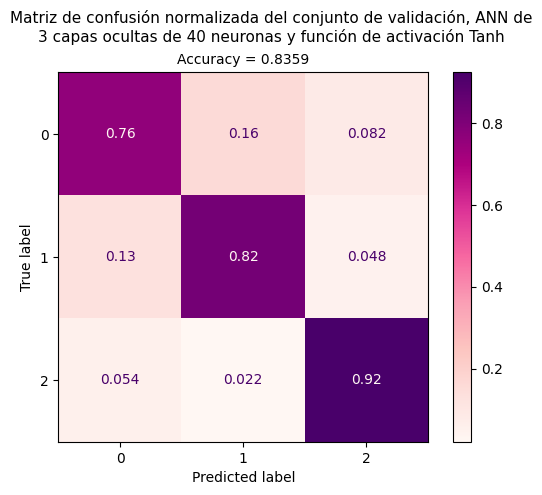


Entrenando: model_90co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 66
Mejor modelo en la época 66 con loss de validación = 0.360300


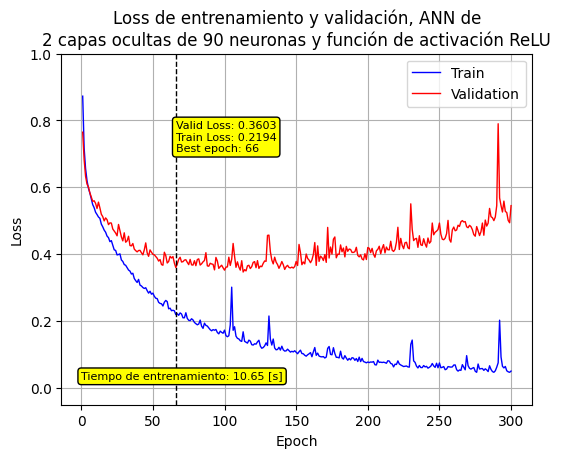

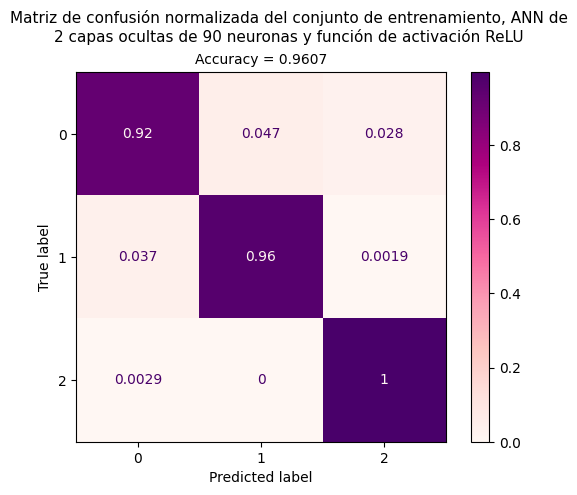

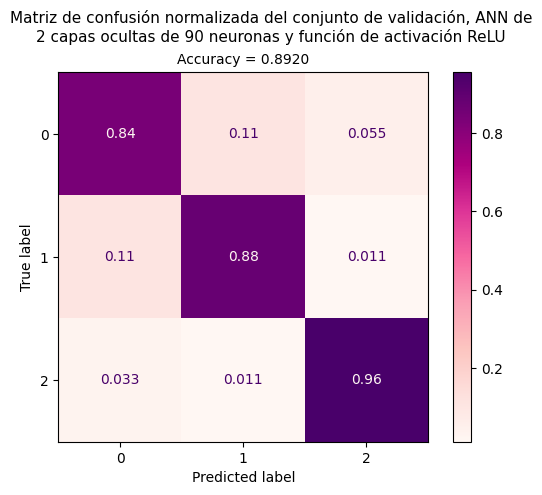


Entrenando: model_90co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 99
Mejor modelo en la época 99 con loss de validación = 0.352213


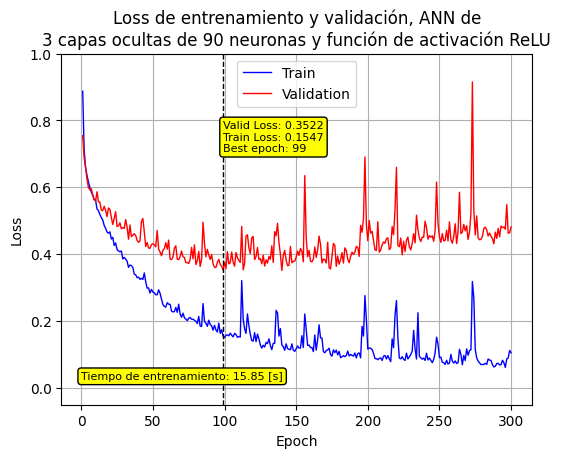

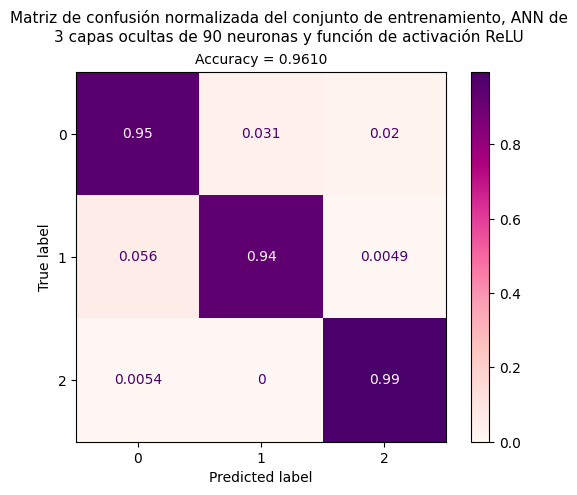

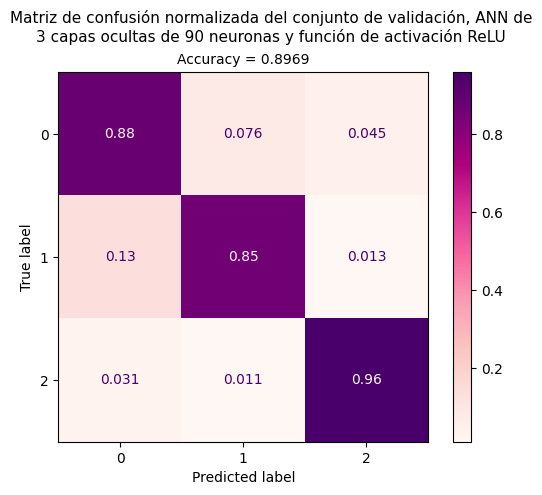


Entrenando: model_90co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 91
Mejor modelo en la época 91 con loss de validación = 0.295496


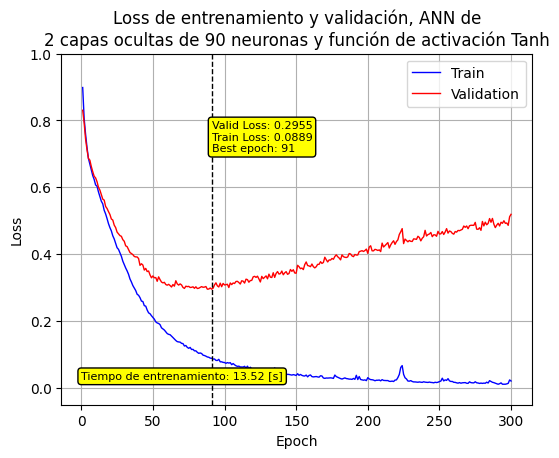

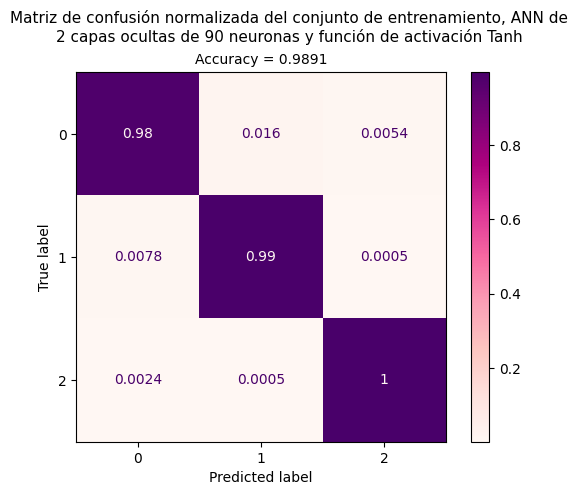

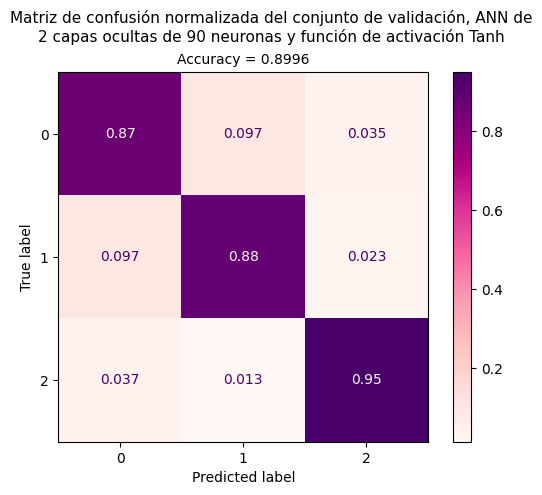


Entrenando: model_90co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 72
Mejor modelo en la época 72 con loss de validación = 0.297839


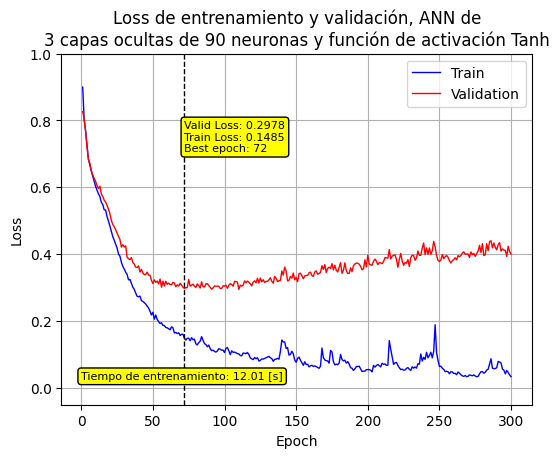

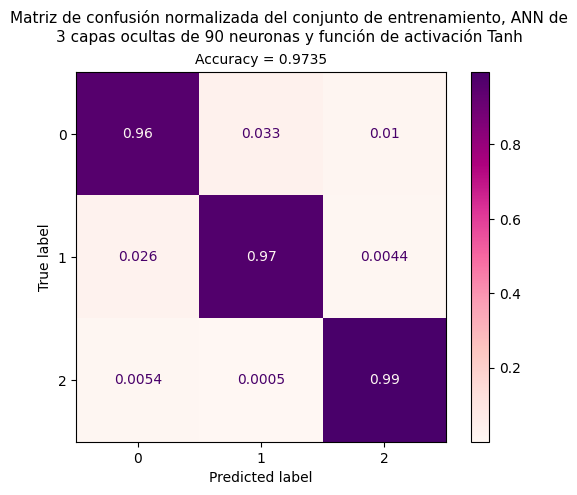

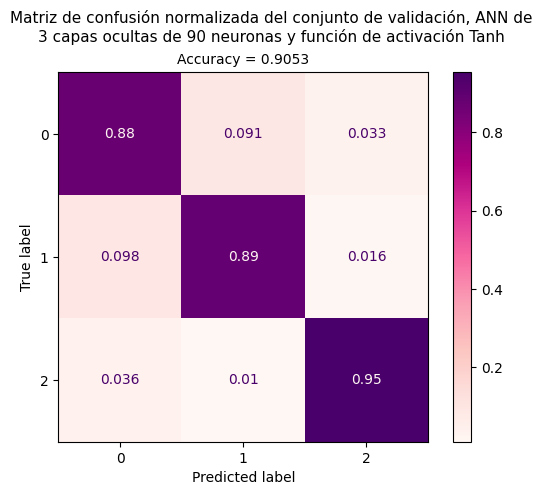


Entrenando: model_140co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 72
Mejor modelo en la época 72 con loss de validación = 0.373189


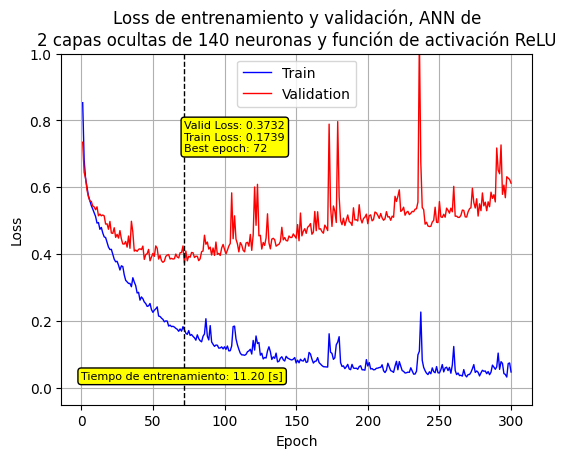

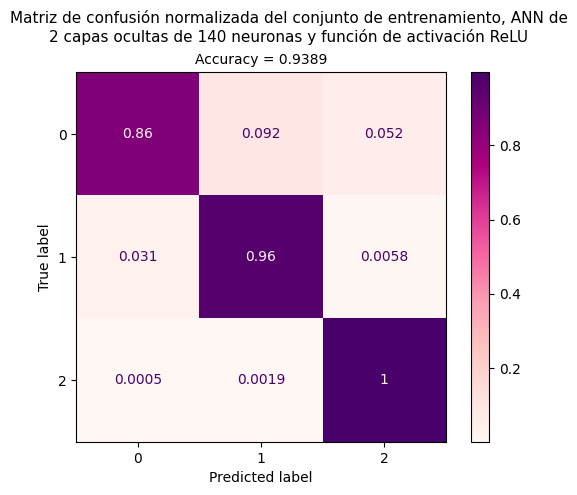

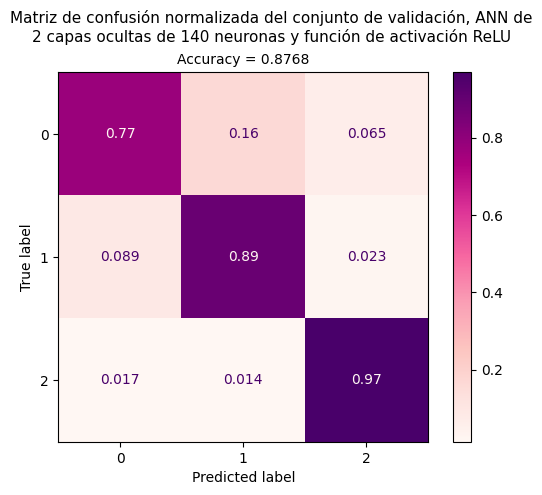


Entrenando: model_140co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 64
Mejor modelo en la época 64 con loss de validación = 0.301096


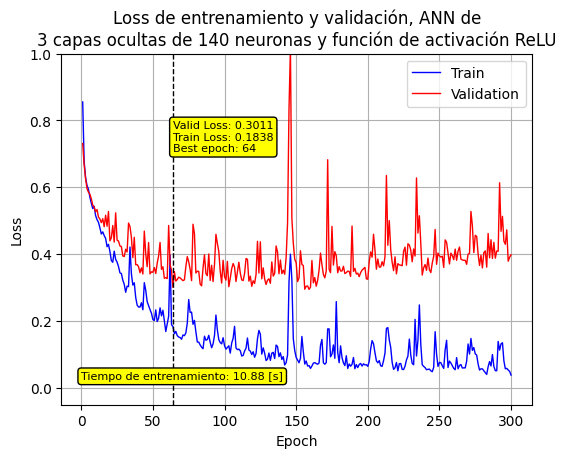

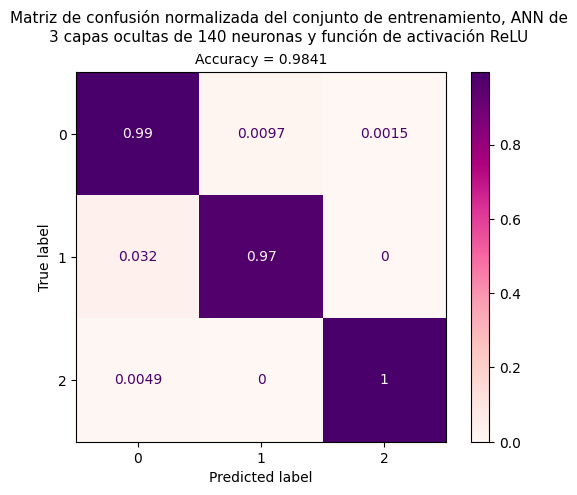

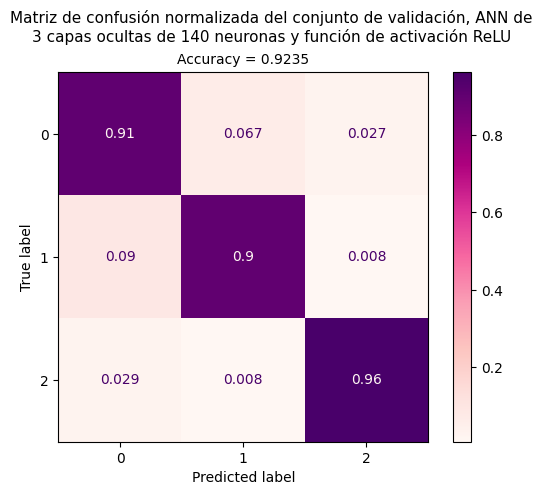


Entrenando: model_140co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 70
Mejor modelo en la época 70 con loss de validación = 0.270665


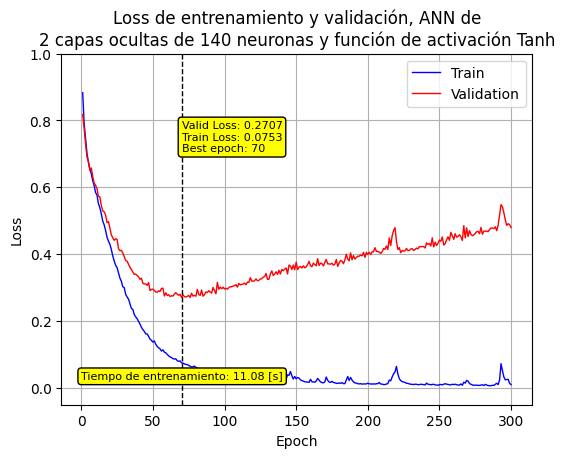

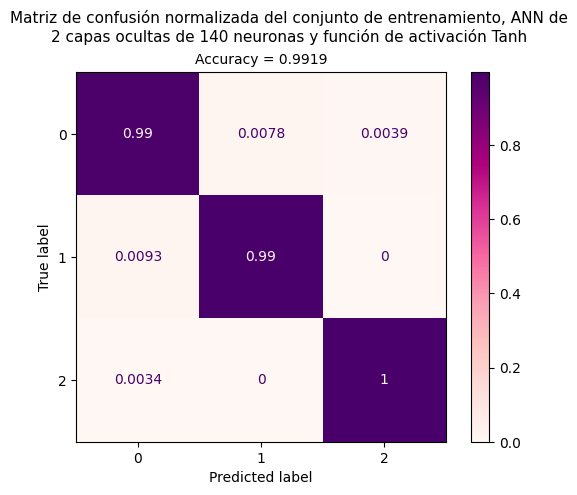

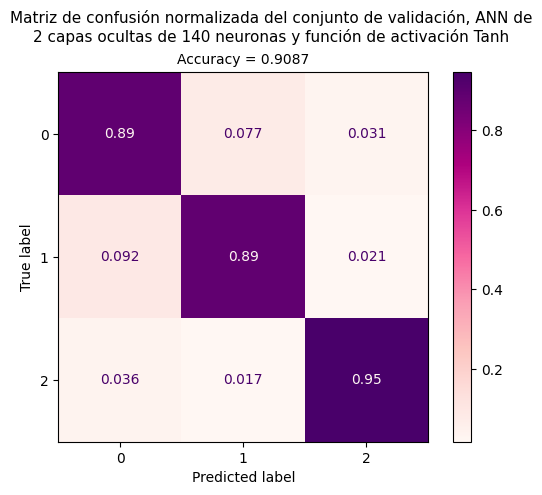


Entrenando: model_140co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 63
Mejor modelo en la época 63 con loss de validación = 0.253245


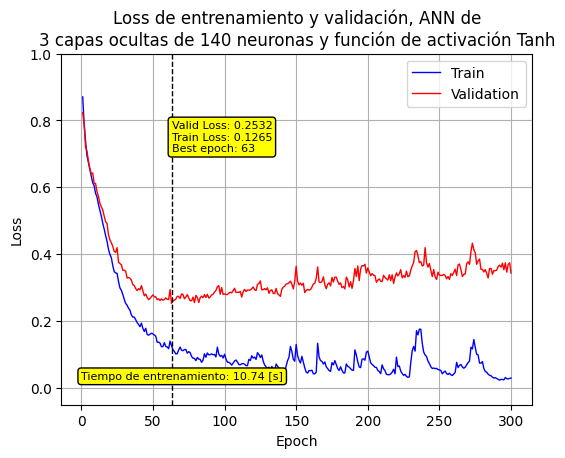

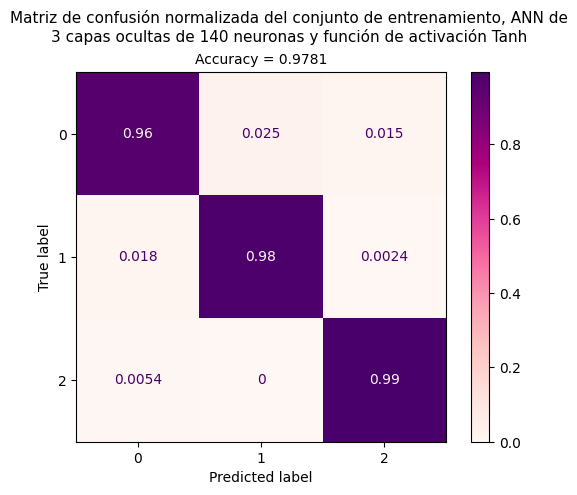

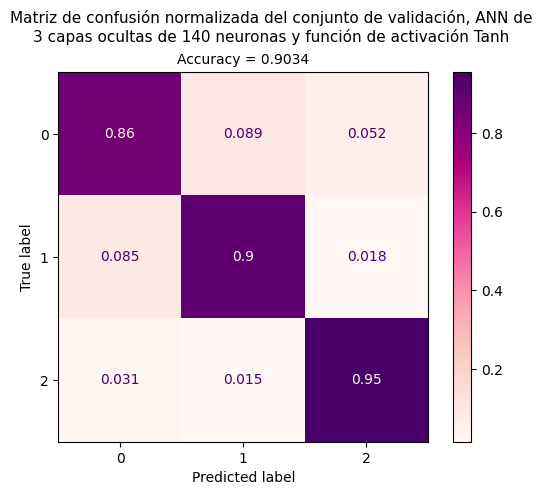


Entrenando: model_200co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 70
Mejor modelo en la época 70 con loss de validación = 0.362749


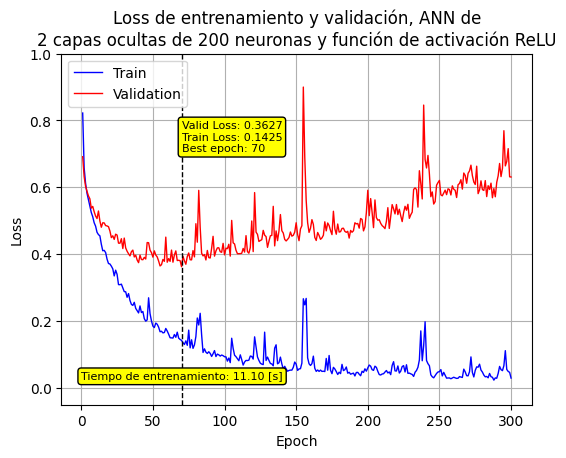

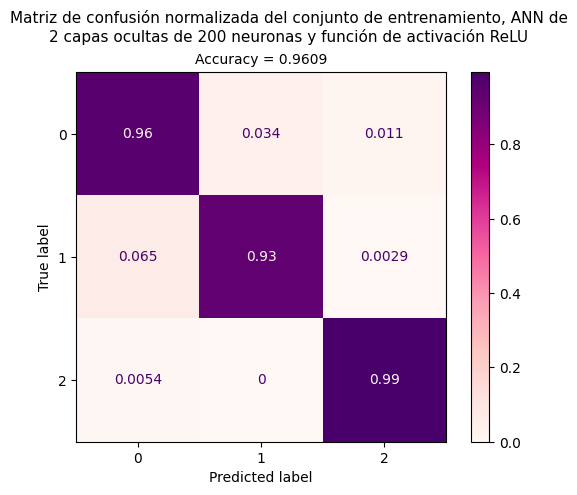

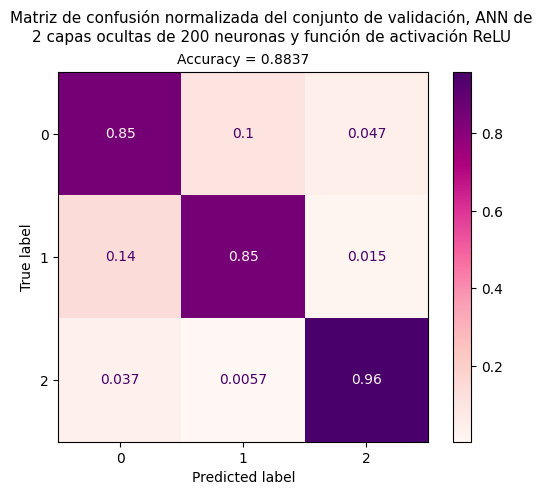


Entrenando: model_200co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 72
Mejor modelo en la época 72 con loss de validación = 0.301603


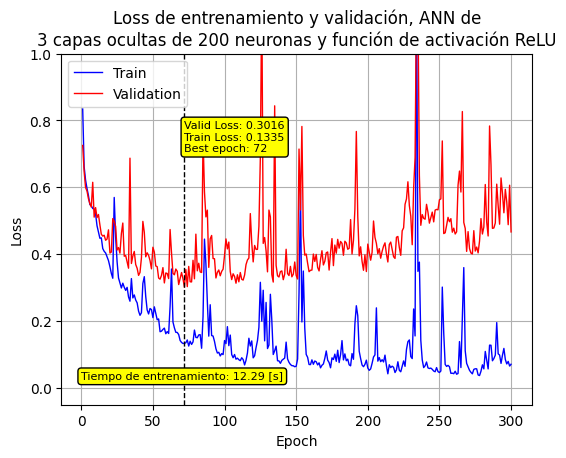

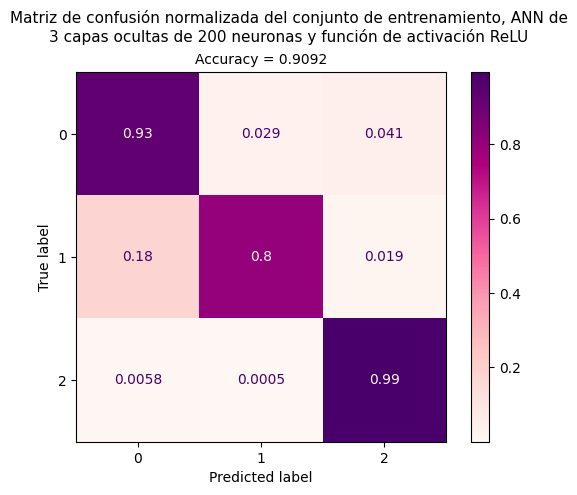

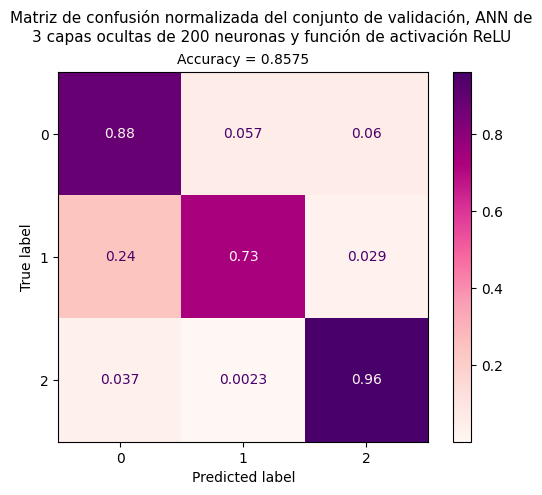


Entrenando: model_200co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 55
Mejor modelo en la época 55 con loss de validación = 0.274504


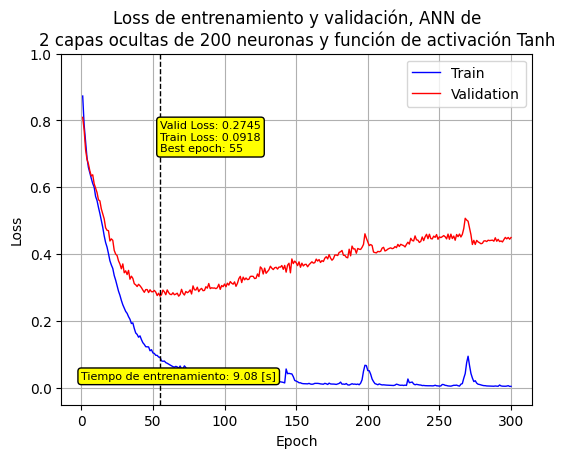

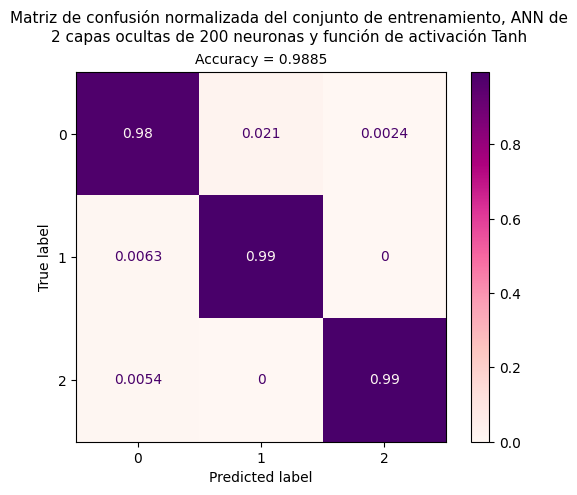

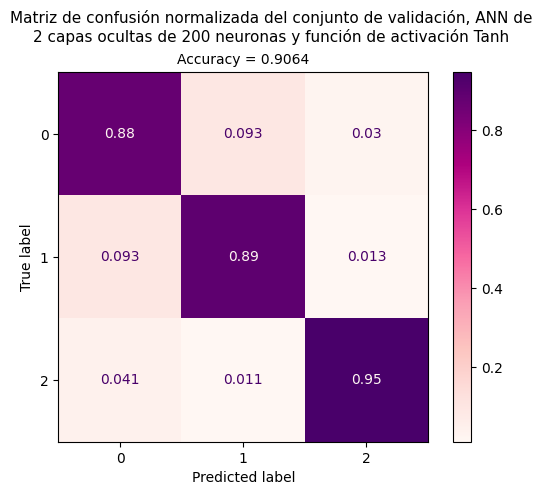


Entrenando: model_200co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.236817


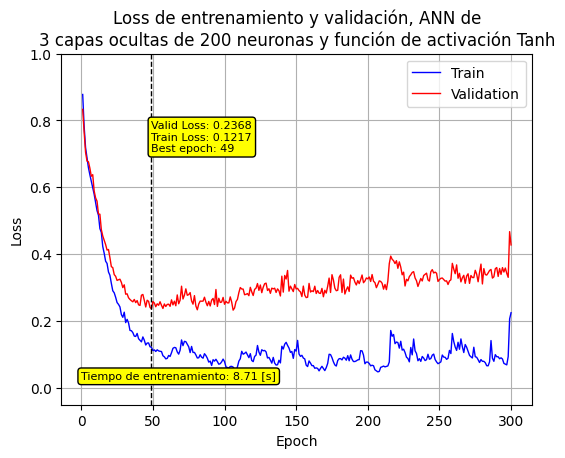

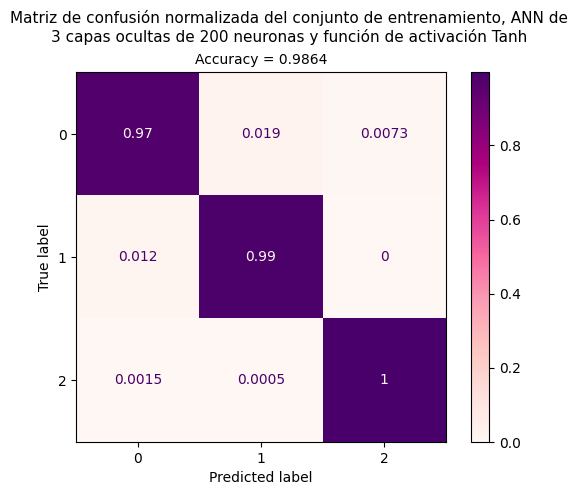

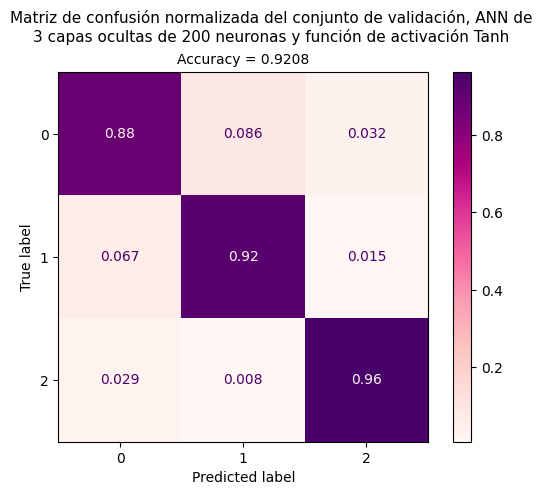


Entrenando: model_300co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 61
Mejor modelo en la época 61 con loss de validación = 0.339427


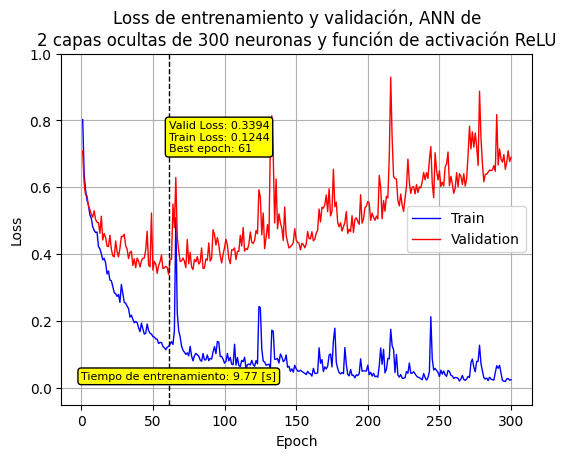

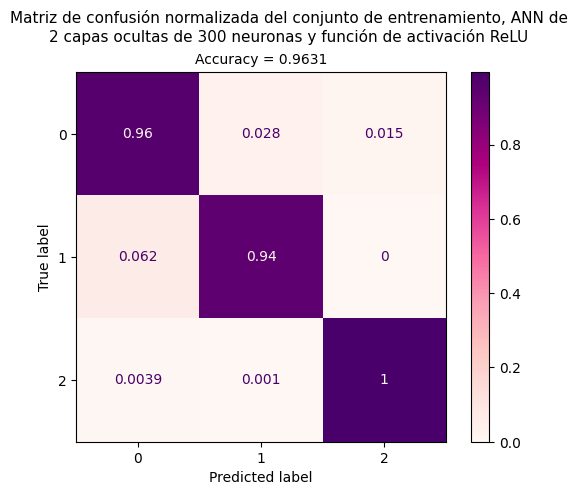

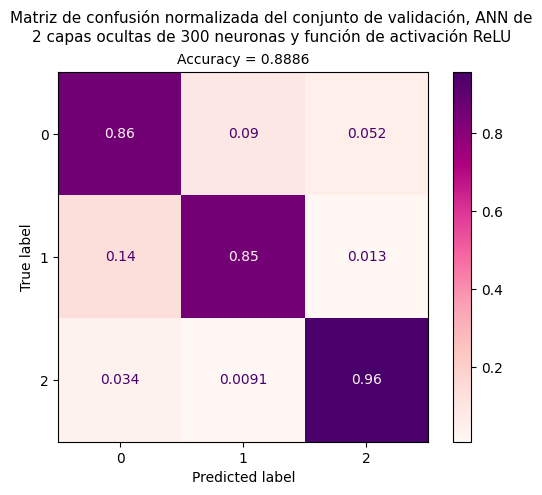


Entrenando: model_300co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 40
Mejor modelo en la época 40 con loss de validación = 0.327176


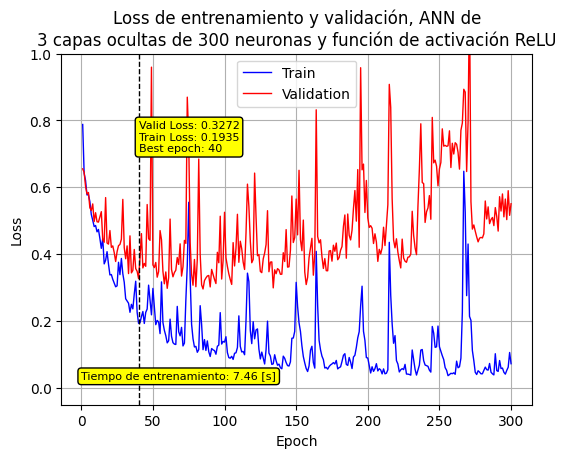

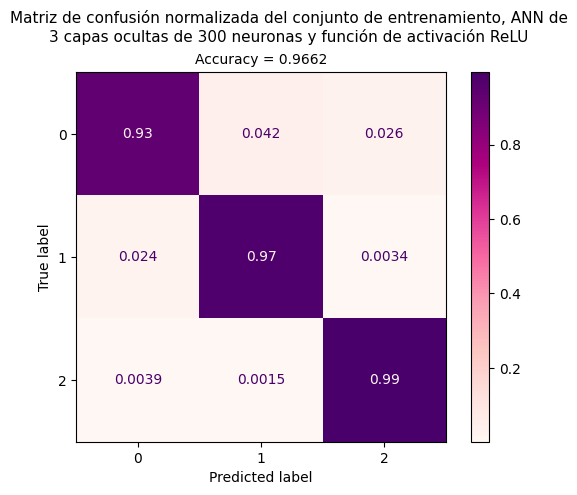

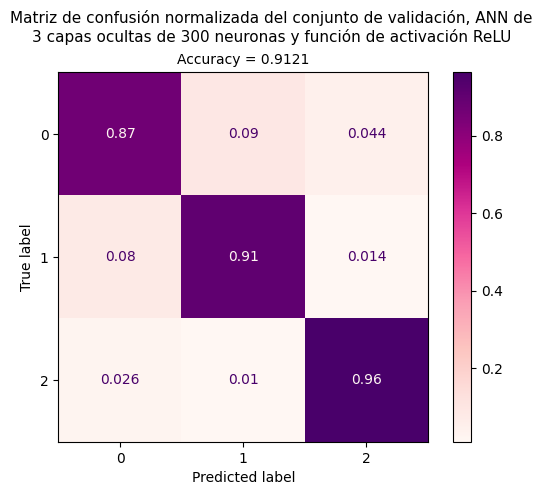


Entrenando: model_300co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 51
Mejor modelo en la época 51 con loss de validación = 0.248686


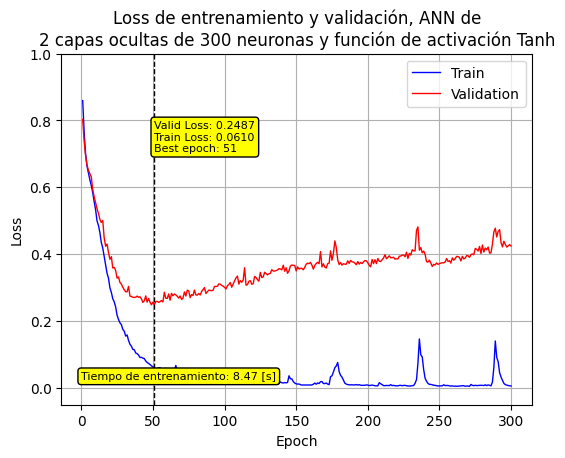

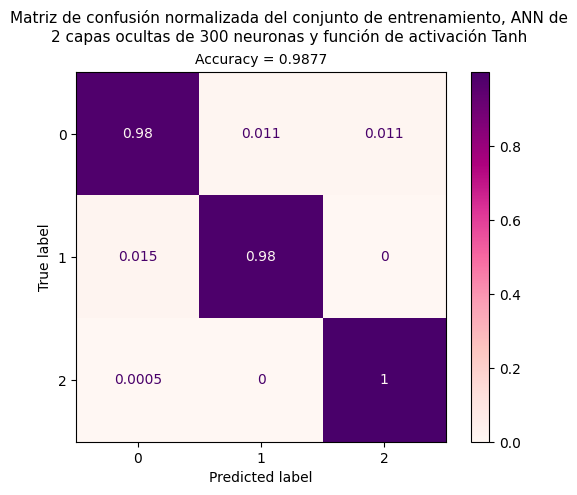

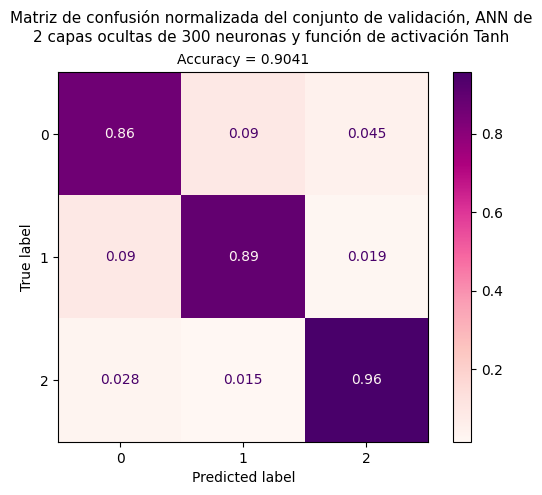


Entrenando: model_300co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 51
Mejor modelo en la época 51 con loss de validación = 0.212427


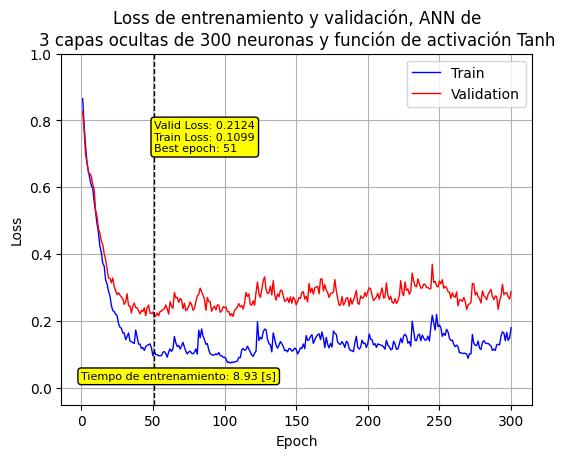

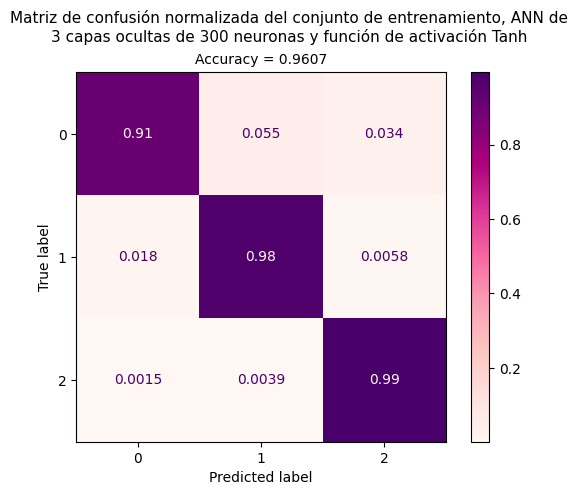

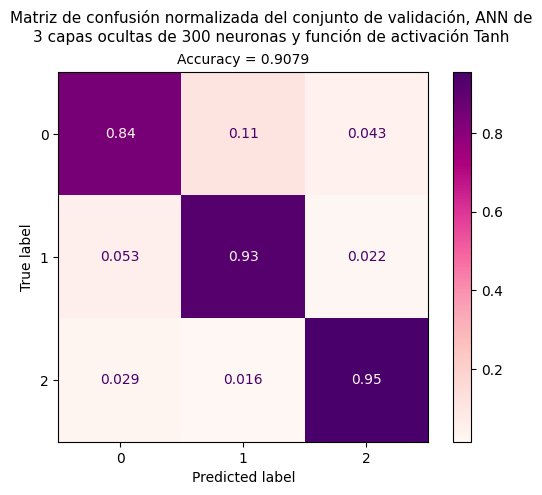


Entrenando: model_400co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 47
Mejor modelo en la época 47 con loss de validación = 0.334310


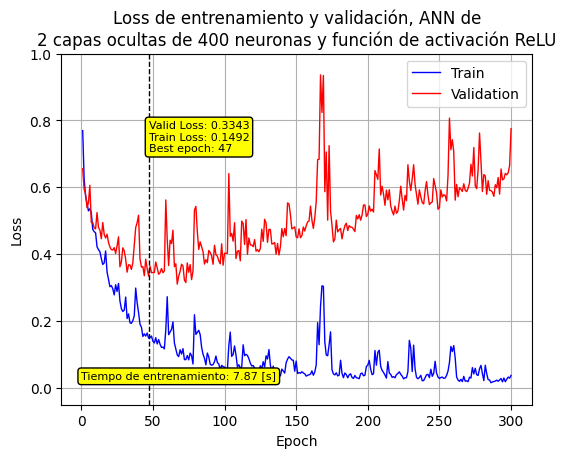

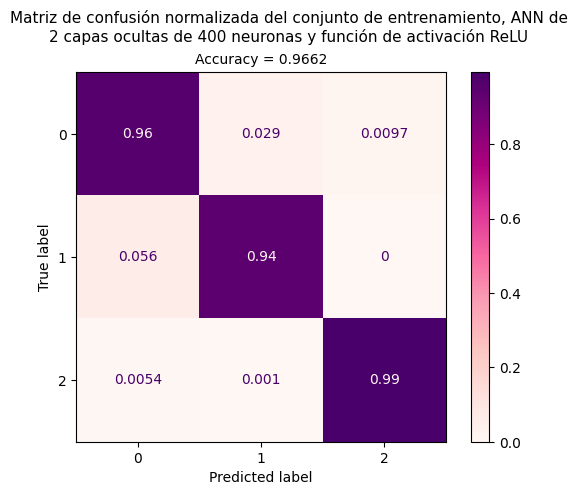

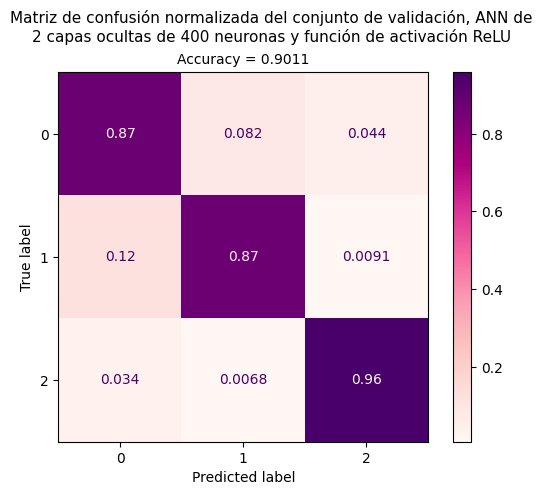


Entrenando: model_400co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 44
Mejor modelo en la época 44 con loss de validación = 0.331029


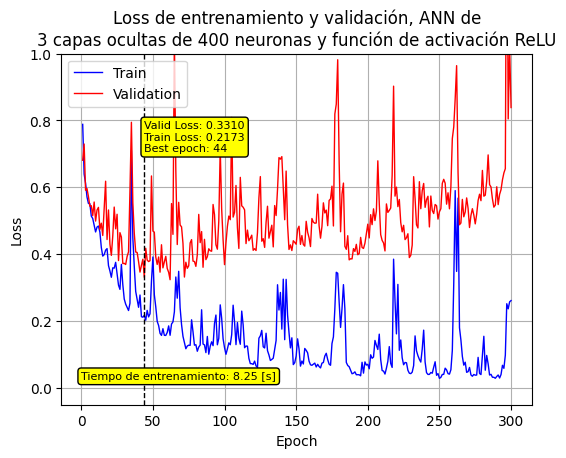

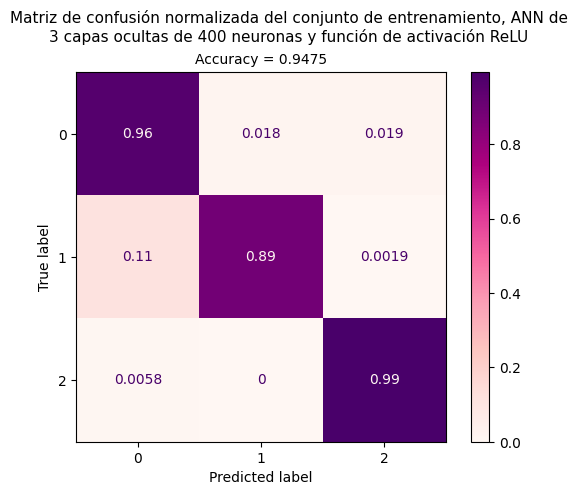

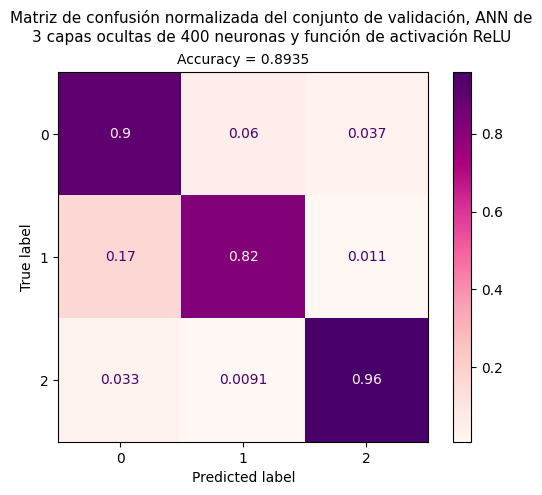


Entrenando: model_400co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 57
Mejor modelo en la época 57 con loss de validación = 0.240564


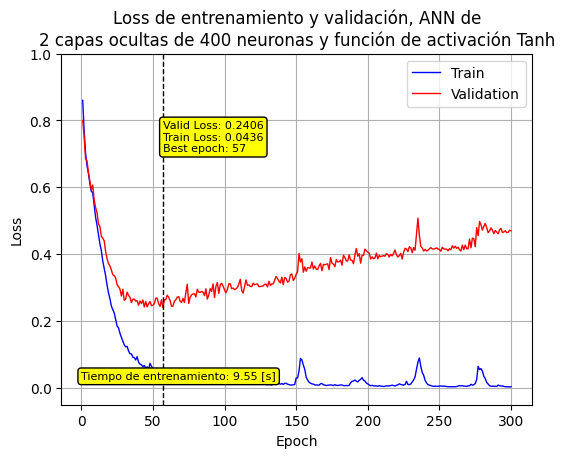

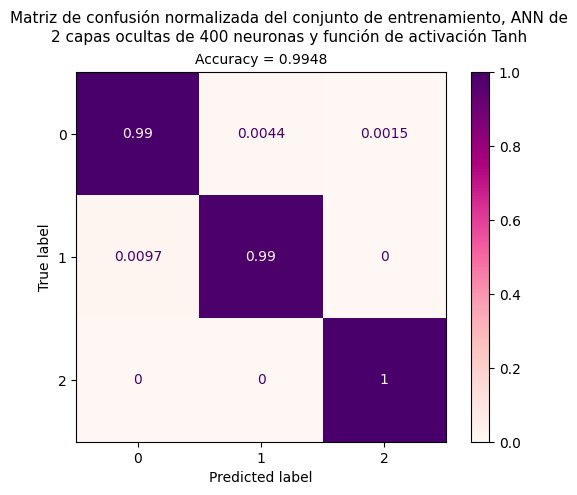

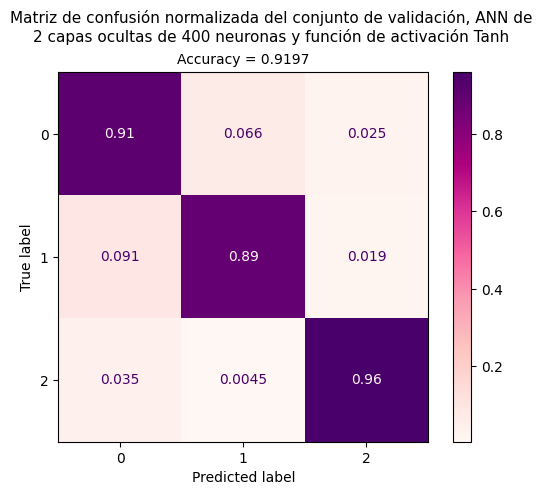


Entrenando: model_400co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 46
Mejor modelo en la época 46 con loss de validación = 0.233192


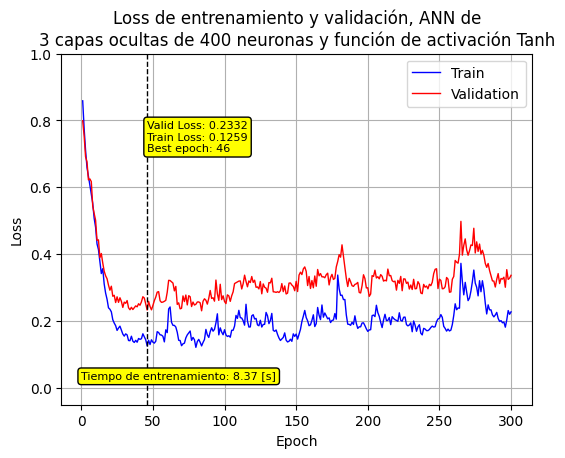

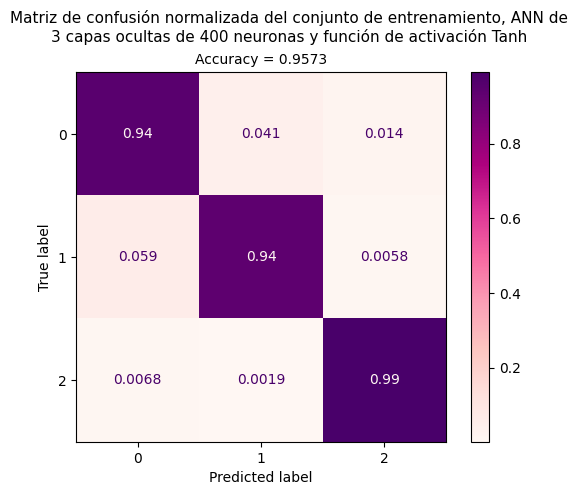

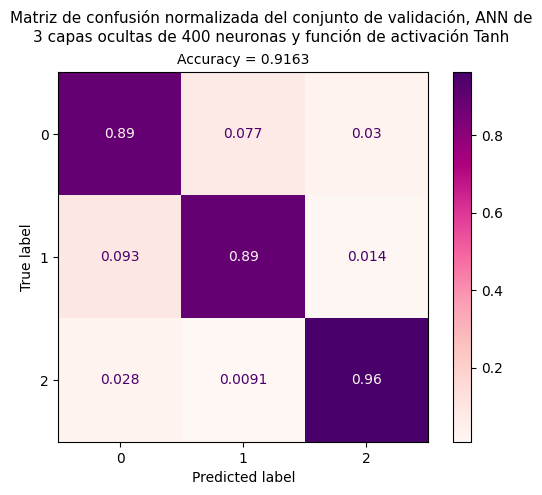

Tiempo de ejecución: 16.43 [min]


,name,activation,layers,hidden_size,lr,valid_loss,train_loss,best_epoch,time,acc_val
1,model_140co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,140,0.001,0.301096,0.183819,64,10.875849,0.923456
2,model_200co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,200,0.001,0.236817,0.121690,49,8.712620,0.920803
3,model_400co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,400,0.001,0.240564,0.043597,57,9.549406,0.919667
4,model_400co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,400,0.001,0.233192,0.125900,46,8.366519,0.916256
5,model_300co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,300,0.001,0.327176,0.193460,40,7.460160,0.912088
6,model_140co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,140,0.001,0.270665,0.075295,70,11.077436,0.908678
7,model_300co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,300,0.001,0.212427,0.109876,51,8.927356,0.907920
8,model_200co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,200,0.001,0.274504,0.091762,55,9.078703,0.906404
9,model_90co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,90,0.001,0.297839,0.148503,72,12.014888,0.905267
10,model_300co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,300,0.001,0.248686,0.060989,51,8.467127,0.904130


In [101]:
# Hiperparámetros
hidden_sizes = [40, 90, 140, 200, 300, 400]
# hidden_sizes = [200, 300, 400]
# hidden_sizes = [300]

activations = {'ReLU': nn.ReLU, 'Tanh': nn.Tanh}
# activations = {'Tanh': nn.Tanh}

num_hidden_layers = [2, 3]
# num_hidden_layers = [3]

learning_rates = [1e-3]

n_epochs = 300

patience = 15

ruta = '/content/ANN/graficos/GS/' # Ruta para guardar los gráficos, variable global en este punto
os.makedirs(ruta, exist_ok=True)

t0 = time.time()/60
search_results = GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dataloader_train_GS, dataloader_val_GS)
tf = time.time()/60
print(f'Tiempo de ejecución: {tf - t0:.2f} [min]')

display(search_results)

In [95]:
import os
import zipfile

folder_path = "/content/ANN"
zip_path = "/content/ANN.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            # Guardar la estructura relativa para mantener los subdirectorios
            arcname = os.path.relpath(file_path, start=folder_path)
            zipf.write(file_path, arcname=arcname)

# Entrenamiento de la mejor red con el conjunto completo de características

Early stopping at --------------------------------------------------> 73
Mejor modelo en la época 73 con loss de validación = 0.308396


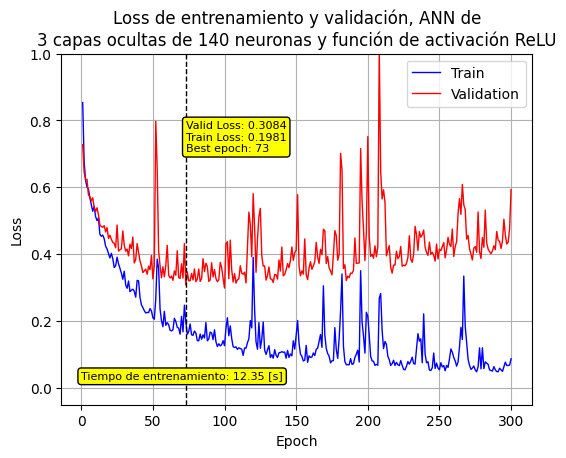

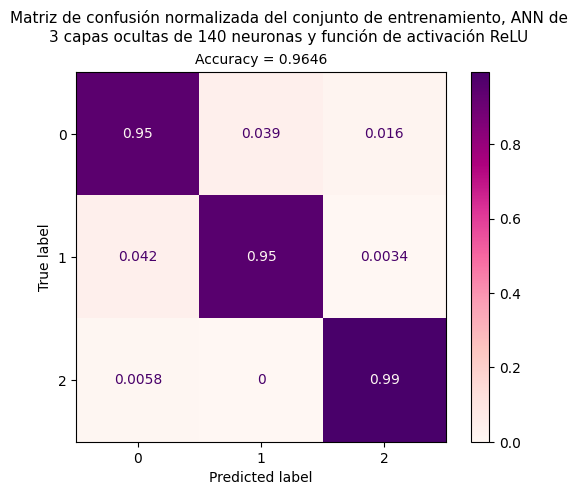

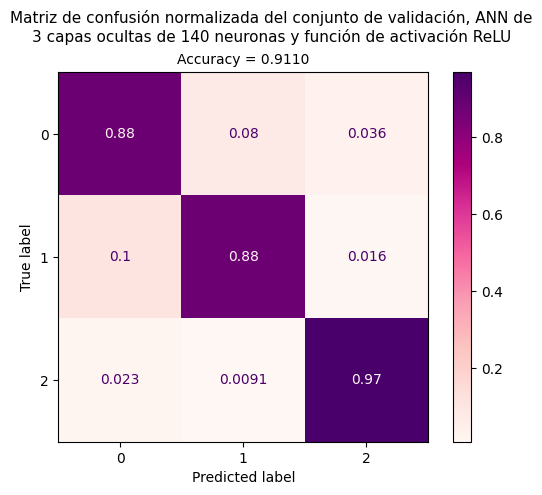

In [102]:
ruta = '/content/ANN/graficos/train/' # Ruta para guardar los gráficos, variable global en este punto

# La mejor red encontrad mediante el Grid Search
model_validated, optimizer = ANN_by_name(search_results)

model_validated = model_validated.to(device)

patience=15; n_epochs=300

# model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated, patience=patience, n_epochs=n_epochs, optimizer=optimizer, dataloader_tr=dataloader_train, dataloader_vl=dataloader_val)
model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated, patience, n_epochs, optimizer, dataloader_train, dataloader_val)
acc_trained_model = results_ANN(model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

# Clasificación con un conjunto reducido de características

## Selección mediante wrapper strategy

In [103]:
# Asegúrate de que el SVC sea lineal
svc = svm.SVC(kernel='linear', C=10)
svc.fit(df_train, y_train)

# selector = SelectFromModel(estimator=svc, prefit=True, max_features=54, importance_getter='coef_') #Investigar que es prefit
selector = SelectFromModel(estimator=svc, max_features=54, threshold=-np.inf)

best_indx_wrapper = np.where(selector.get_support())[0]
best_feat_wrapper = [df_train.keys()[i] for i in np.where(selector.get_support())[0]] #Toma los indices de aquellas características que fueron seleccionadas como importantes con el método y luego busca el nombre de la característica correspodiente en la lista original de nombres definida al inicio del código

print('Mejores características:',best_feat_wrapper)
# Se define el nuevo conjunto de entrenamiento y validación tomando las características más importantes encontradas con este método
df_train_wrapper = df_train[best_feat_wrapper]
df_val_wrapper = df_val[best_feat_wrapper]
df_test_wrapper = df_test[best_feat_wrapper]

dataloader_train_wrapper, dataloader_val_wrapper, dataloader_test_wrapper = dataloader_creator(df_train_wrapper, y_train, df_val_wrapper, y_val, df_test_wrapper)


Mejores características: ['mean_R1', 'var_R1', 'max_R1', 'sma_R1', 'enrgy_R1', 'iqr_R1', 'entpy_R1', 'mean_R2', 'var_R2', 'mad_R2', 'ran_R2', 'sma_R2', 'enrgy_R2', 'iqr_R2', 'entpy_R2', 'mean_R3', 'var_R3', 'max_R3', 'min_R3', 'sma_R3', 'enrgy_R3', 'entpy_R3', 'mean_R4', 'var_R4', 'max_R4', 'min_R4', 'ran_R4', 'sma_R4', 'enrgy_R4', 'iqr_R4', 'enrgy_R5', 'mean_R6', 'var_R6', 'mad_R6', 'max_R6', 'min_R6', 'ran_R6', 'sma_R6', 'enrgy_R6', 'entpy_R6', 'mean_R7', 'var_R7', 'mad_R7', 'max_R7', 'min_R7', 'ran_R7', 'sma_R7', 'enrgy_R7', 'iqr_R7', 'var_R8', 'enrgy_R8', 'max_Humidity', 'min_Humidity', 'enrgy_Humidity']


In [104]:
dataloader_train_wrapper, dataloader_val_wrapper, dataloader_test_wrapper = dataloader_creator(df_train_wrapper, y_train, df_val_wrapper, y_val, df_test_wrapper)
dataloader_train_wrapper_GS, dataloader_val_wrapper_GS = dataloader_creator_GS(df_val_wrapper, y_val)


Entrenando: model_40co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 113
Mejor modelo en la época 113 con loss de validación = 0.449342


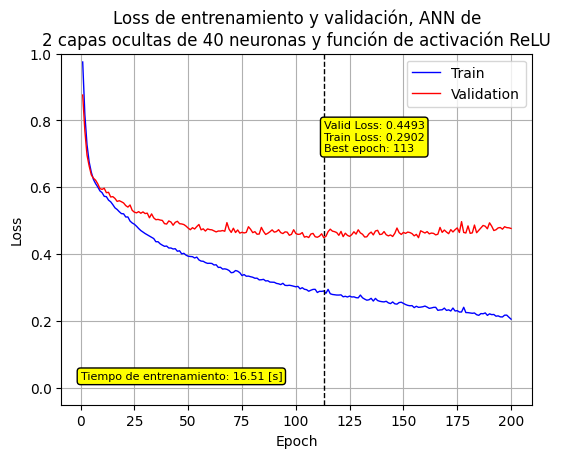

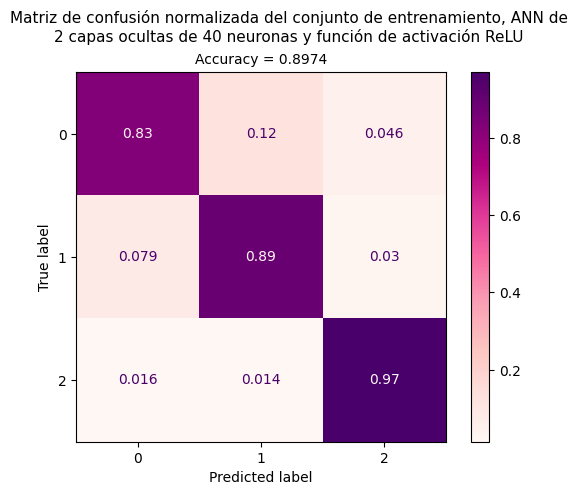

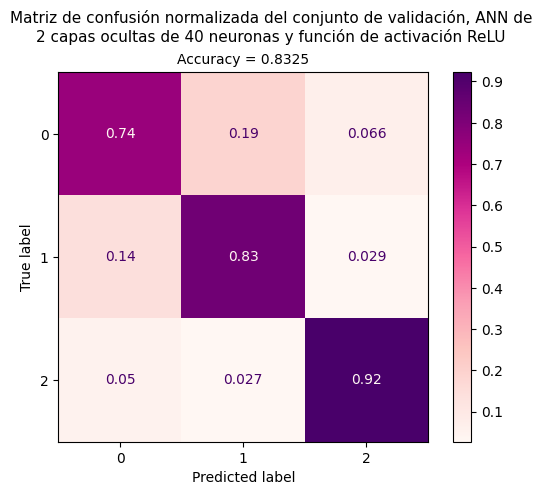


Entrenando: model_40co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 56
Mejor modelo en la época 56 con loss de validación = 0.476869


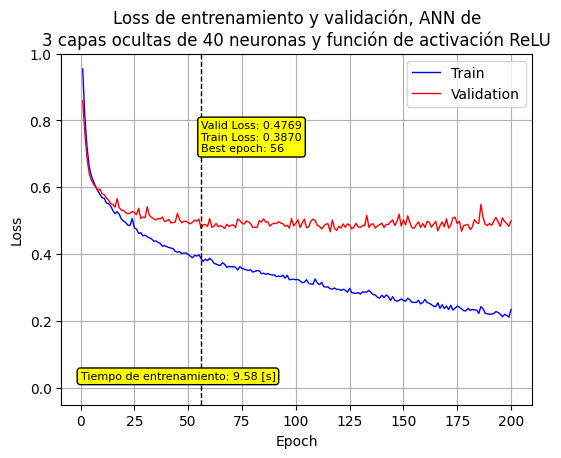

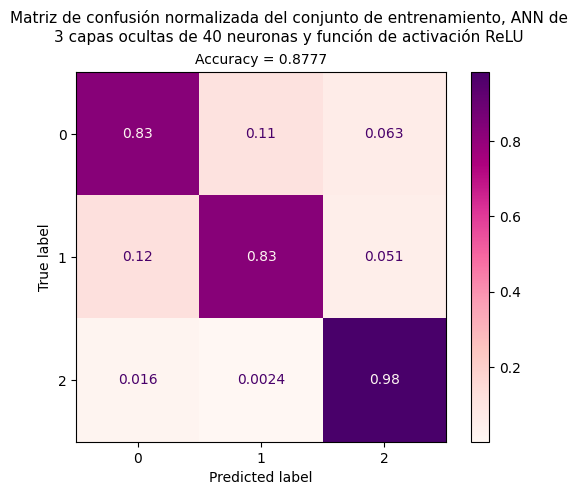

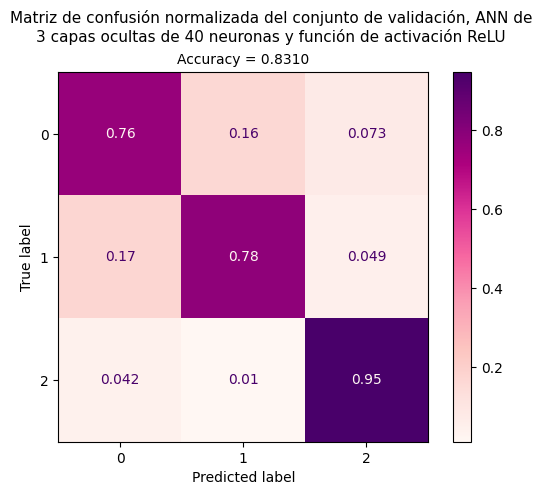


Entrenando: model_40co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 157
Mejor modelo en la época 157 con loss de validación = 0.370520


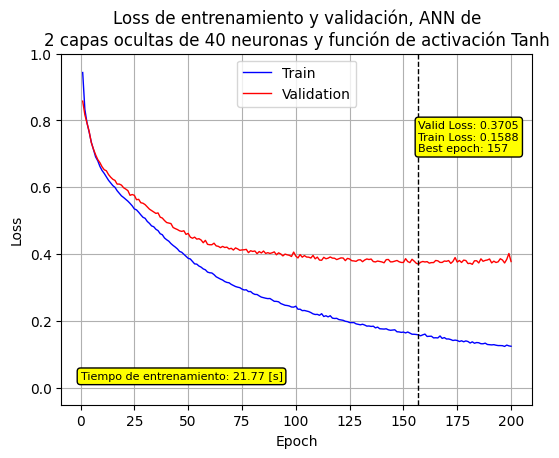

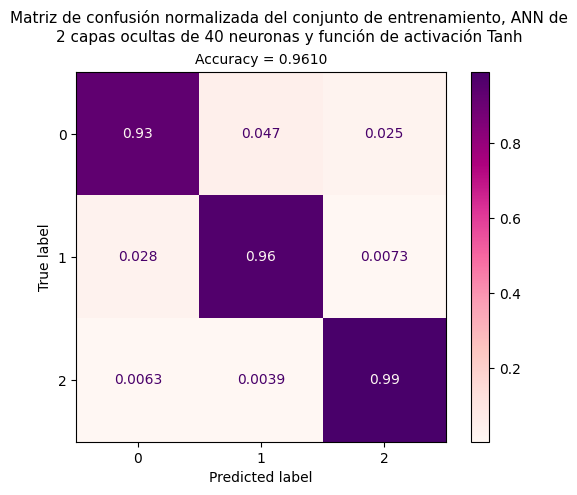

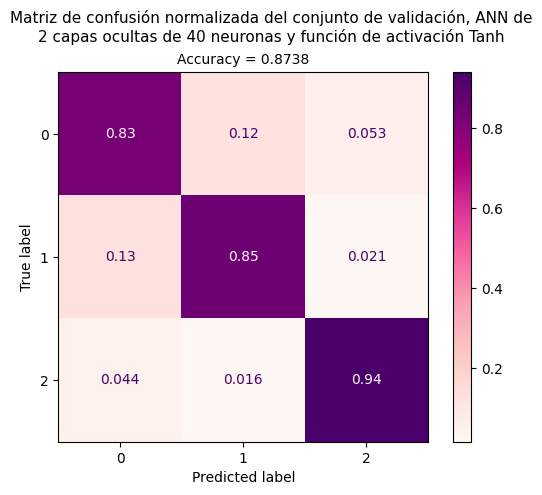


Entrenando: model_40co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 127
Mejor modelo en la época 127 con loss de validación = 0.397424


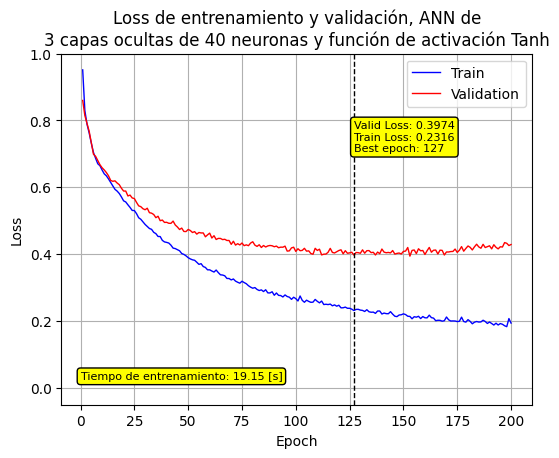

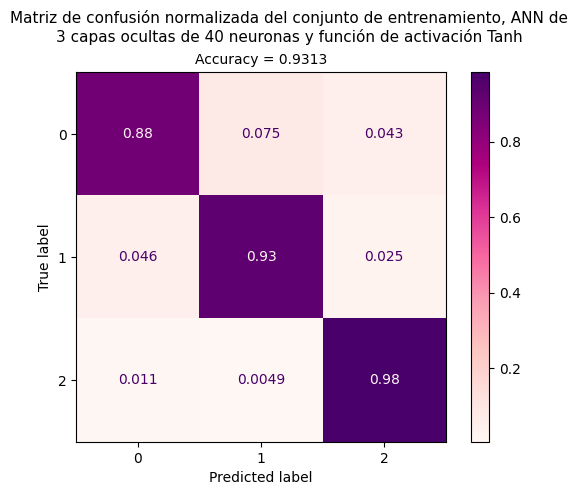

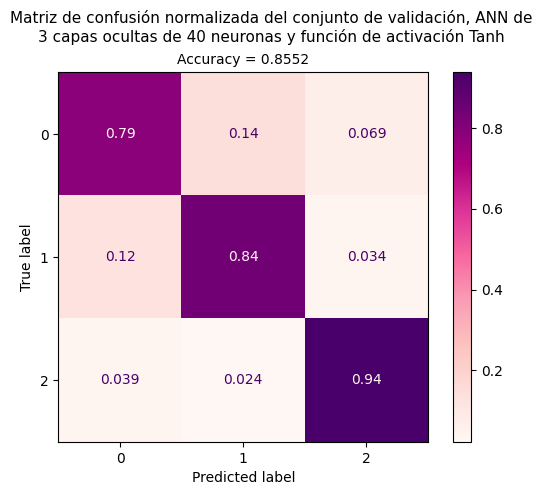


Entrenando: model_90co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 76
Mejor modelo en la época 76 con loss de validación = 0.363563


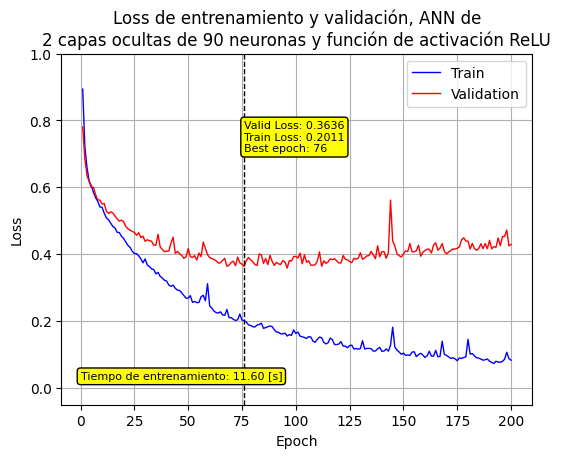

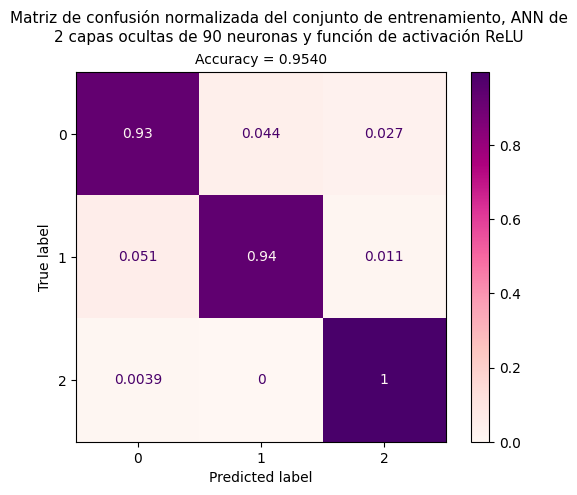

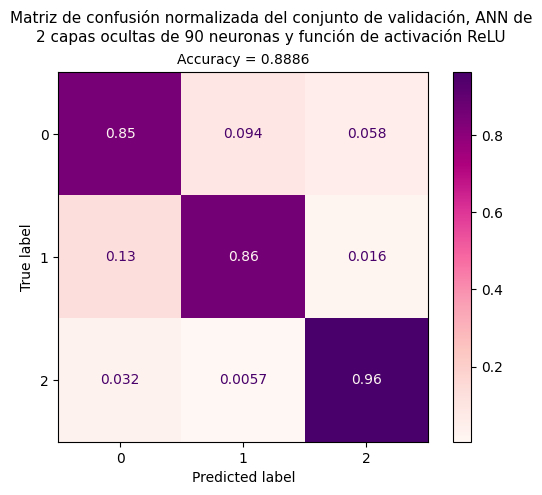


Entrenando: model_90co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 72
Mejor modelo en la época 72 con loss de validación = 0.343419


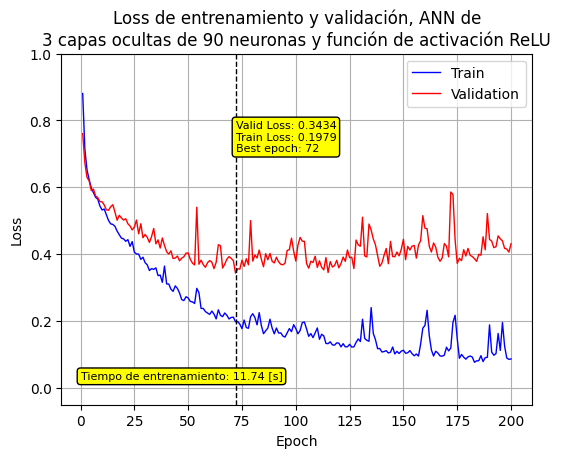

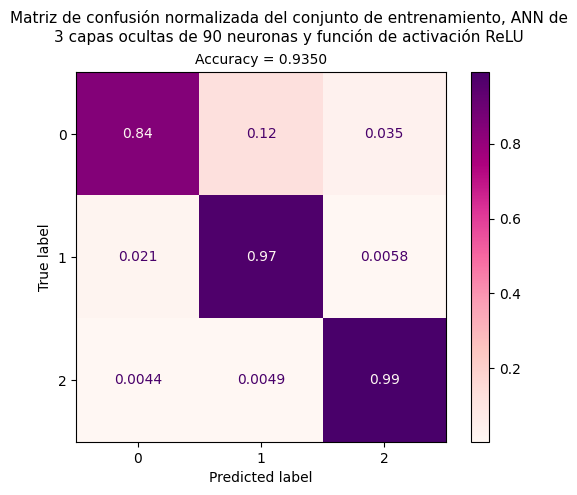

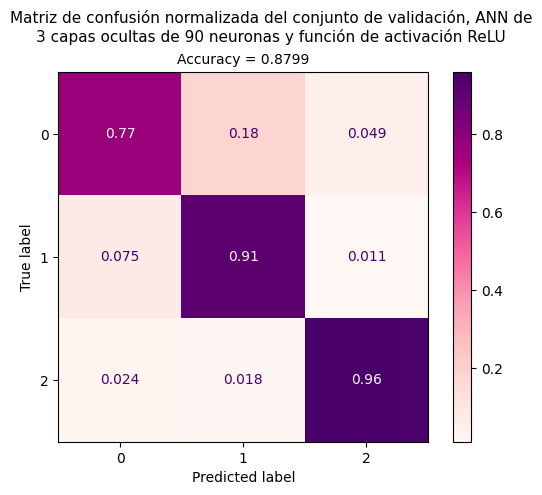


Entrenando: model_90co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 91
Mejor modelo en la época 91 con loss de validación = 0.277827


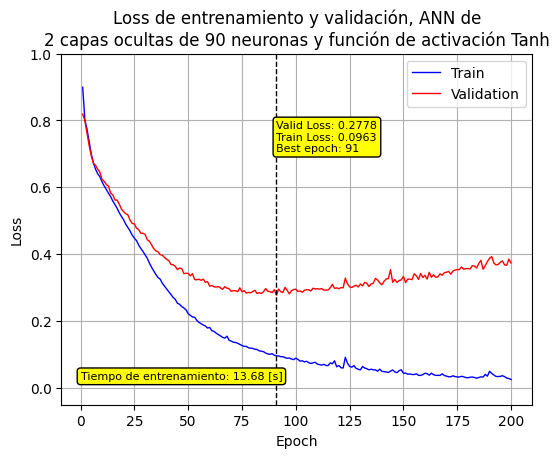

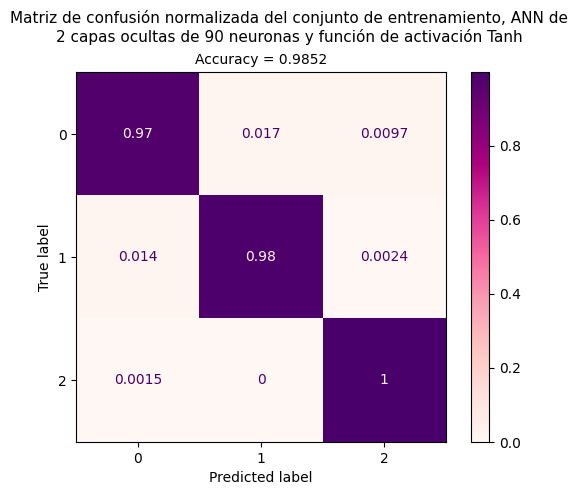

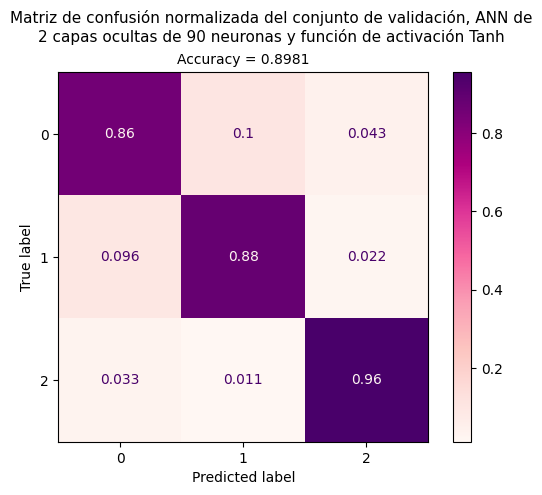


Entrenando: model_90co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 68
Mejor modelo en la época 68 con loss de validación = 0.347301


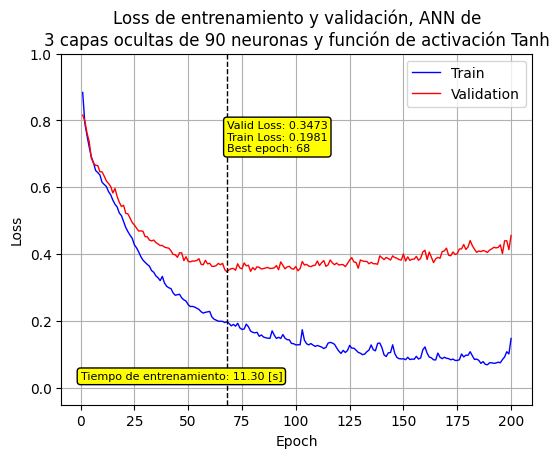

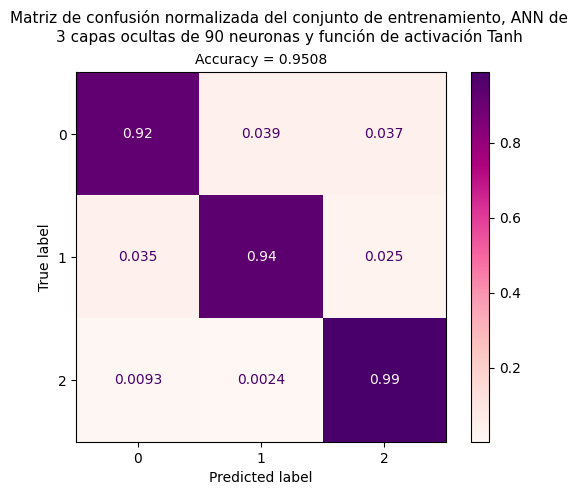

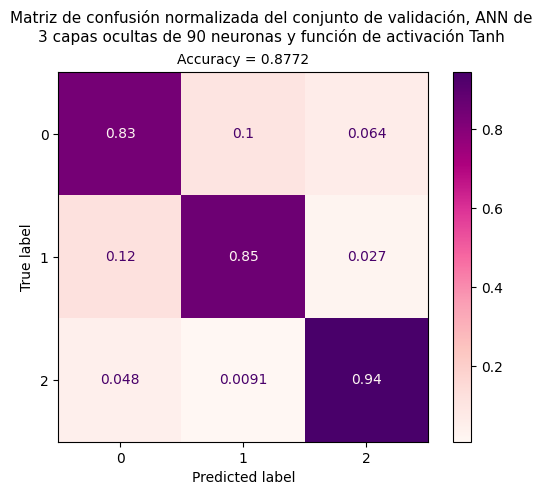


Entrenando: model_140co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 82
Mejor modelo en la época 82 con loss de validación = 0.334979


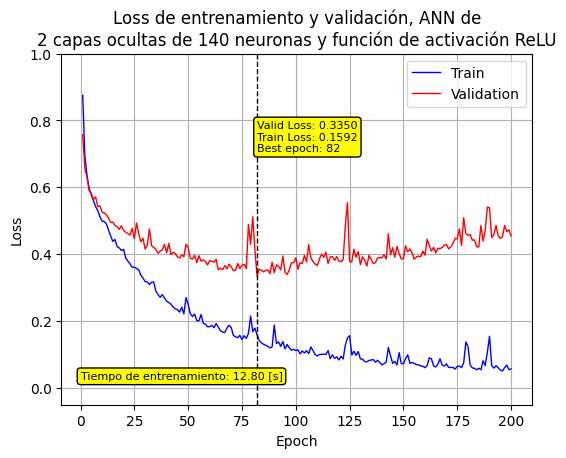

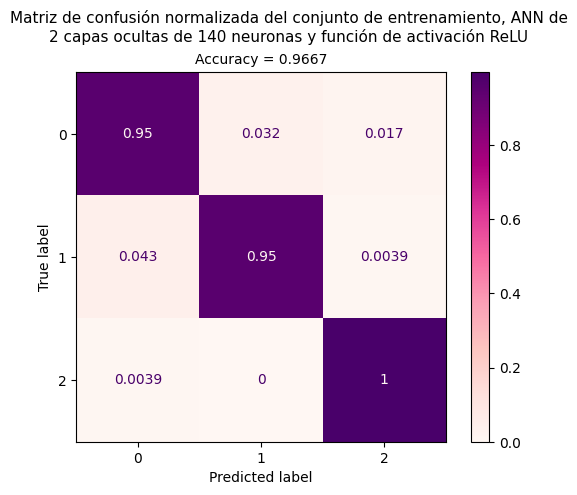

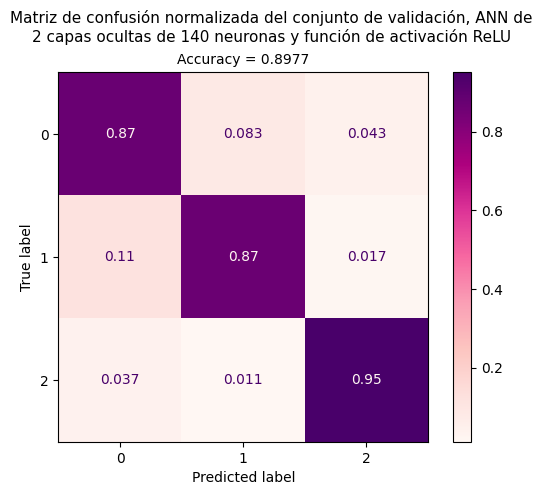


Entrenando: model_140co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 36
Mejor modelo en la época 36 con loss de validación = 0.351842


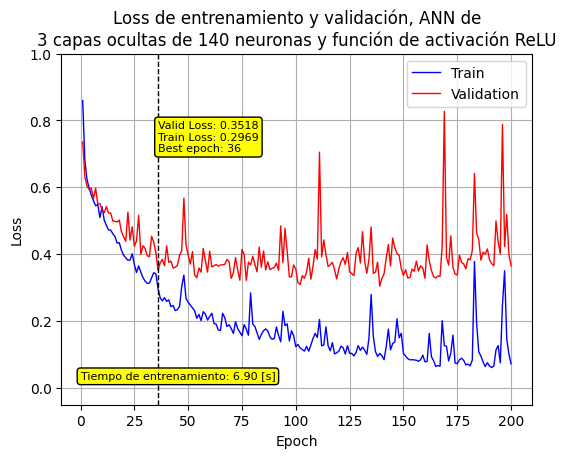

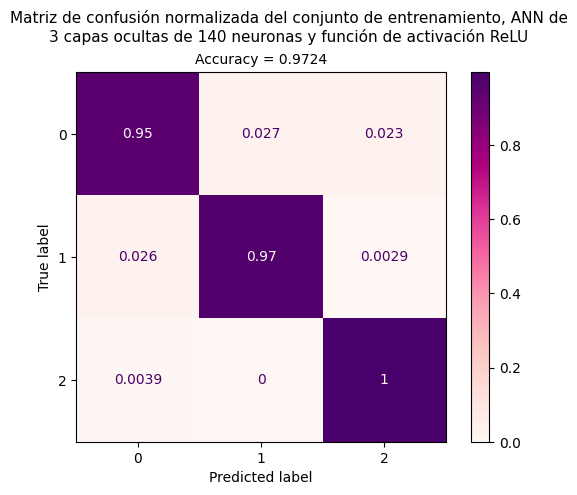

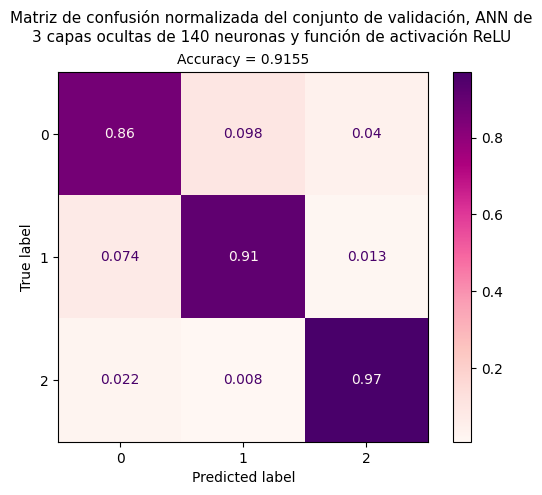


Entrenando: model_140co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 82
Mejor modelo en la época 82 con loss de validación = 0.282552


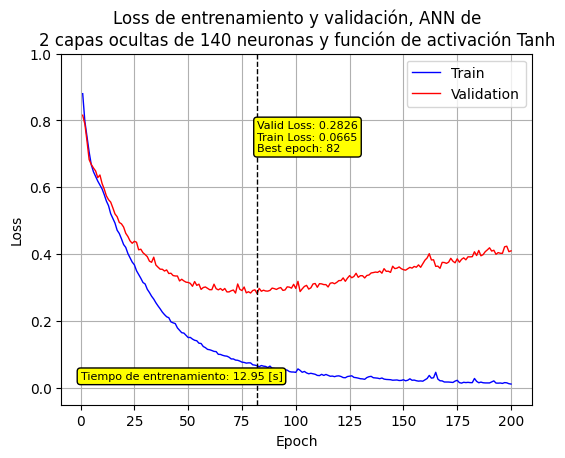

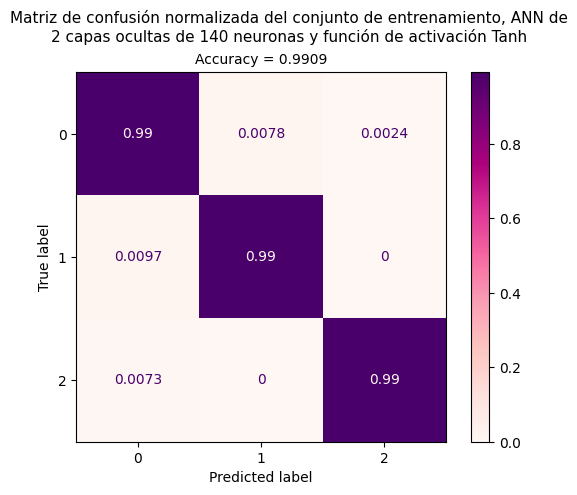

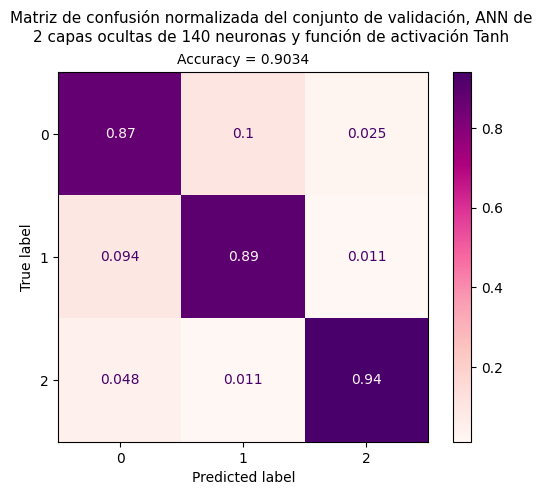


Entrenando: model_140co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 79
Mejor modelo en la época 79 con loss de validación = 0.275996


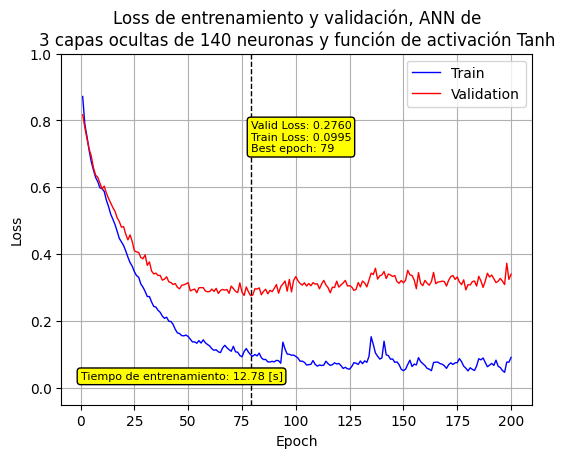

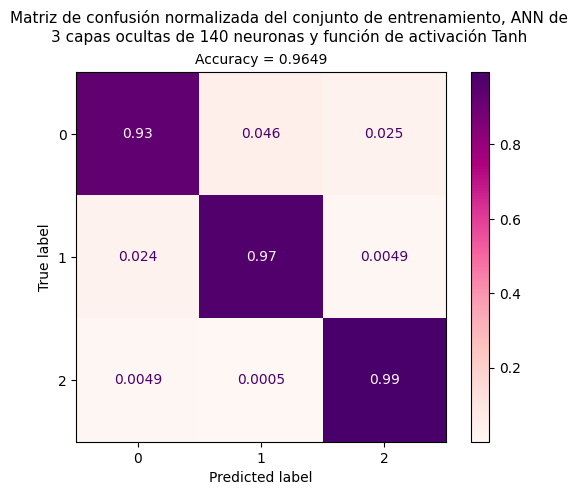

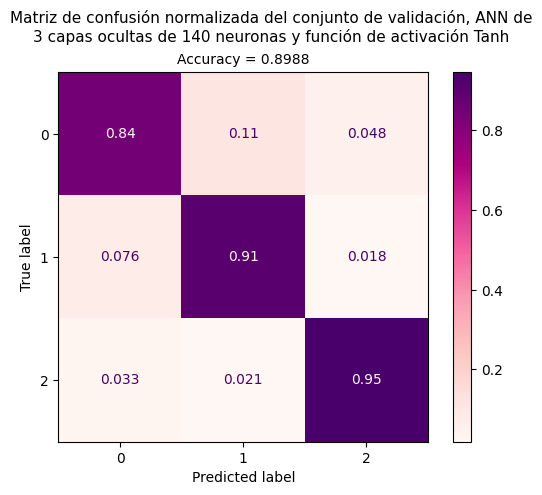


Entrenando: model_200co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 57
Mejor modelo en la época 57 con loss de validación = 0.328296


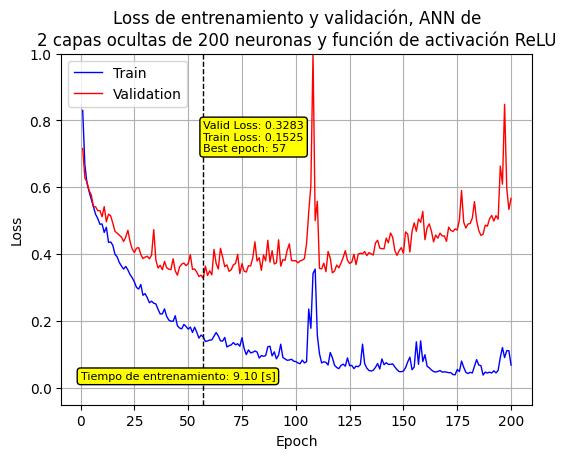

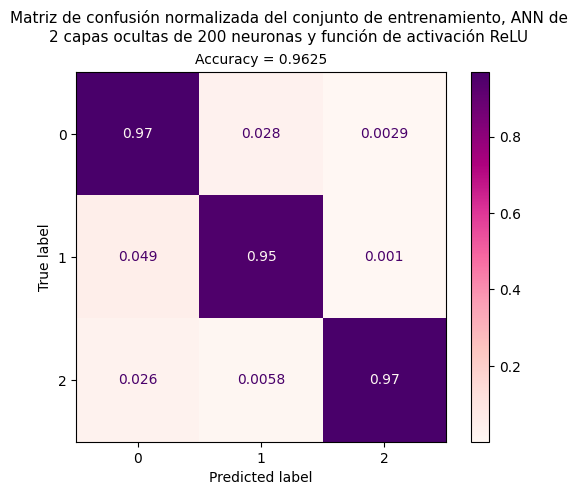

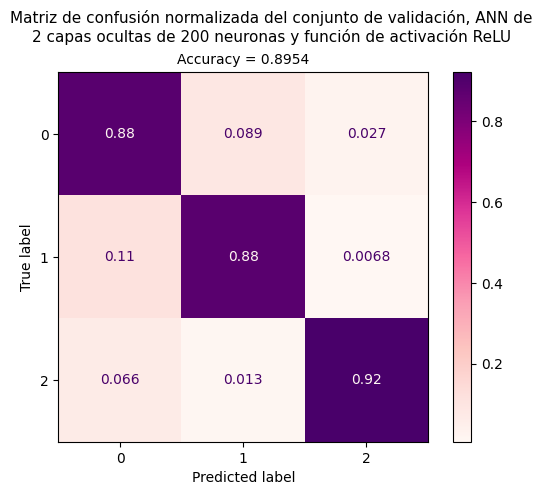


Entrenando: model_200co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 72
Mejor modelo en la época 72 con loss de validación = 0.308316


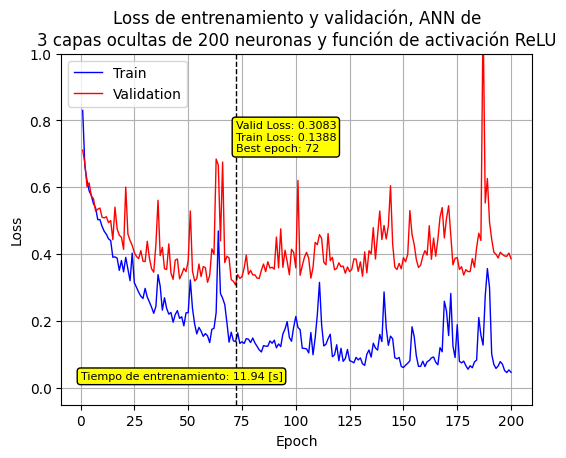

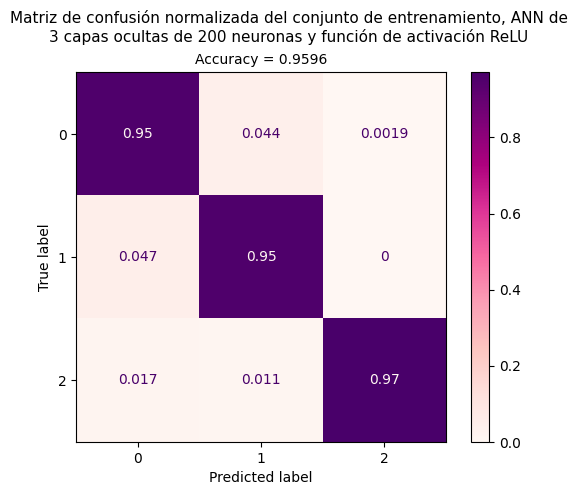

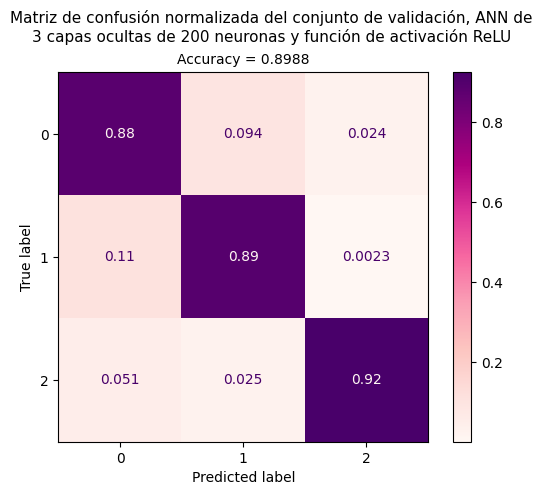


Entrenando: model_200co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 77
Mejor modelo en la época 77 con loss de validación = 0.254730


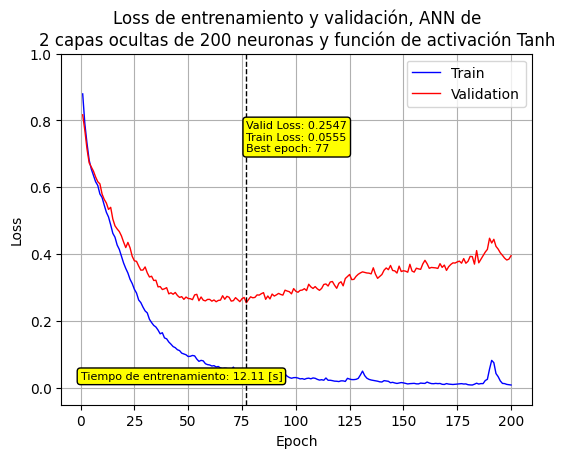

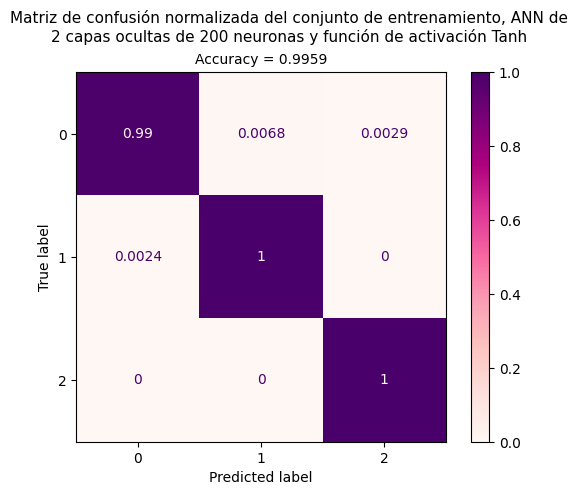

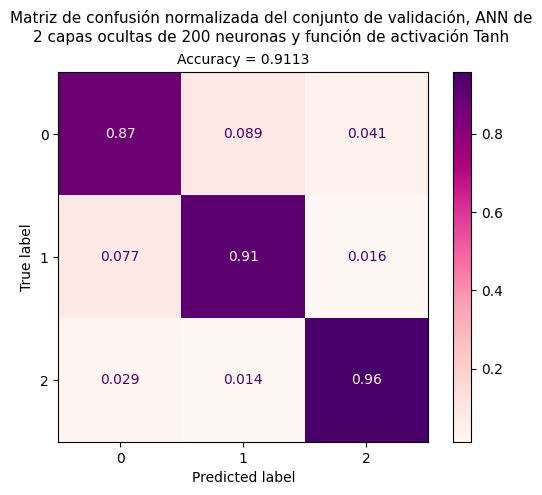


Entrenando: model_200co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 66
Mejor modelo en la época 66 con loss de validación = 0.242385


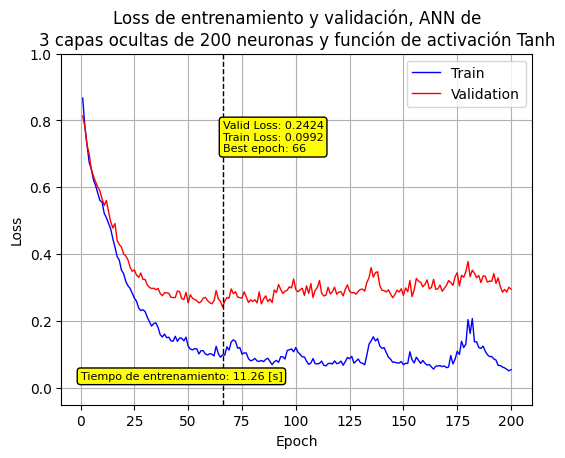

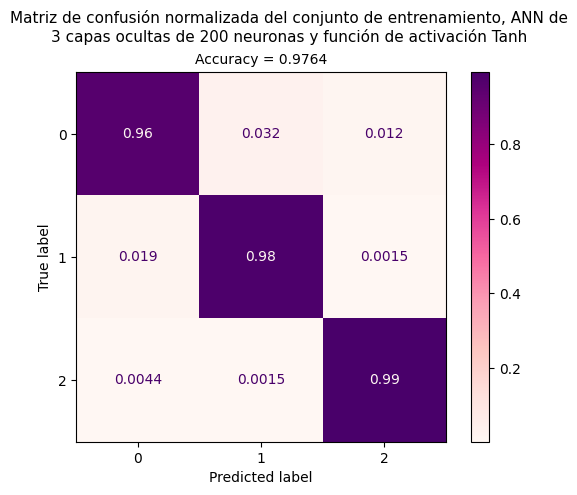

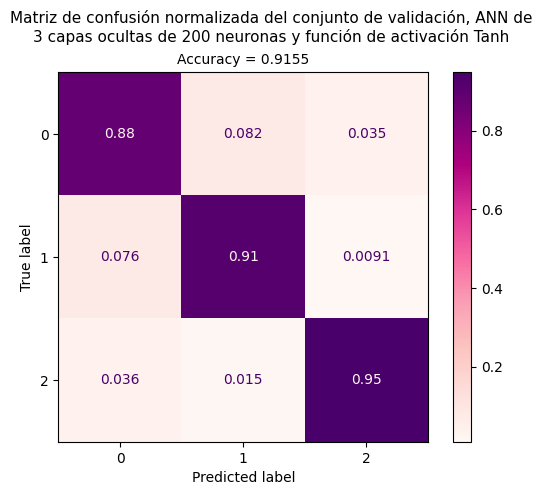


Entrenando: model_300co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 58
Mejor modelo en la época 58 con loss de validación = 0.327853


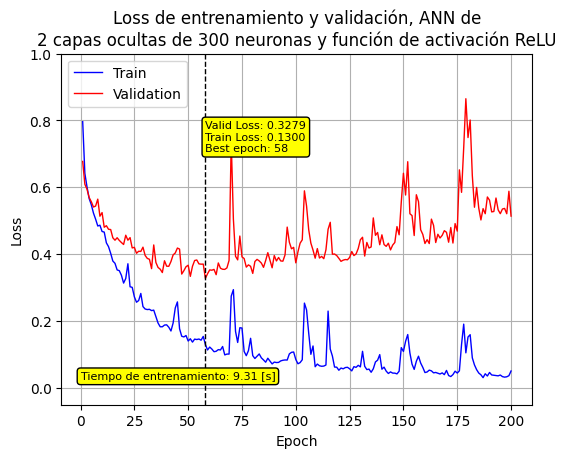

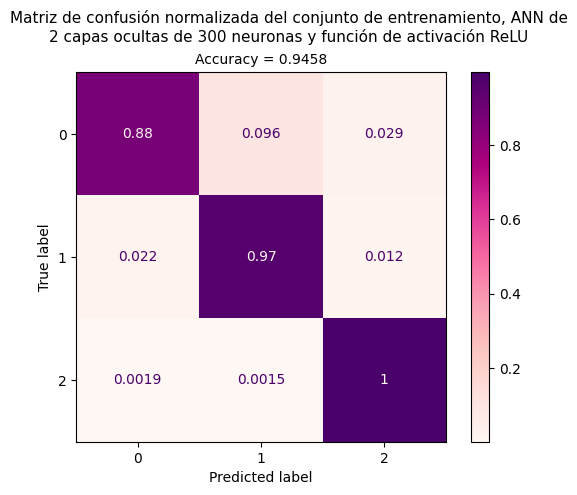

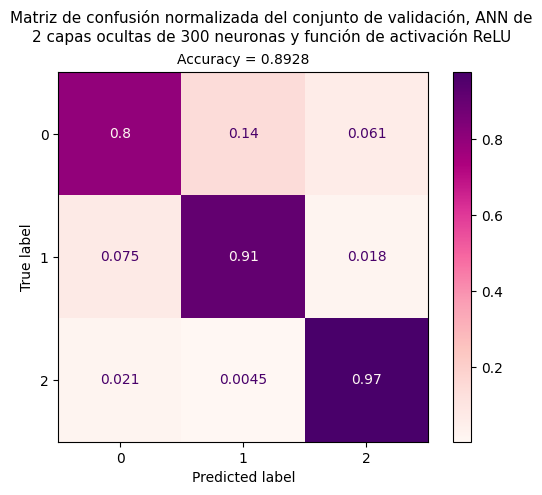


Entrenando: model_300co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 55
Mejor modelo en la época 55 con loss de validación = 0.306232


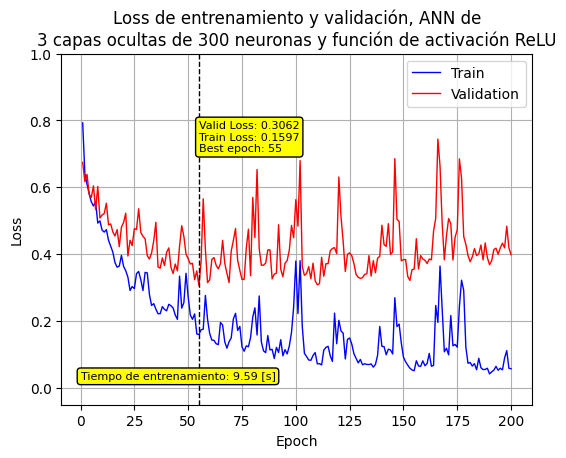

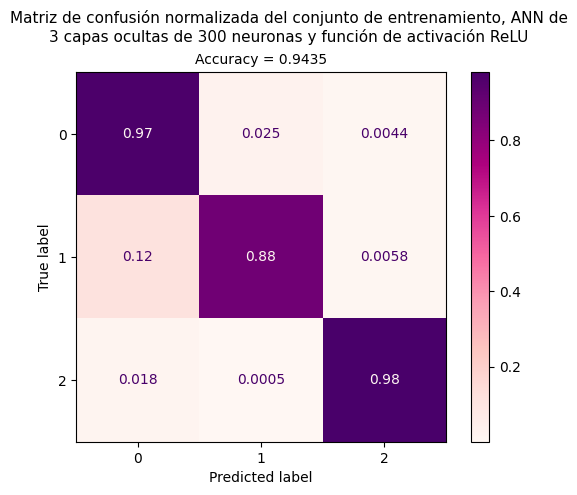

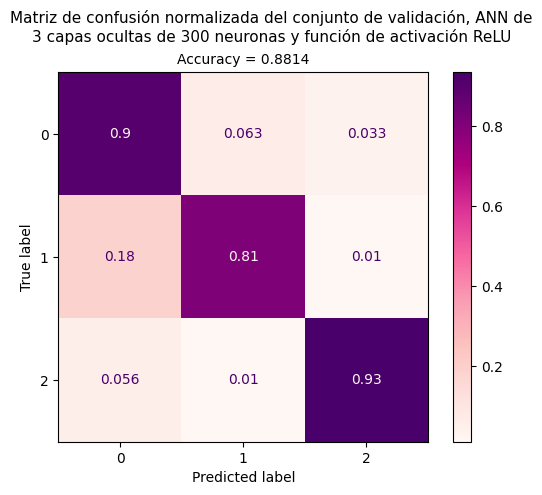


Entrenando: model_300co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 50
Mejor modelo en la época 50 con loss de validación = 0.255326


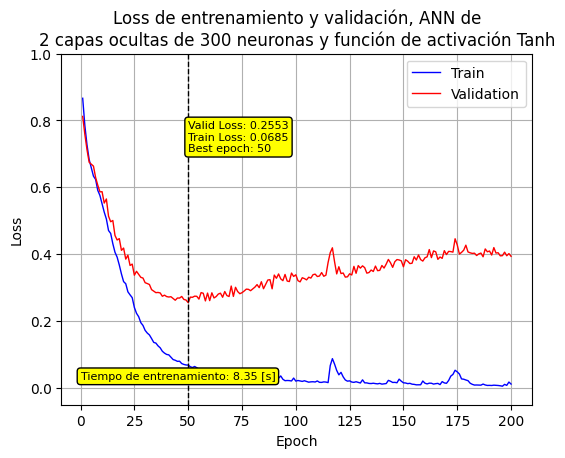

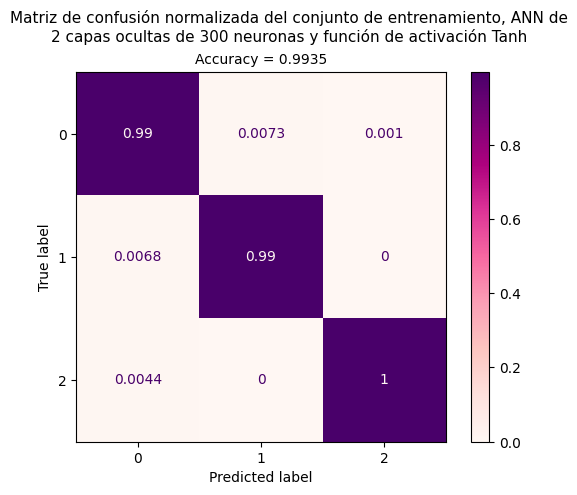

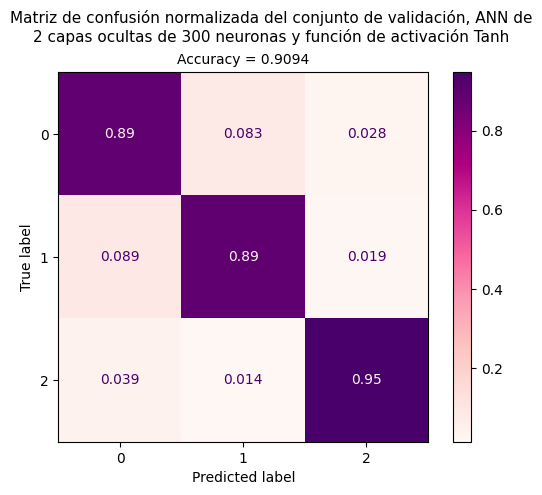


Entrenando: model_300co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 51
Mejor modelo en la época 51 con loss de validación = 0.217945


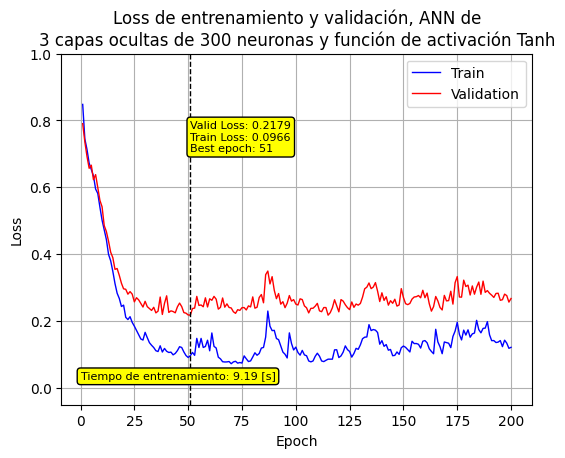

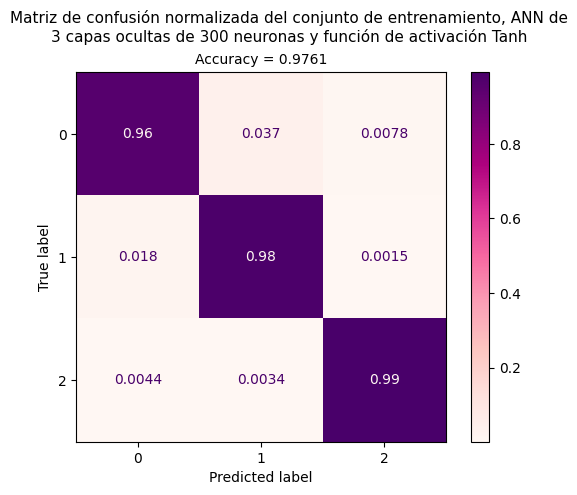

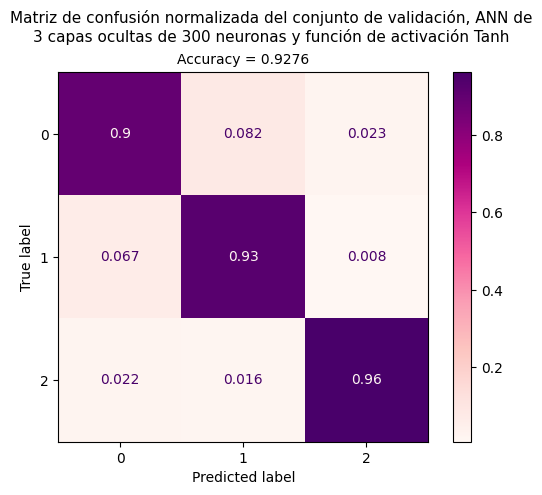


Entrenando: model_400co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.317240


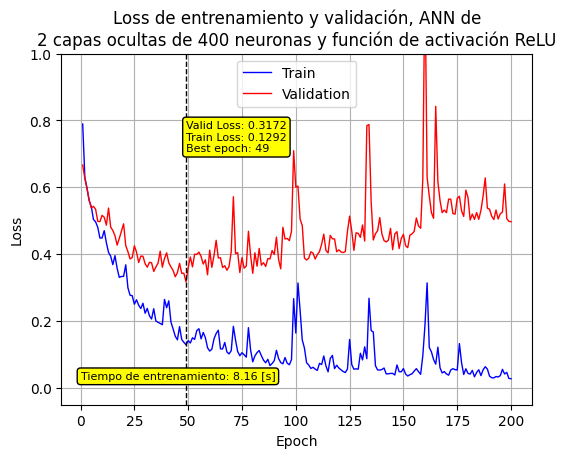

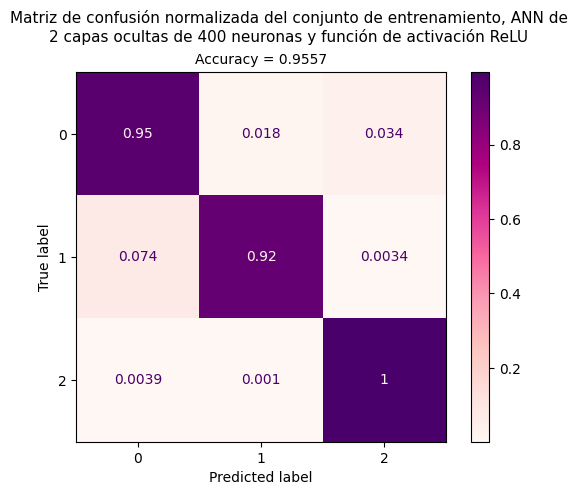

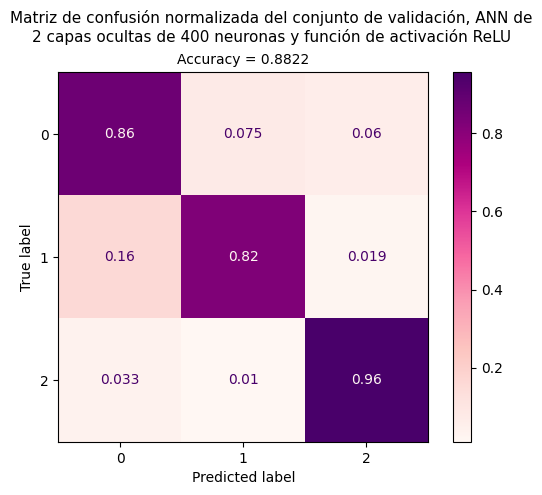


Entrenando: model_400co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 60
Mejor modelo en la época 60 con loss de validación = 0.315892


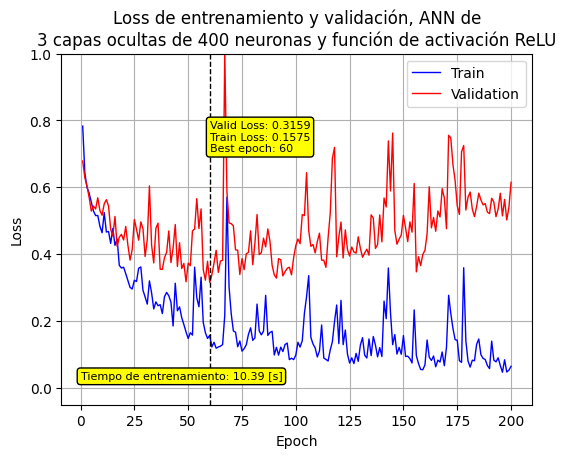

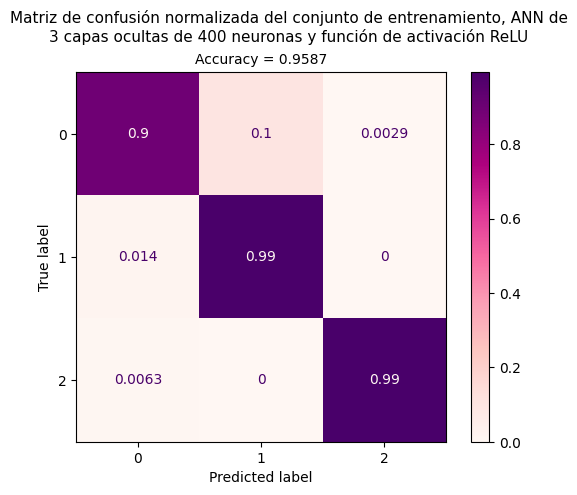

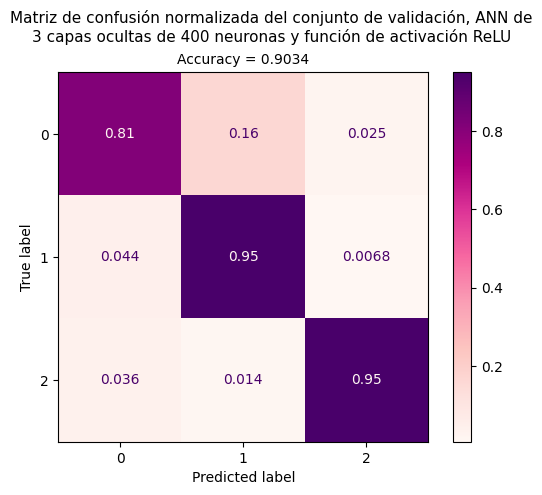


Entrenando: model_400co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.224789


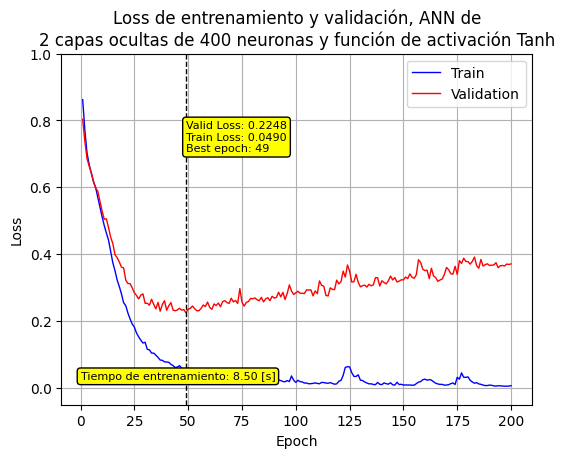

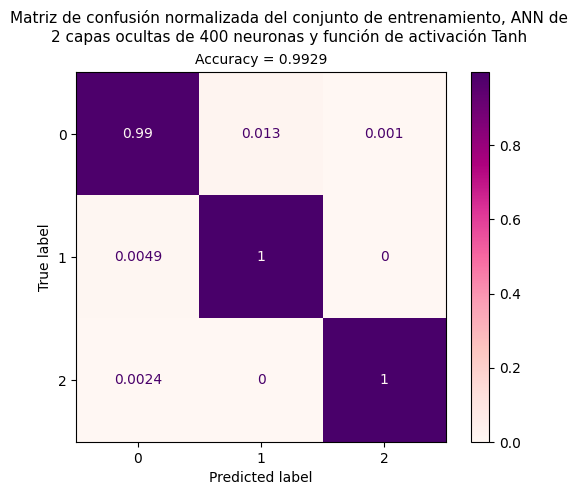

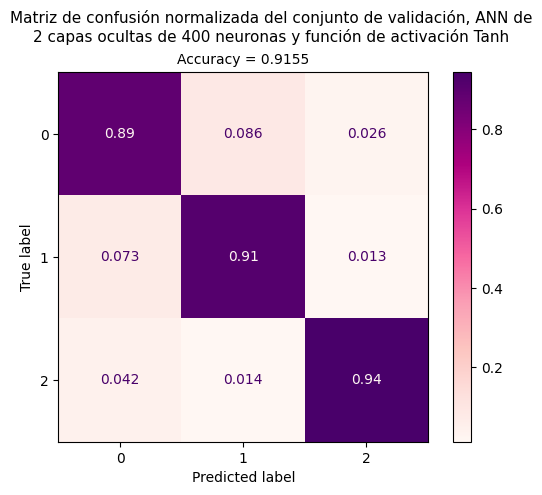


Entrenando: model_400co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 41
Mejor modelo en la época 41 con loss de validación = 0.197135


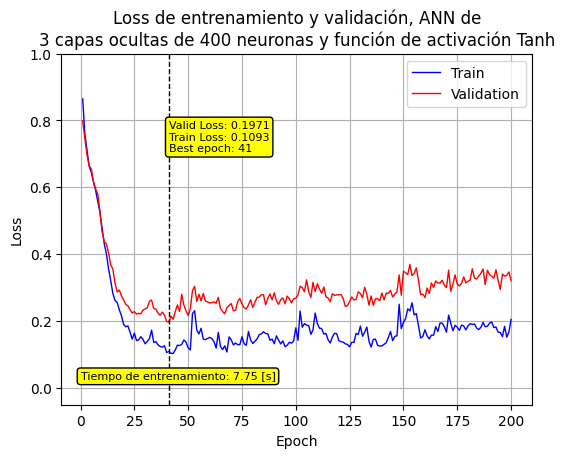

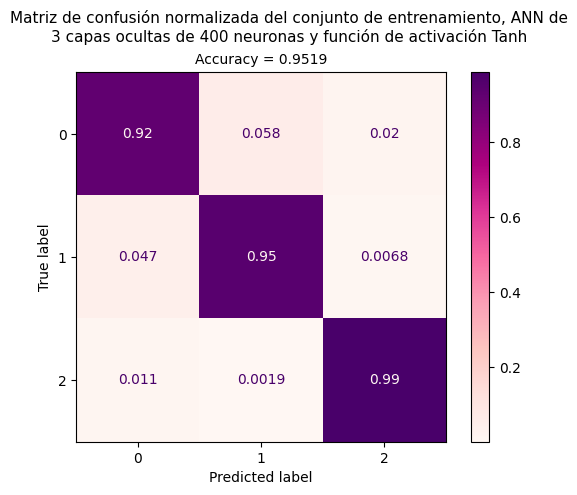

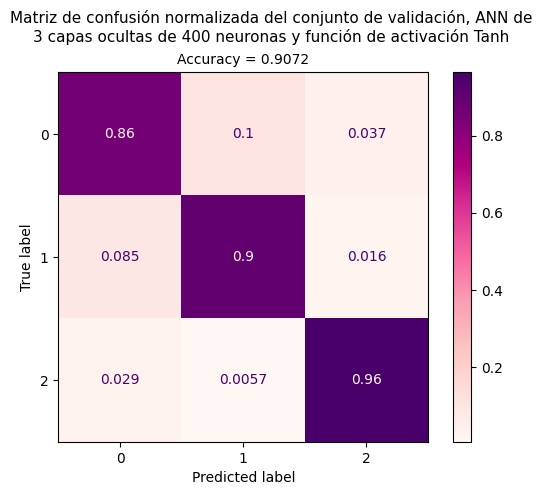

Early stopping at --------------------------------------------------> 41
Mejor modelo en la época 41 con loss de validación = 0.205584


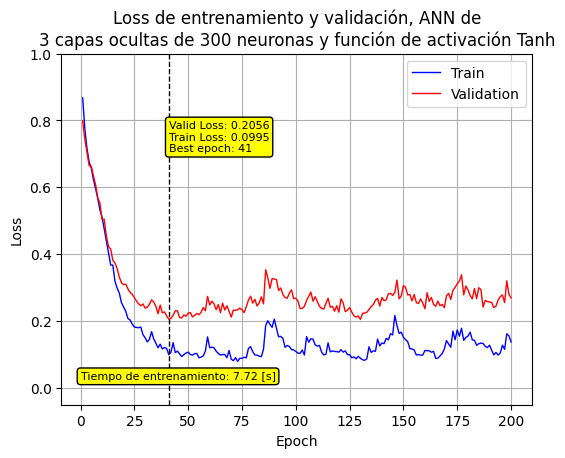

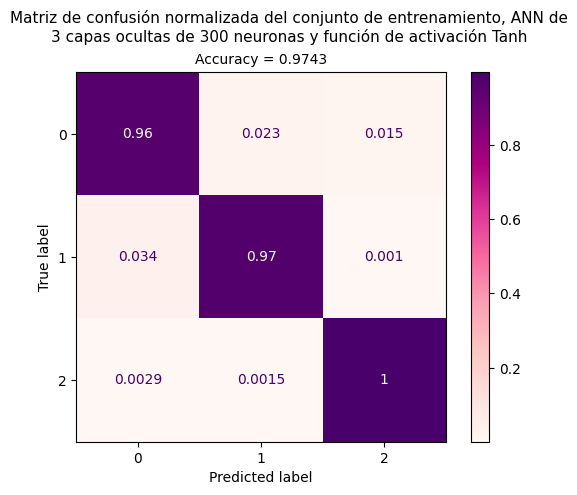

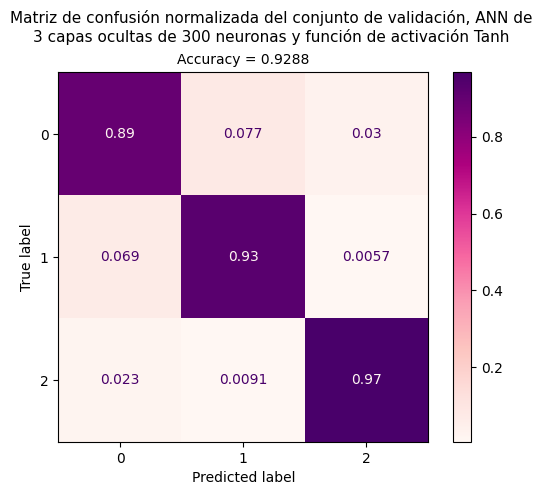

In [105]:
ruta = '/content/ANN/graficos/train/feature_selec/wrapper/' # Ruta para guardar los gráficos, variable global en este punto

hidden_sizes = [40, 90, 140, 200, 300, 400]
# hidden_sizes = [200, 300, 400]
# hidden_sizes = [300]

activations = {'ReLU': nn.ReLU, 'Tanh': nn.Tanh}
# activations = {'Tanh': nn.Tanh}

num_hidden_layers = [2, 3]
# num_hidden_layers = [3]

learning_rates = [1e-3]

n_epochs = 200

patience = 15

gs_ann_wrapper = GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dataloader_train_wrapper_GS, dataloader_val_wrapper_GS)
model_validated_wrapper, optimizer_wrapper = ANN_by_name(gs_ann_wrapper)

model_validated_wrapper = model_validated_wrapper.to(device)

model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated_wrapper, patience, n_epochs, optimizer_wrapper, dataloader_train_wrapper, dataloader_val_wrapper)
acc_trained_model = results_ANN(model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

In [106]:
gs_ann_wrapper

,name,activation,layers,hidden_size,lr,valid_loss,train_loss,best_epoch,time,acc_val
1,model_300co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,300,0.001,0.217945,0.096611,51,9.187216,0.927624
2,model_200co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,200,0.001,0.242385,0.099173,66,11.261909,0.915498
3,model_140co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,140,0.001,0.351842,0.296921,36,6.896116,0.915498
4,model_400co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,400,0.001,0.224789,0.049007,49,8.501545,0.915498
5,model_200co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,200,0.001,0.254730,0.055493,77,12.105108,0.911330
6,model_300co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,300,0.001,0.255326,0.068486,50,8.350888,0.909435
7,model_400co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,400,0.001,0.197135,0.109347,41,7.749174,0.907162
8,model_140co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,140,0.001,0.282552,0.066507,82,12.950102,0.903372
9,model_400co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,400,0.001,0.315892,0.157501,60,10.388159,0.903372
10,model_200co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,200,0.001,0.308316,0.138794,72,11.937418,0.898825


## Selección empírica de características

In [107]:
dataloader_train_w_mean, dataloader_val_w_mean, dataloader_test_w_mean = dataloader_creator(df_train[[col for col in df_train.columns if col.startswith('mean_')]], y_train, df_val[[col for col in df_val.columns if col.startswith('mean_')]], y_val, df_test)
dataloader_train_w_mean_GS, dataloader_val_w_mean_GS = dataloader_creator_GS(df_val[[col for col in df_val_GS.columns if col.startswith('mean_')]], y_val)


Entrenando: model_40co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 90
Mejor modelo en la época 90 con loss de validación = 0.435116


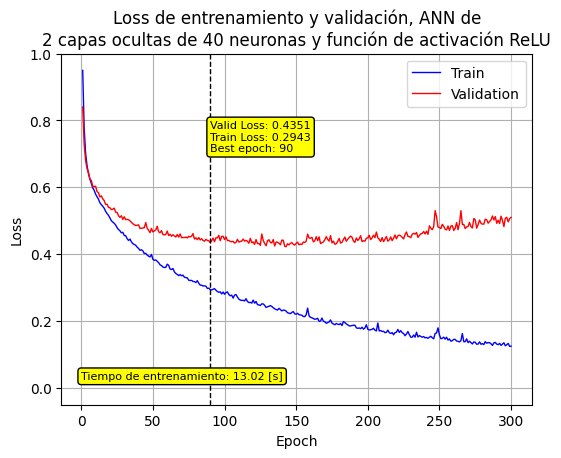

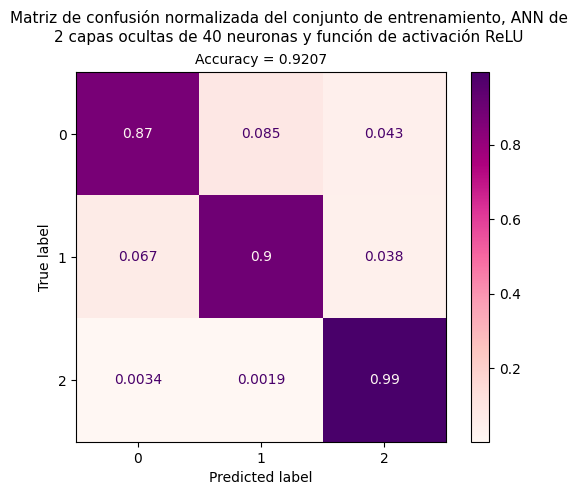

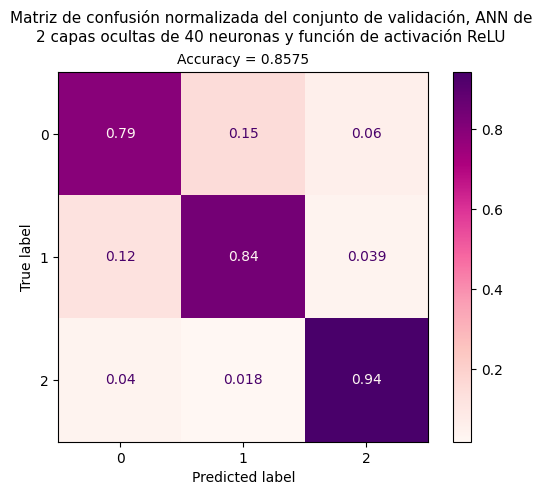


Entrenando: model_40co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.475622


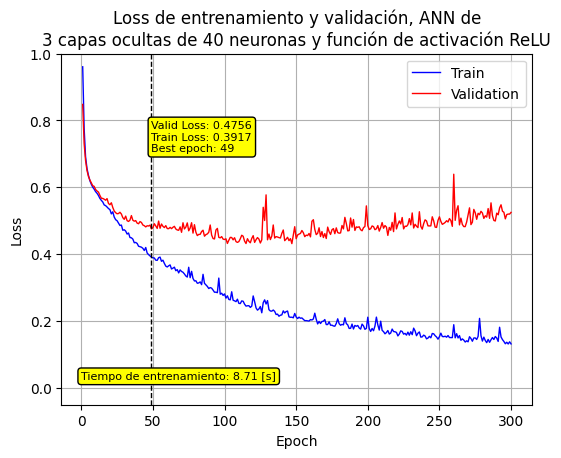

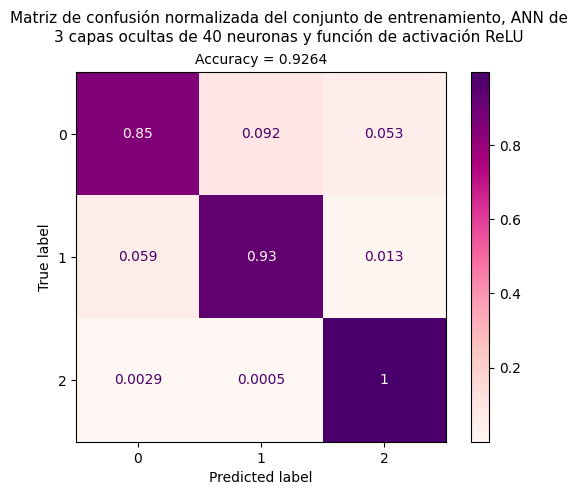

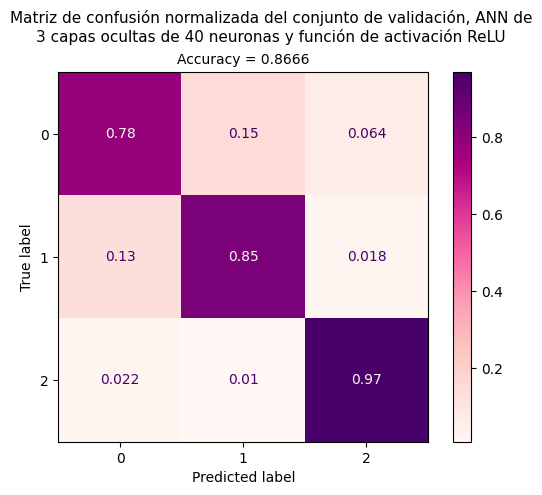


Entrenando: model_40co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 119
Mejor modelo en la época 119 con loss de validación = 0.394231


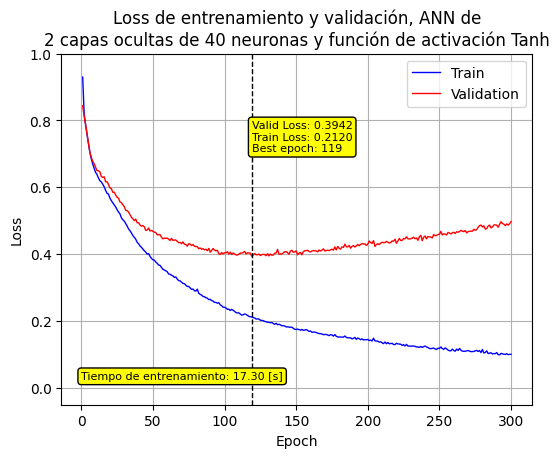

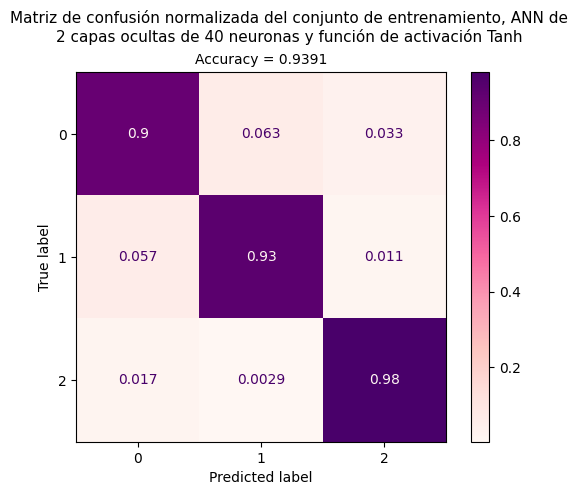

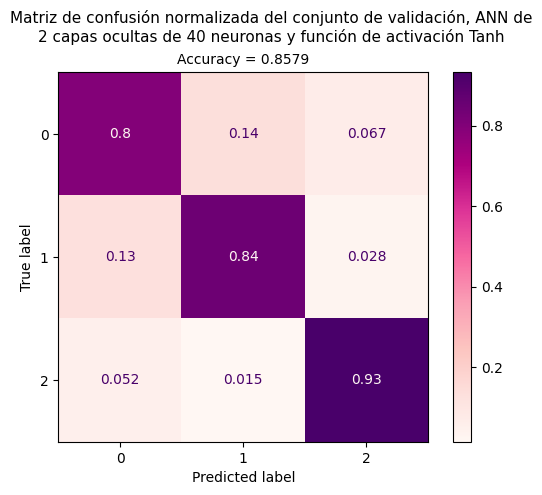


Entrenando: model_40co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 128
Mejor modelo en la época 128 con loss de validación = 0.407555


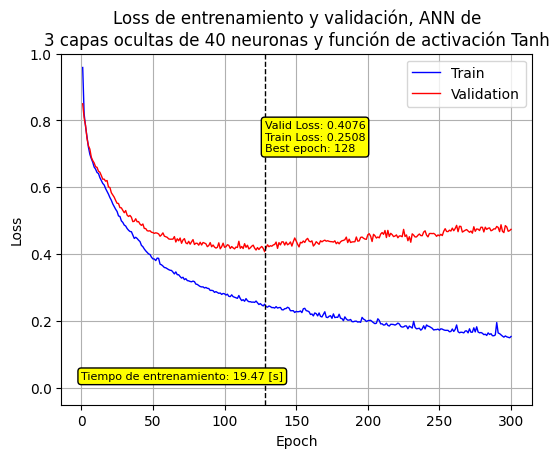

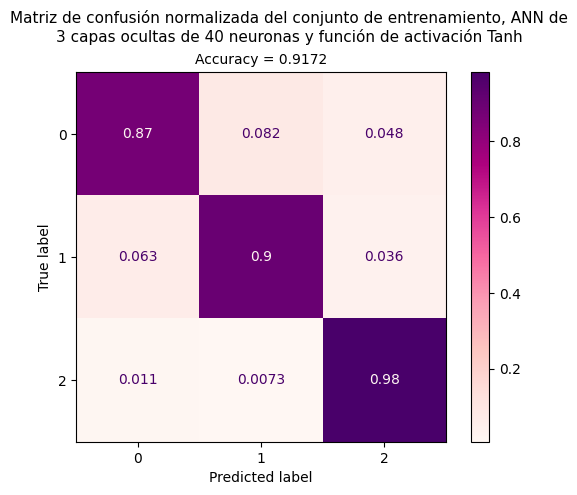

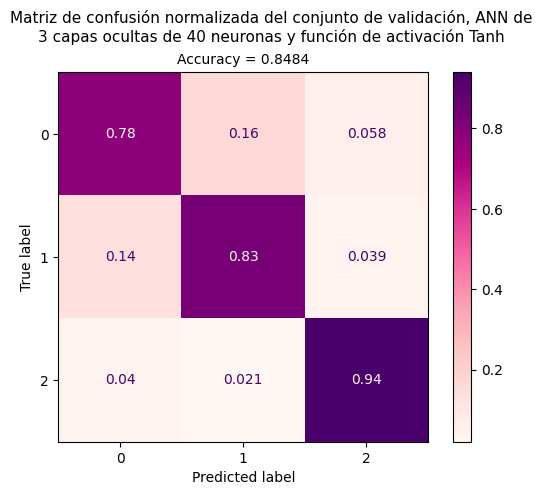


Entrenando: model_90co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 100
Mejor modelo en la época 100 con loss de validación = 0.386230


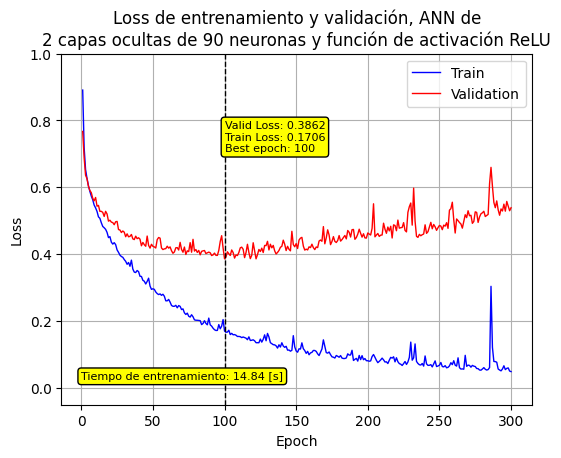

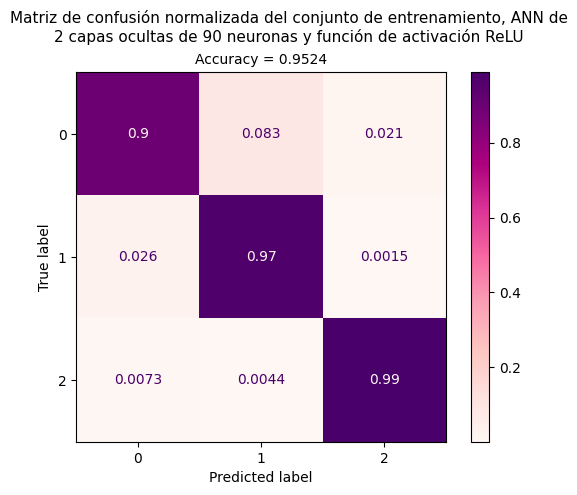

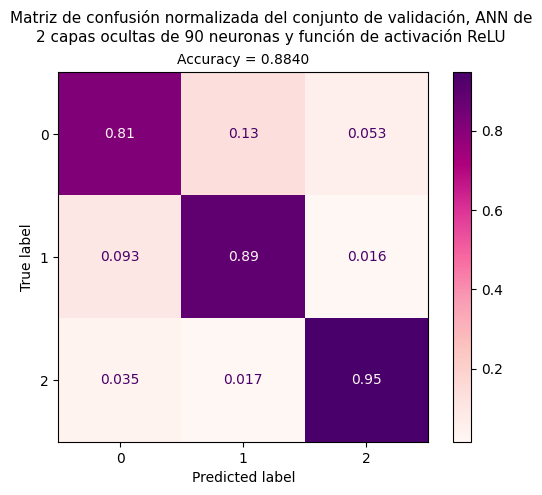


Entrenando: model_90co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 74
Mejor modelo en la época 74 con loss de validación = 0.355938


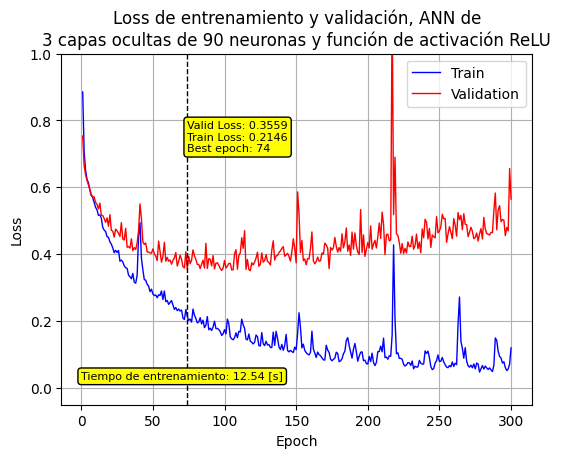

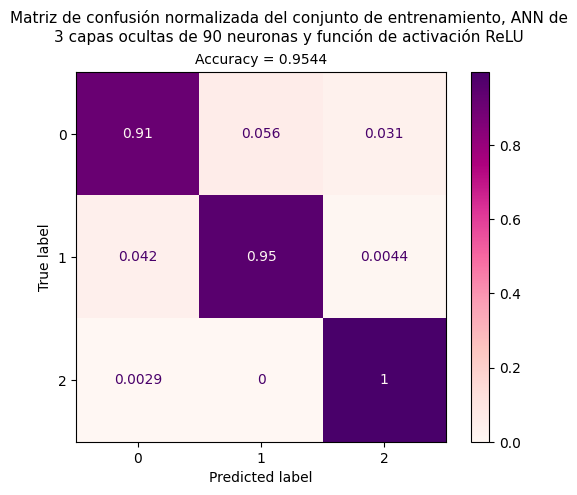

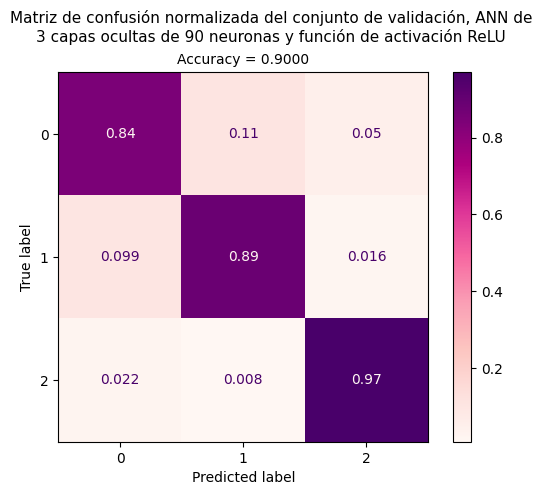


Entrenando: model_90co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 99
Mejor modelo en la época 99 con loss de validación = 0.302030


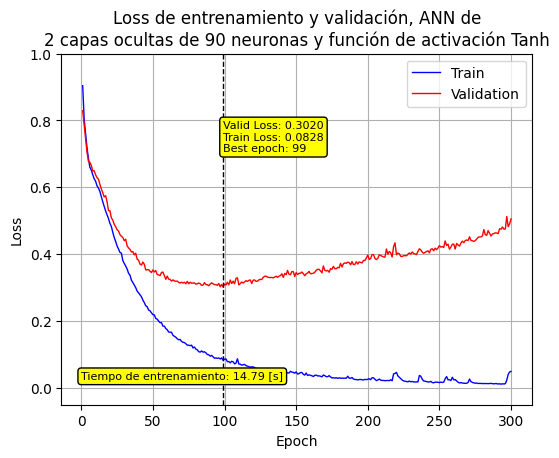

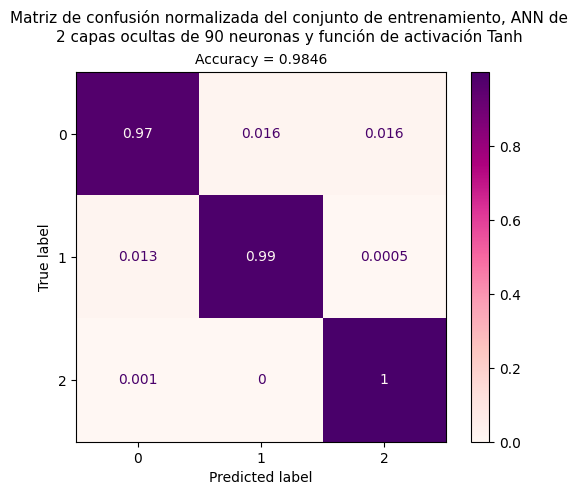

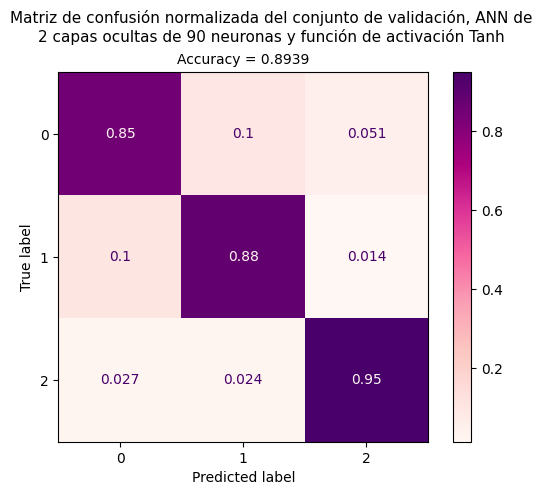


Entrenando: model_90co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 82
Mejor modelo en la época 82 con loss de validación = 0.291536


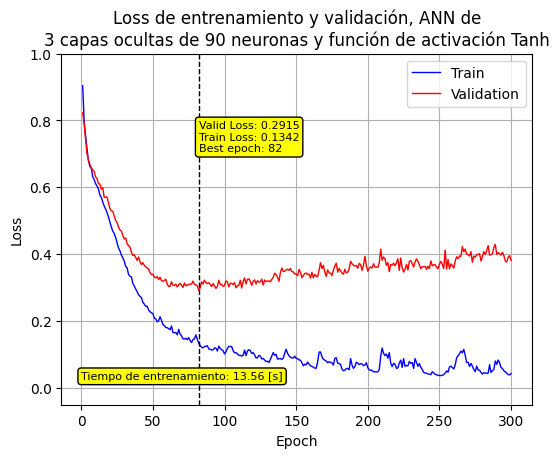

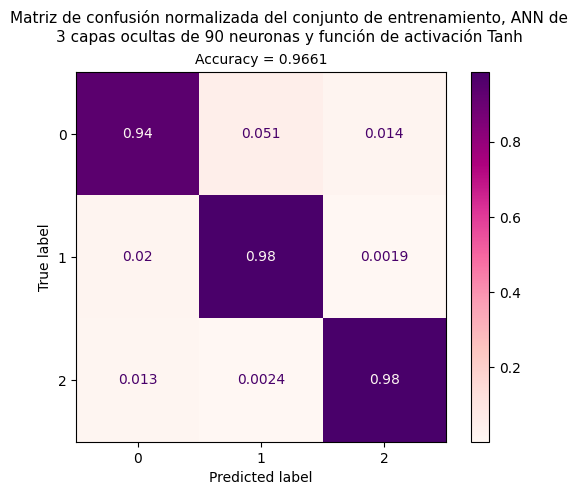

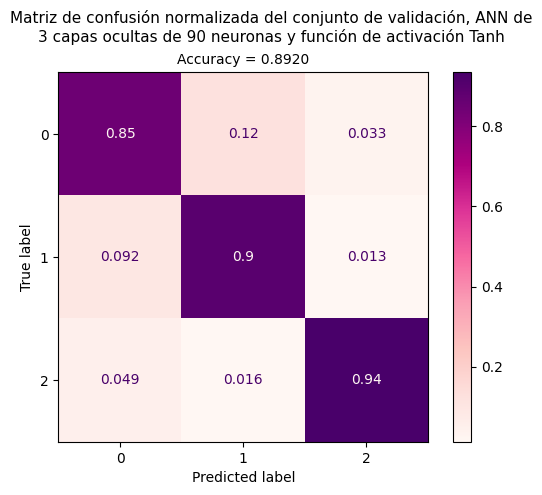


Entrenando: model_140co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 60
Mejor modelo en la época 60 con loss de validación = 0.356383


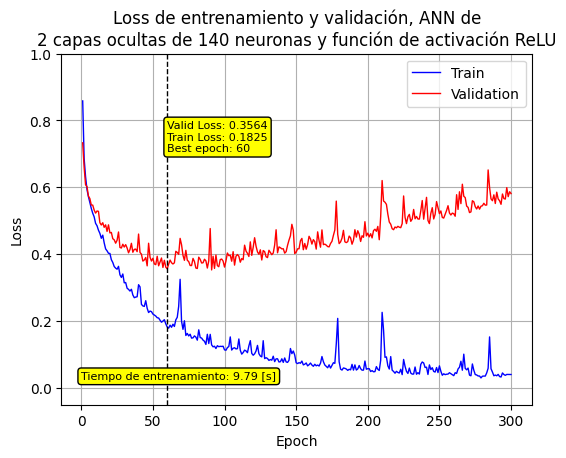

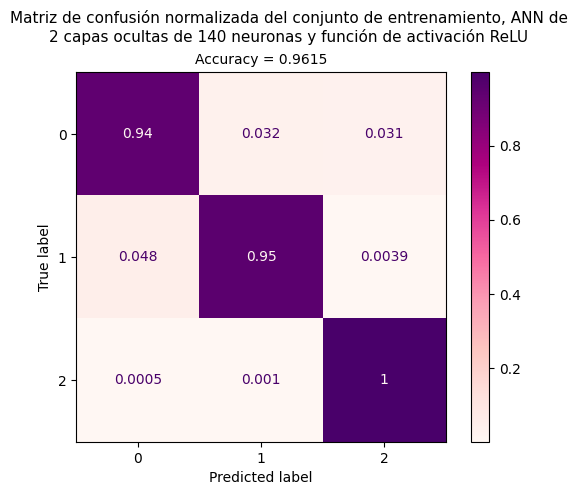

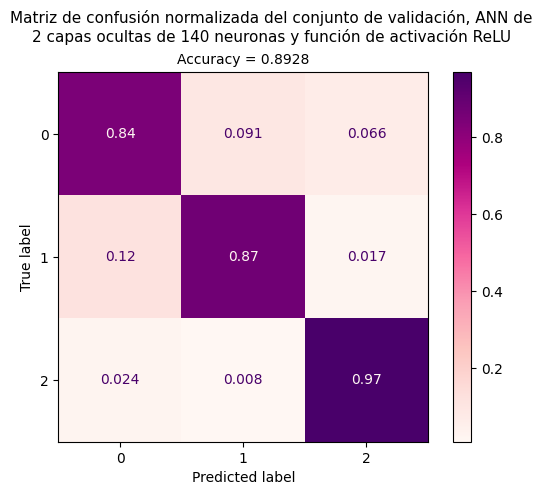


Entrenando: model_140co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 69
Mejor modelo en la época 69 con loss de validación = 0.338601


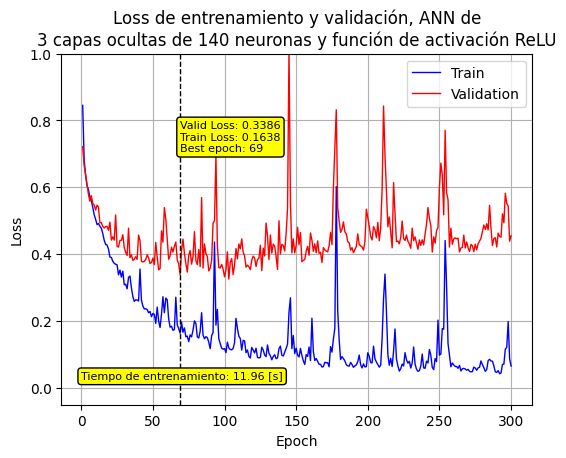

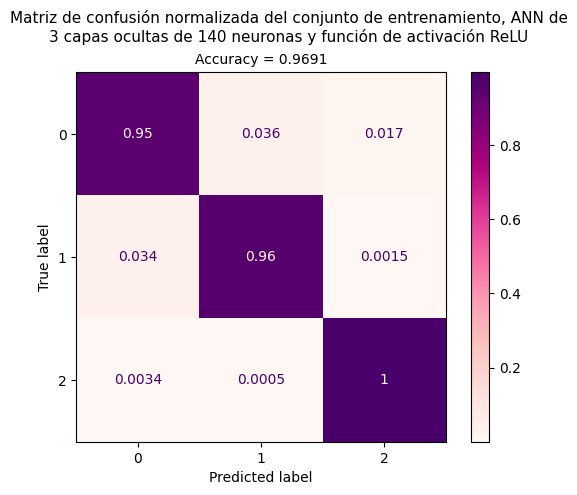

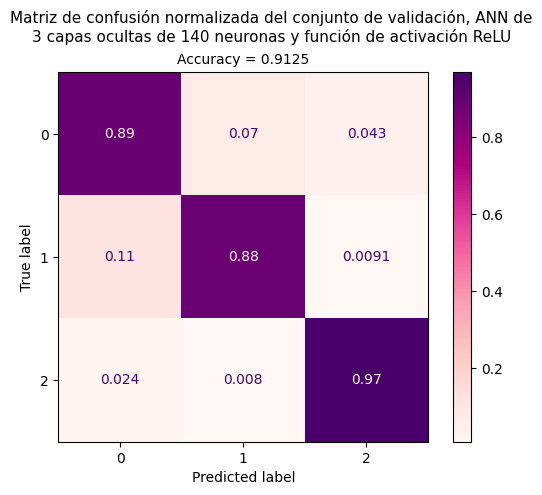


Entrenando: model_140co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 66
Mejor modelo en la época 66 con loss de validación = 0.281321


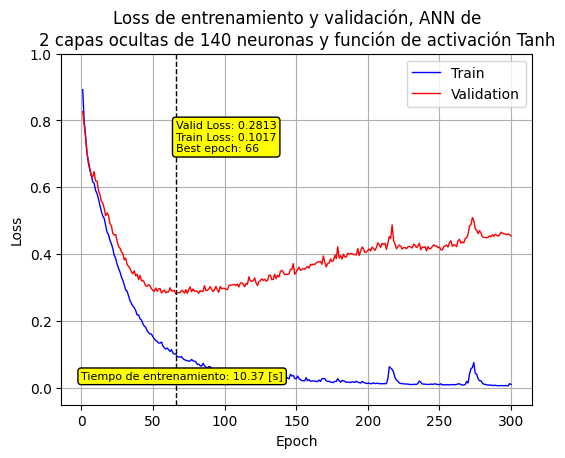

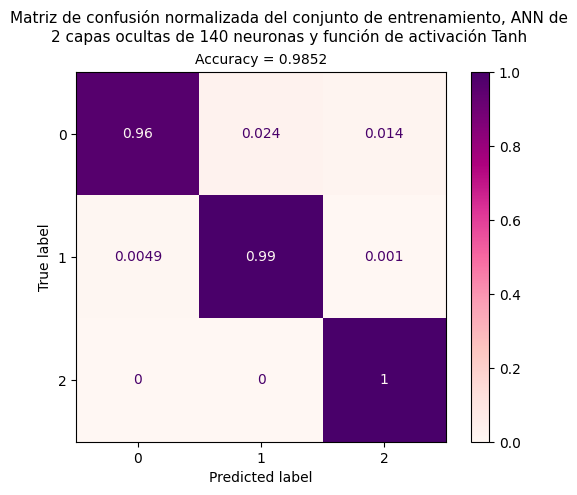

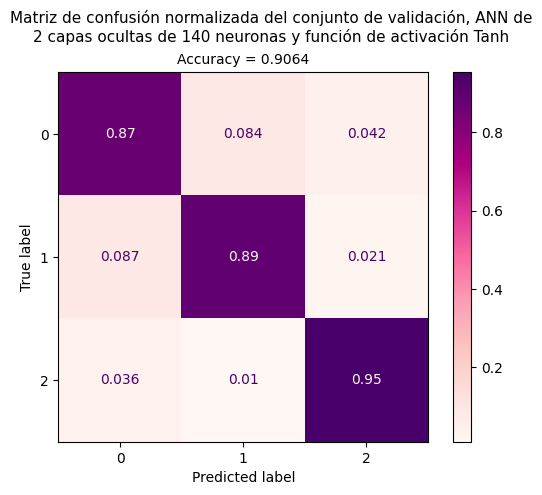


Entrenando: model_140co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 87
Mejor modelo en la época 87 con loss de validación = 0.262285


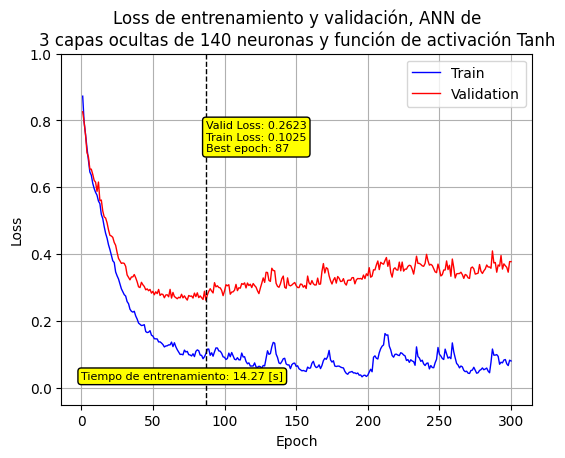

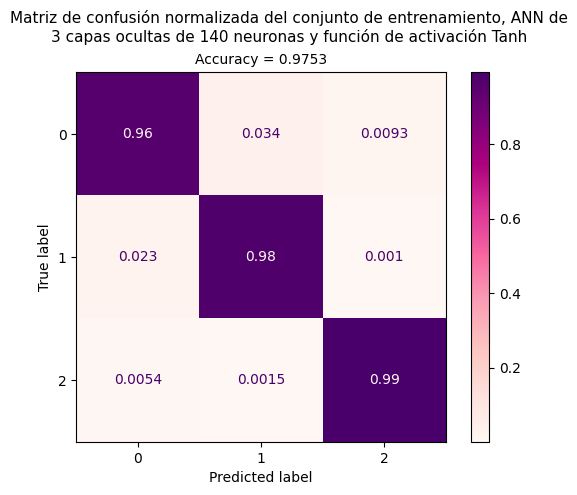

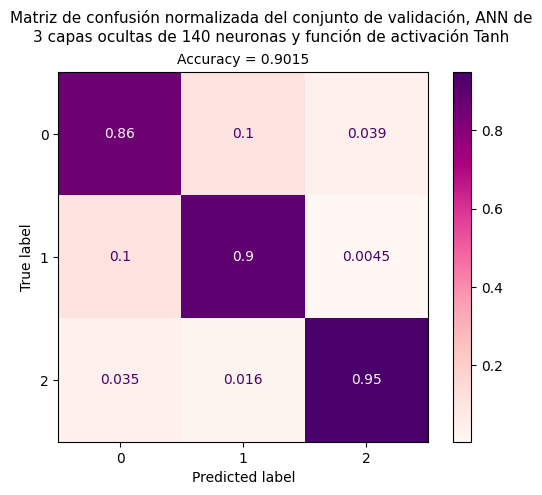


Entrenando: model_200co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 40
Mejor modelo en la época 40 con loss de validación = 0.352292


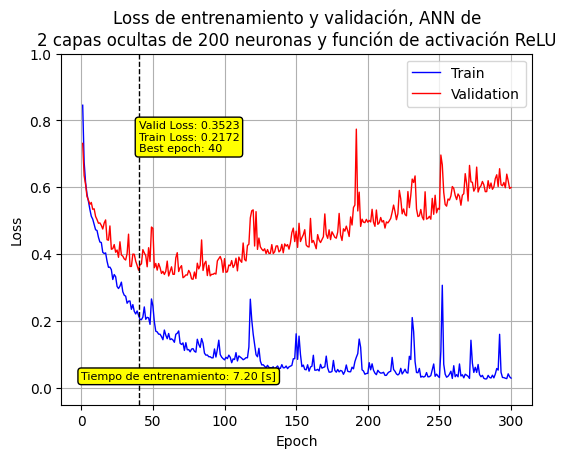

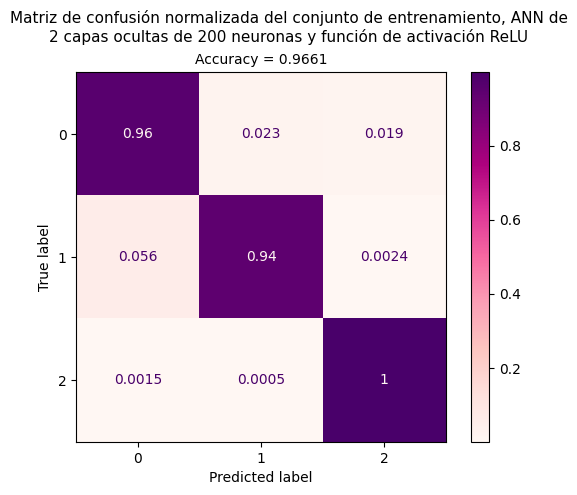

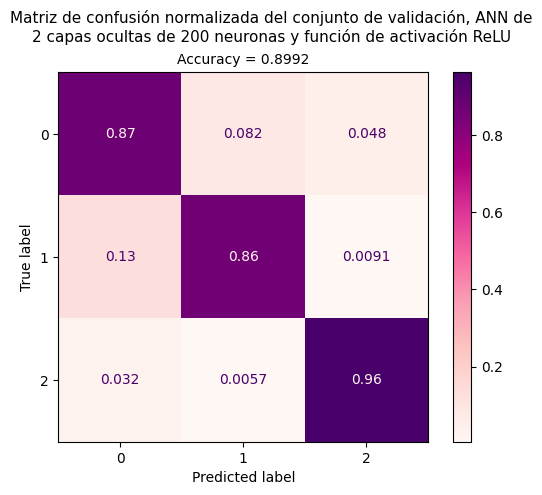


Entrenando: model_200co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 64
Mejor modelo en la época 64 con loss de validación = 0.296671


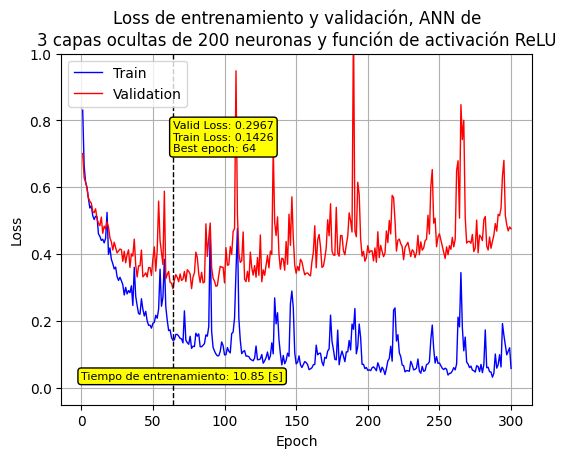

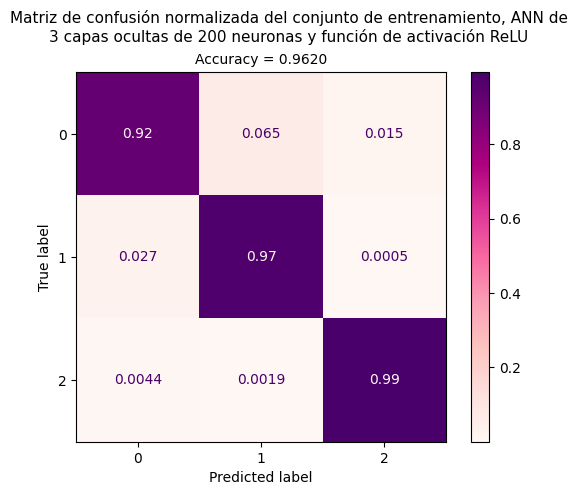

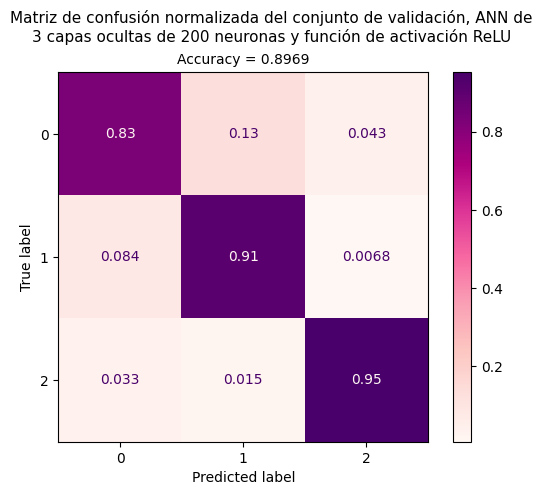


Entrenando: model_200co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 53
Mejor modelo en la época 53 con loss de validación = 0.278945


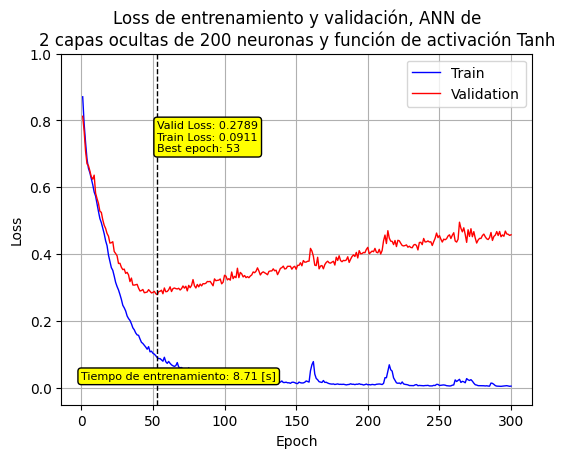

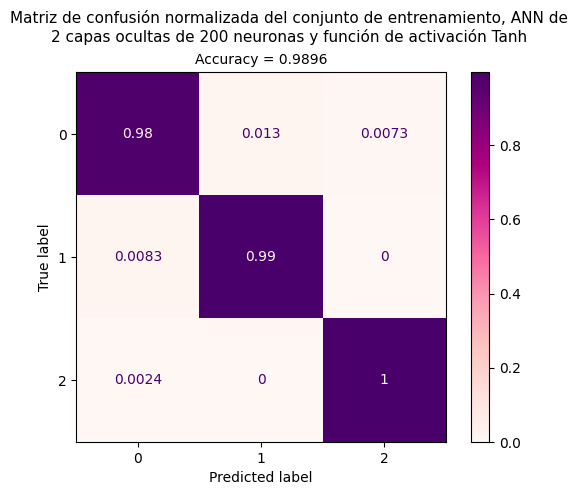

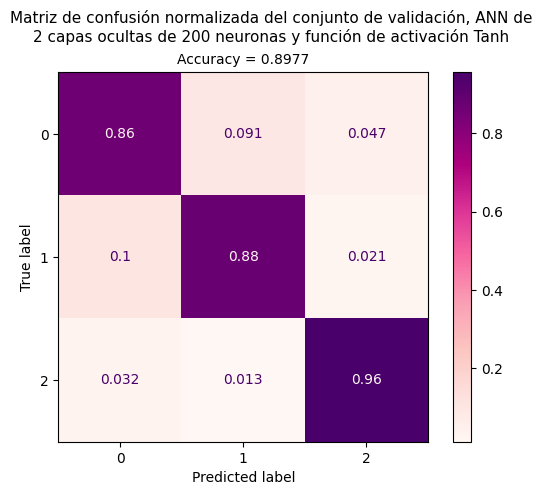


Entrenando: model_200co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 70
Mejor modelo en la época 70 con loss de validación = 0.234366


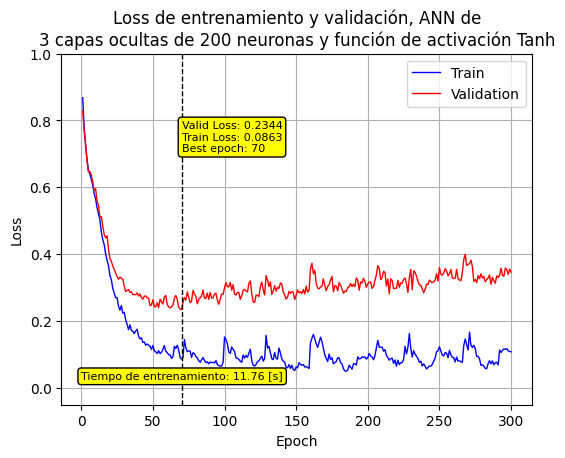

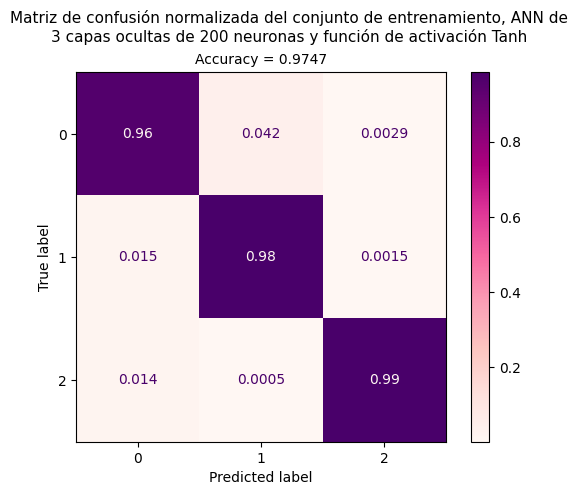

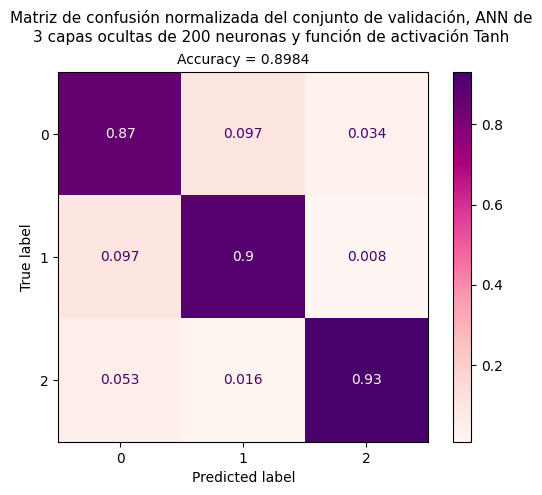


Entrenando: model_300co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 59
Mejor modelo en la época 59 con loss de validación = 0.332350


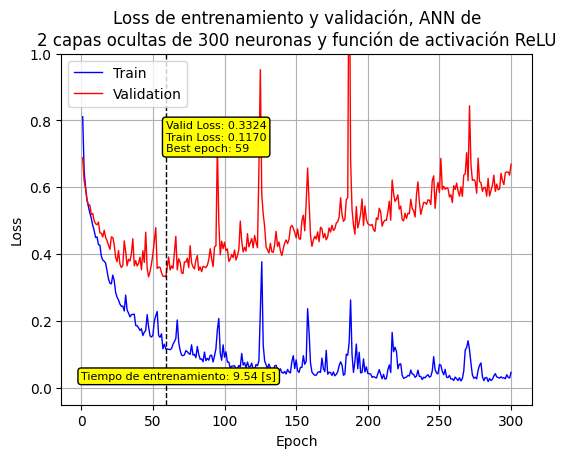

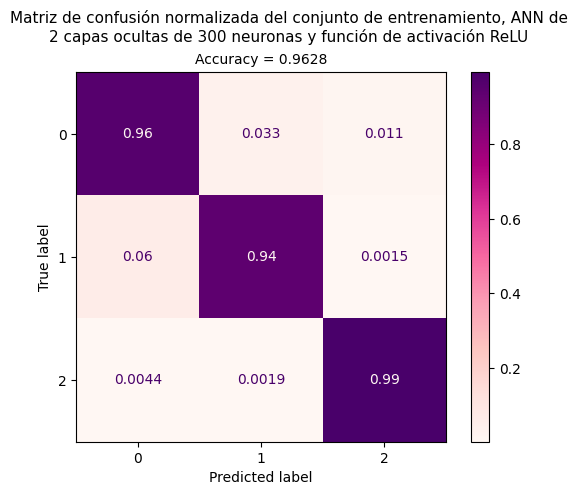

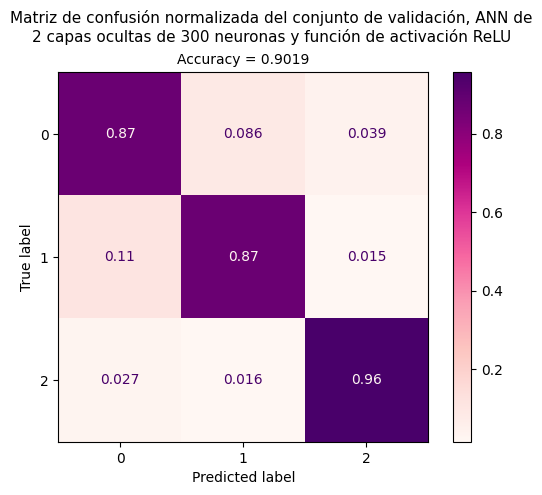


Entrenando: model_300co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 51
Mejor modelo en la época 51 con loss de validación = 0.306304


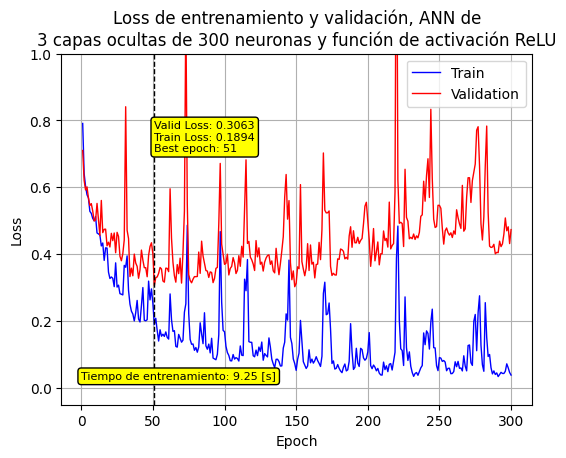

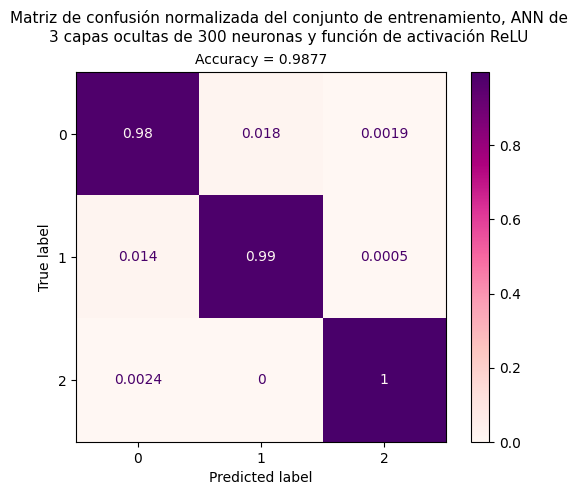

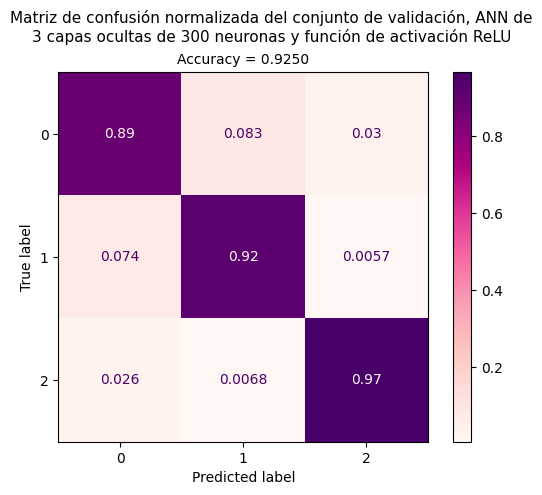


Entrenando: model_300co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 47
Mejor modelo en la época 47 con loss de validación = 0.251533


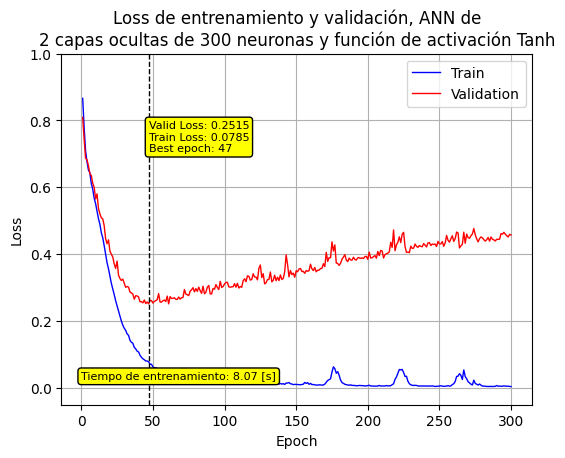

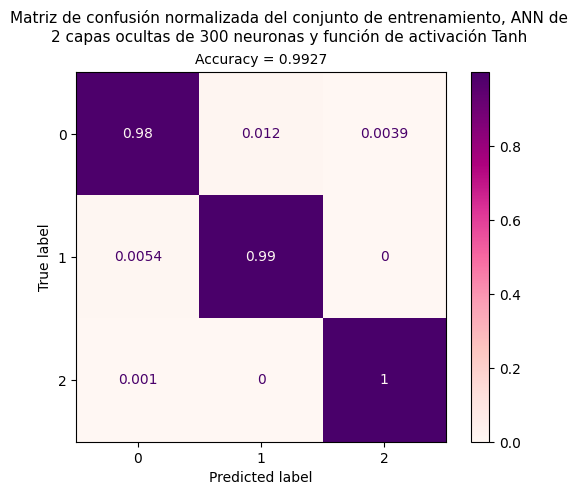

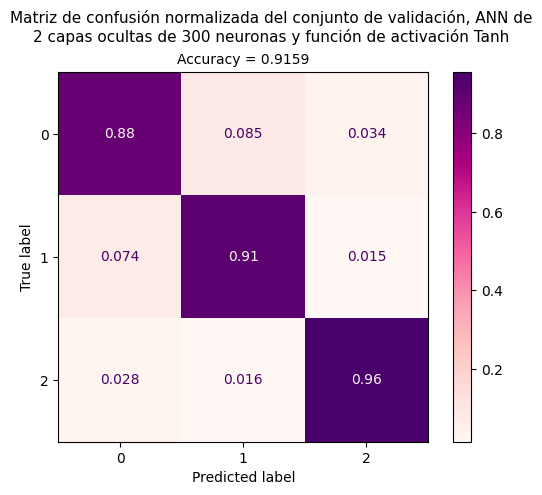


Entrenando: model_300co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 50
Mejor modelo en la época 50 con loss de validación = 0.219436


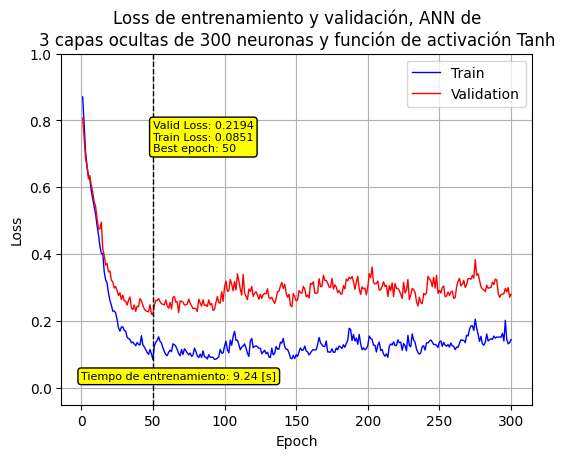

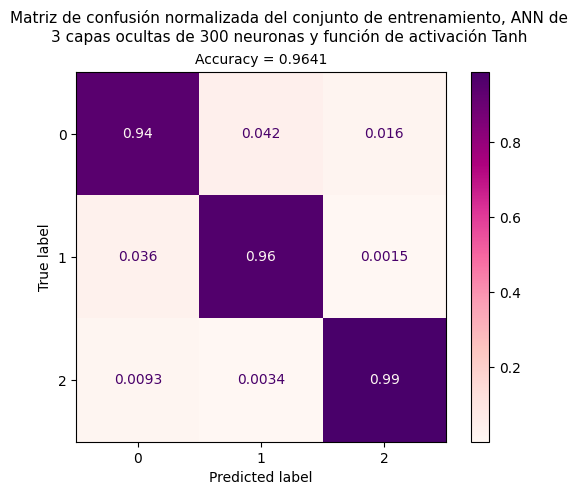

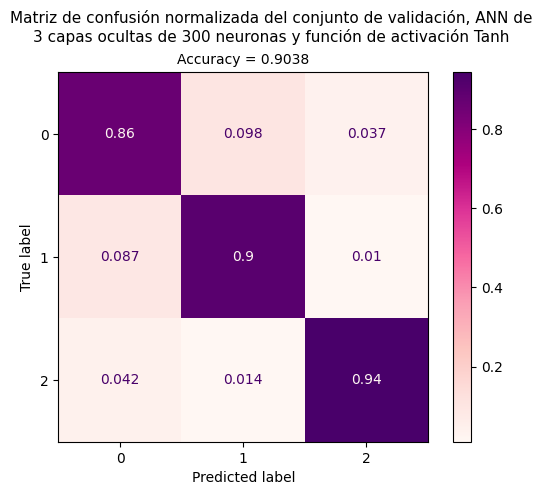


Entrenando: model_400co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 57
Mejor modelo en la época 57 con loss de validación = 0.325101


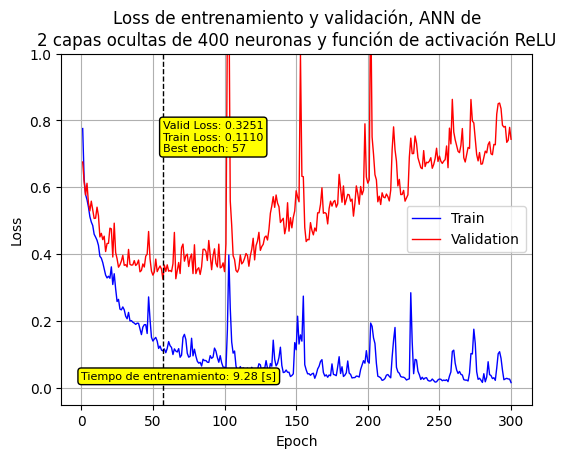

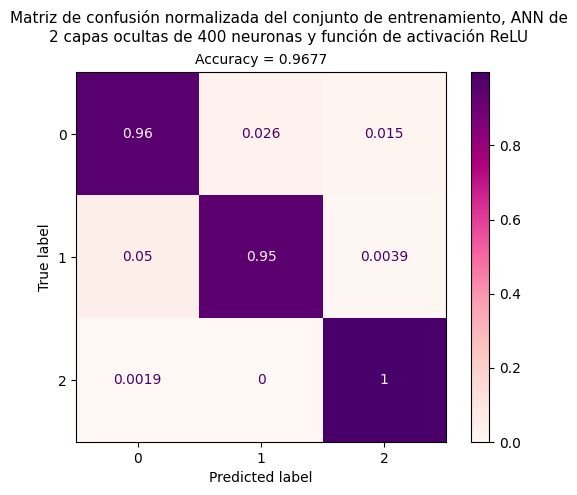

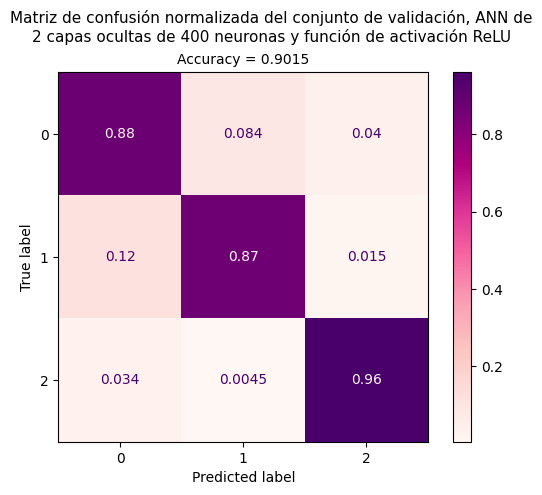


Entrenando: model_400co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 42
Mejor modelo en la época 42 con loss de validación = 0.329064


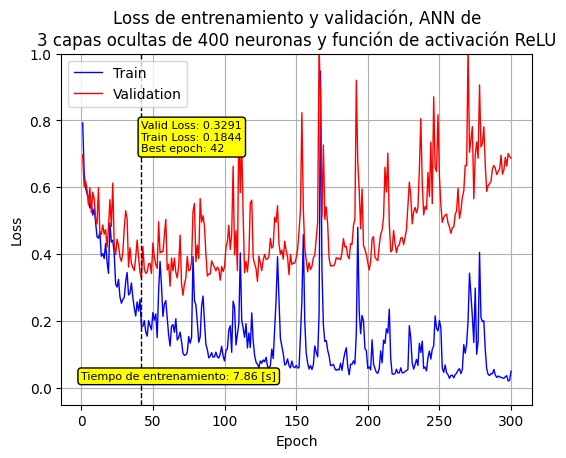

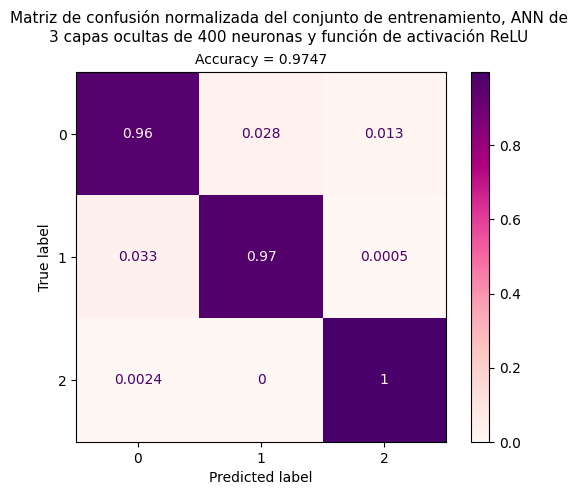

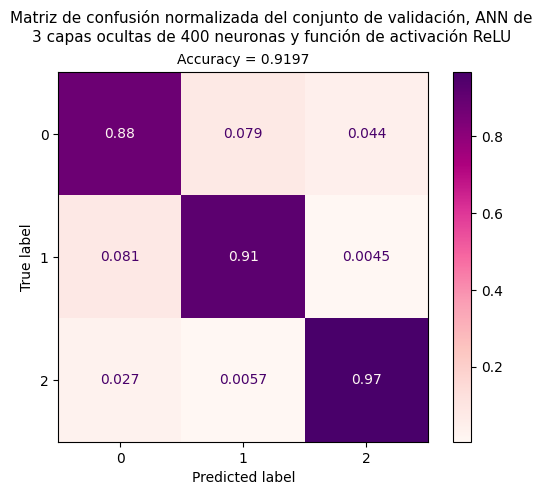


Entrenando: model_400co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.241509


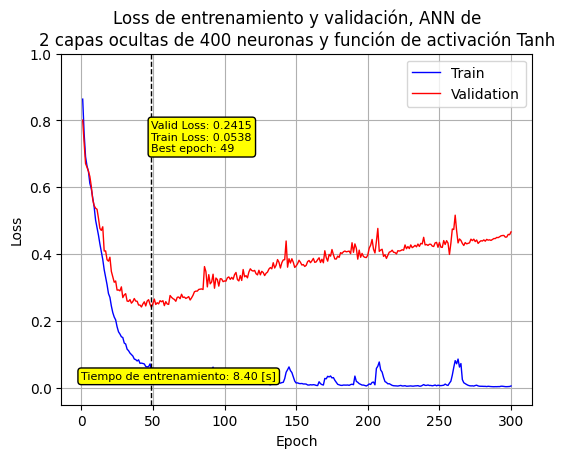

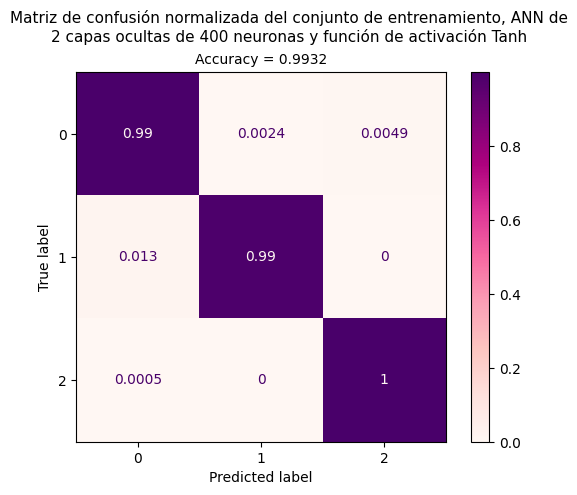

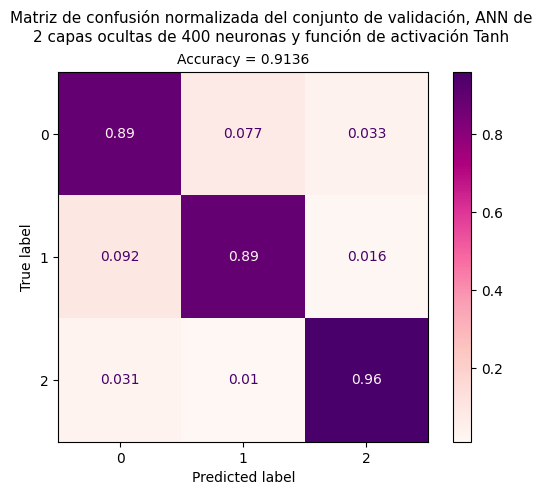


Entrenando: model_400co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.205297


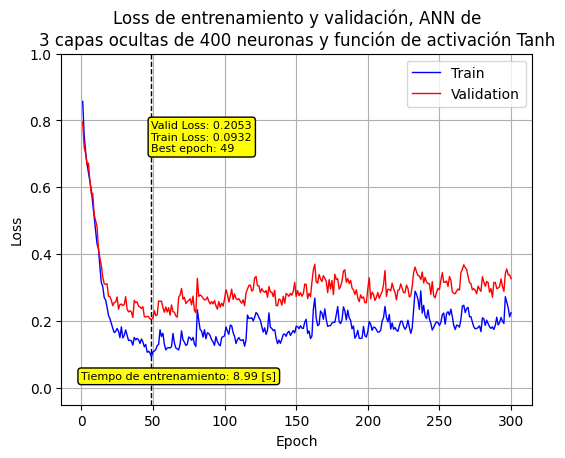

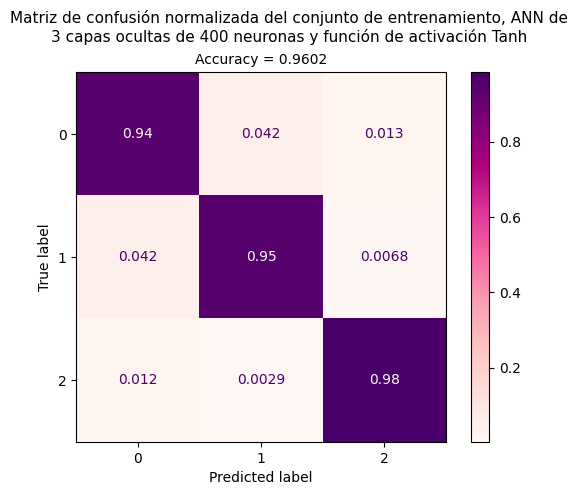

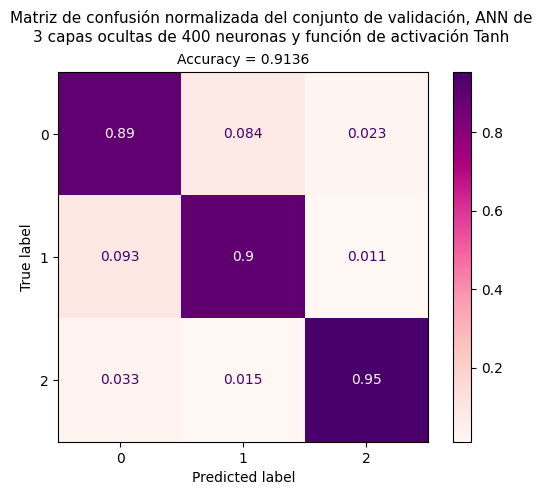

Early stopping at --------------------------------------------------> 59
Mejor modelo en la época 59 con loss de validación = 0.213487


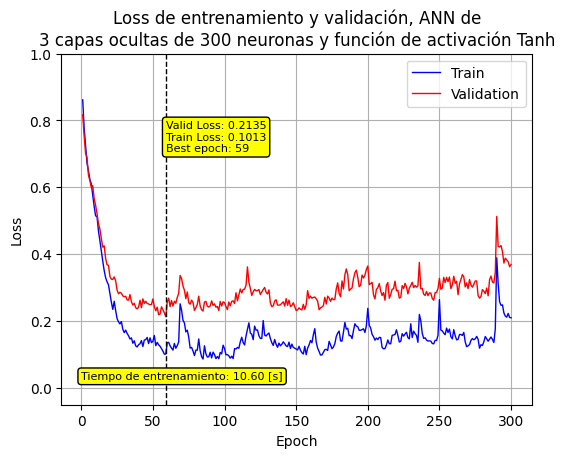

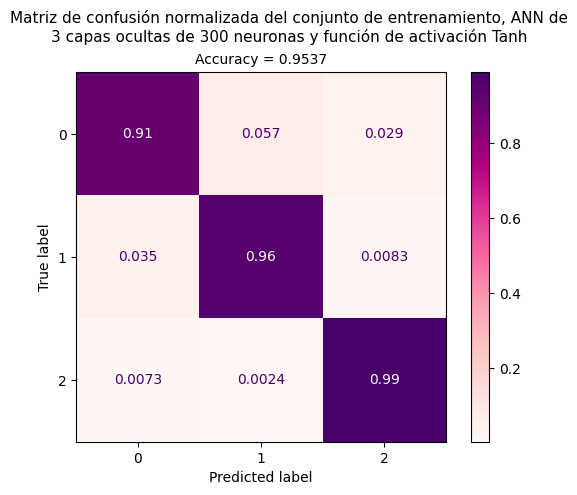

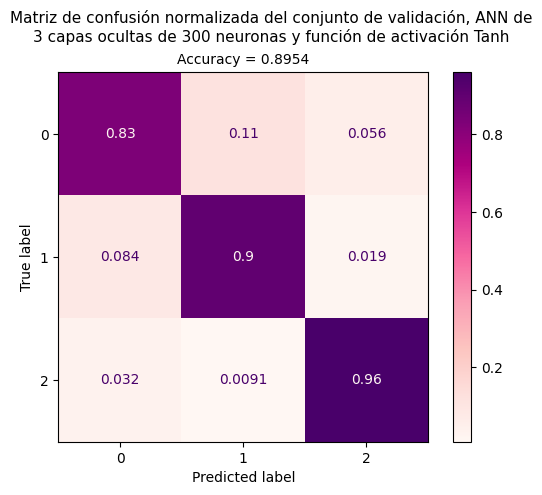

In [108]:
ruta = '/content/ANN/graficos/train/feature_selec/empiric/' # Ruta para guardar los gráficos, variable global en este punto

hidden_sizes = [40, 90, 140, 200, 300, 400]

activations = {'ReLU': nn.ReLU, 'Tanh': nn.Tanh}
# activations = {'Tanh': nn.Tanh}

num_hidden_layers = [2, 3]
# num_hidden_layers = [3]

learning_rates = [1e-3]

n_epochs = 300

patience = 15

gs_ann_w_mean = GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dataloader_train_w_mean_GS, dataloader_val_w_mean_GS)
model_validated_w_mean, optimizer_w_mean = ANN_by_name(gs_ann_wrapper)

model_validated_w_mean = model_validated_w_mean.to(device)

model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated_w_mean, patience, n_epochs, optimizer_w_mean, dataloader_train_w_mean, dataloader_val_w_mean)
acc_trained_model = results_ANN(model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

In [109]:
gs_ann_w_mean

,name,activation,layers,hidden_size,lr,valid_loss,train_loss,best_epoch,time,acc_val
1,model_300co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,300,0.001,0.306304,0.189413,51,9.246637,0.924972
2,model_400co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,400,0.001,0.329064,0.184419,42,7.857940,0.919667
3,model_300co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,300,0.001,0.251533,0.078534,47,8.070554,0.915877
4,model_400co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,400,0.001,0.241509,0.053758,49,8.404814,0.913604
5,model_400co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,400,0.001,0.205297,0.093160,49,8.994863,0.913604
6,model_140co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,140,0.001,0.338601,0.163849,69,11.963134,0.912467
7,model_140co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,140,0.001,0.281321,0.101650,66,10.372298,0.906404
8,model_300co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,300,0.001,0.219436,0.085106,50,9.238935,0.903751
9,model_300co2_ReLU,<class 'torch.nn.modules.activation.ReLU'>,2,300,0.001,0.332350,0.116985,59,9.544241,0.901857
10,model_140co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,140,0.001,0.262285,0.102535,87,14.266263,0.901478


In [111]:
import os
import zipfile

folder_path = "/content/ANN"
zip_path = "/content/ANN.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            # Guardar la estructura relativa para mantener los subdirectorios
            arcname = os.path.relpath(file_path, start=folder_path)
            zipf.write(file_path, arcname=arcname)

# DESDE AQUI ES BORRADOR

# II) Nuevo vector de características
Se prueba un nuevo vector de características, esta vez incluyendo características tales como el mínimo, el máximo y la media móvil, entre otras.

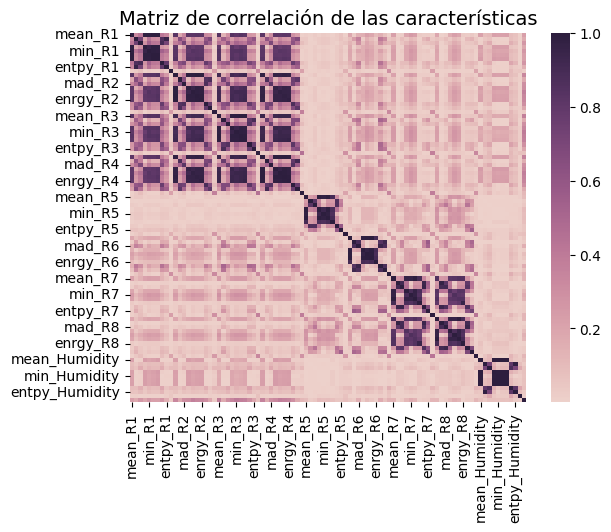

In [ ]:
# correlation_data = df_train_w_class[df_train_w_class['class']==3].corr(method='pearson')
# correlation_data_abs_value = abs(df_train_w_class[df_train_w_class['class']==3].corr(method='pearson'))

correlation_data = df_train_w_class.corr(method='pearson')
correlation_data_abs_value = abs(df_train_w_class.corr(method='pearson'))
sns.heatmap(correlation_data_abs_value, cmap=sns.cubehelix_palette(as_cmap=True))
plt.title("Matriz de correlación de las características", fontsize=14)
plt.savefig('corr_lineal.svg', format='svg', bbox_inches='tight', pad_inches=0)

Se concluye que la media es lo que hace una clasificación relativamente exitosa (50% de corr con la clase), pero la varianza no ayuda en nada (por debajo de 30% de corr con la clase para las primeras 4 características y caso 0% para el resto). Así que se calcula un nuevo vector de carcaterísticas. Finalmente lo dejé solo con la media y el mismo clasificador que usé al inicio con el 1er vector de carcaterísticas que usé (media y varianza). Ahora lo que queda pendiente es usar otras características para justificar que la media es la mejor.

In [ ]:
def calculation_feature_vector_2(df_data):

  caracs_list = []

  big_data_arr = np.zeros((len(df_data), 18))

  for i in range(0, len(df_data)):
  # for i in range(0, 2):
    data_list = []

    for j in range(1,10):

      if j == 9:
        df_calc = df_data.loc[i, f'Humidity_0':f'Humidity_127'] #display(df_trainval.loc[i, f'Humidity_0':f'Humidity_127'])
      else:
        df_calc = df_data.loc[i, f'R{j}_0':f'R{j}_127'] #display(df_trainval.loc[i, f'R{j}_0':f'R{j}_127'])

      if i == 0:
        # 2° it features
        caracs_list.append('mean_' + str(j))
        # caracs_list.append('var_' + str(j))
        # caracs_list.append('min_' + str(j))
        # caracs_list.append('max_' + str(j))
        # caracs_list.append('sma_' + str(j))
        caracs_list.append('slope_' + str(j))

        df = pd.DataFrame(columns=caracs_list)

      data_list.append(np.mean(df_calc))
      # data_list.append(np.var(df_calc))
      # data_list.append(min(df_calc))
      # data_list.append(max(df_calc))
      # data_list.append(np.ma.average(df_calc))
      # 'slope': np.polyfit(x, signal, 1)[0]
      data_list.append(np.polyfit(np.arange(128), df_calc, 1)[0]) #Nueva carcaterística, probada hoy (08/07) al final del día

    # print(i)
    big_data_arr[i,:] = np.array(data_list)

  df = pd.DataFrame(big_data_arr, columns=caracs_list)

  if 'class' in df_data.columns:
    df = pd.concat([df, df_data['class']], axis=1)

  return df

In [ ]:
train_val_data_II = calculation_feature_vector_2(df_trainval)
df_test = calculation_feature_vector_2(df_test_no_labels)

In [ ]:
df_train, df_val = train_test_split(train_val_data_II, test_size=0.3, random_state=10, stratify=train_val_data_II['class'])

scaler = StandardScaler().fit(df_train.iloc[:,0:18])

df_train.iloc[:,0:18] = scaler.transform(df_train.iloc[:,0:18])
df_val.iloc[:,0:18] = scaler.transform(df_val.iloc[:,0:18])
df_test.iloc[:,0:18] = scaler.transform(df_test.iloc[:,0:18])

df_train_w_class = df_train.copy()
df_val_w_class = df_val.copy()

y_train = df_train.pop('class')# - 1
y_val = df_val.pop('class')# - 1

In [ ]:
# 1° iteración:
# parameters = {'C':[0.01, 0.1, 1, 10, 100]}
# svc = svm.SVC(kernel='linear')

# 2° iteración:
# parameters = {'C':[0.1, 1, 10], 'degree':[2,3,4]}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

# 3° iteración:
parameters = {'C':[200, 500, 1000, 5000], 'degree':[2,3,4]}
svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

clf = GridSearchCV(svc, parameters, cv=ps)

# GridSearch
t0 = time.time()
clf.fit(df_val, y_val)
t = time.time()
tiempo_svm_lin_grid_search = t - t0
print('Tiempo GridSearch SVM lineal: ',tiempo_svm_lin_grid_search)

display(pd.DataFrame(clf.cv_results_)) # Resultados del GridSearchCV()

best_model = clf.best_estimator_ # Se extraen los mejores hiperparámetros calculados a través de GridSearchCV()
# svc_lin = svm.SVC(kernel='linear', C=best_model.C)# Se define un nuevo SVM con los mejores hiperparámetros

# Entrenamiento del SVM lineal con el conjunto de entrenamiento
t0 = time.time()
best_model.fit(df_train, y_train)
t = time.time()
tiempo_svm_lin_training = t - t0
print('Tiempo entrenamiento SVM lineal: ',tiempo_svm_lin_training)

print('Tiempo GridSearch + Entrenamiento =',tiempo_svm_lin_grid_search+tiempo_svm_lin_training)
y_pred = best_model.predict(df_val) # Predicción del conjunto de validación

Tiempo GridSearch SVM lineal:  61.976420164108276


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,1.018333,0.0,0.011343,0.0,200,2,"{'C': 200, 'degree': 2}",0.744318,0.744318,0.0,12
1,1.047324,0.0,0.010636,0.0,200,3,"{'C': 200, 'degree': 3}",0.770833,0.770833,0.0,6
2,0.560614,0.0,0.010375,0.0,200,4,"{'C': 200, 'degree': 4}",0.776515,0.776515,0.0,4
3,2.173436,0.0,0.011307,0.0,500,2,"{'C': 500, 'degree': 2}",0.757576,0.757576,0.0,11
4,1.967388,0.0,0.010329,0.0,500,3,"{'C': 500, 'degree': 3}",0.765152,0.765152,0.0,8
5,1.060306,0.0,0.019062,0.0,500,4,"{'C': 500, 'degree': 4}",0.787879,0.787879,0.0,2
6,5.822738,0.0,0.011416,0.0,1000,2,"{'C': 1000, 'degree': 2}",0.767045,0.767045,0.0,7
7,3.483835,0.0,0.010139,0.0,1000,3,"{'C': 1000, 'degree': 3}",0.776515,0.776515,0.0,4
8,1.310107,0.0,0.009385,0.0,1000,4,"{'C': 1000, 'degree': 4}",0.789773,0.789773,0.0,1
9,22.213246,0.0,0.012116,0.0,5000,2,"{'C': 5000, 'degree': 2}",0.759470,0.759470,0.0,9


Tiempo entrenamiento SVM lineal:  62.27792811393738
Tiempo GridSearch + Entrenamiento = 124.25434827804565


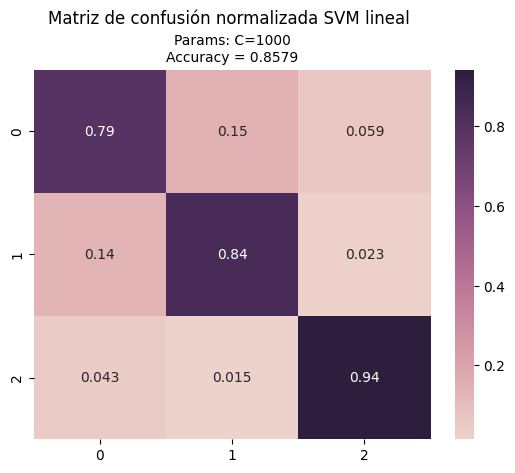

In [ ]:
accu_score = accuracy_score(y_val, y_pred)
plt.title(f'Params: C={best_model.C}\nAccuracy = {accu_score:.4f}', fontsize = 10)
sns.heatmap(np.round(confusion_matrix(y_val, y_pred, normalize='true'), decimals=4), annot=True, cmap=sns.cubehelix_palette(as_cmap=True))
plt.suptitle('Matriz de confusión normalizada SVM lineal', x=0.43, y=1.005)
# for text in disp_norm.text_.ravel():
#     text.set_fontsize(14) # Ajusta fontsize
plt.savefig('conf_mat_svm.svg')

plt.show()

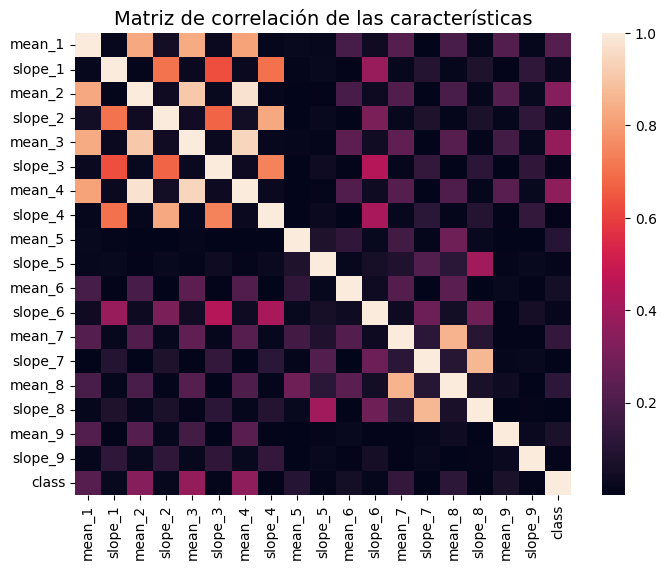

In [ ]:
plt.figure(figsize=(8,6))
correlation_data = df_train_w_class[df_train_w_class['class']==3].corr(method='pearson')
correlation_data_abs_value = abs(df_train_w_class[df_train_w_class['class']==3].corr(method='pearson'))

correlation_data = df_train_w_class.corr(method='pearson')
correlation_data_abs_value = abs(df_train_w_class.corr(method='pearson'))
sns.heatmap(correlation_data_abs_value)
plt.title("Matriz de correlación de las características", fontsize=14)
plt.savefig('corr_lineal.svg', format='svg', bbox_inches='tight', pad_inches=0)

Se concluye que la pendiente no tiene una importancia comparable a la de la media en la clasificación de las señales, pero debo sacar el gráfico anterior (matriz de correlación con la clase con las cracterísticas, que sería la media de cada señal) para realmente poder comparar como corresponde y decir porque la pendiente no sirve para clasificar las señales

## Segunda iteración de predicción del conjunto de test

In [ ]:
def test_pred_function(df_te, model):
  y_test_pred = model.predict(df_te)
  with open('pred_test_JE.csv', 'w') as f:
    f.write('Id,Category\n')
    for i in range(len(df_te)):
      f.write(f'{df_te.index[i]},{y_test_pred[i]}\n')

test_pred_function(df_test, best_model)

# III) Cascada de clasificadores
Se clasifica la clase 3 y luego se clasifican las 1 y 2 por separado, del punto anterior se concluyó, con respecto al vecotr de carcaterísticas, que la mejor característica para clasificar la data resultó ser la media, yq eu otras características como la varianza, skew o sma solo mantienen el accuracy o incluso lo disminuyen como sucedió con la varianza, en el primer vector de características se vió que esta carcatrística solo emperoraba el rendimiento general, ya que al quitarla y además aumentar el C, el clasificador pasó de tener un accuracy de validación de 86% a 92%.

In [ ]:
def calculation_feature_vector_2(df_data):

  caracs_list = []

  big_data_arr = np.zeros((len(df_data), 9))

  for i in range(0, len(df_data)):
  # for i in range(0, 2):
    data_list = []

    for j in range(1,10):

      if j == 9:
        df_calc = df_data.loc[i, f'Humidity_0':f'Humidity_127'] #display(df_trainval.loc[i, f'Humidity_0':f'Humidity_127'])
      else:
        df_calc = df_data.loc[i, f'R{j}_0':f'R{j}_127'] #display(df_trainval.loc[i, f'R{j}_0':f'R{j}_127'])

      if i == 0:
        # 2° it features
        caracs_list.append('mean_' + str(j))
        # caracs_list.append('var_' + str(j))
        # caracs_list.append('min_' + str(j))
        # caracs_list.append('max_' + str(j))
        # caracs_list.append('sma_' + str(j))

        df = pd.DataFrame(columns=caracs_list)

      data_list.append(np.mean(df_calc))
      # data_list.append(np.var(df_calc))
      # data_list.append(min(df_calc))
      # data_list.append(max(df_calc))
      # data_list.append(np.ma.average(df_calc))
    # print(i)
    big_data_arr[i,:] = np.array(data_list)

  df = pd.DataFrame(big_data_arr, columns=caracs_list)

  if 'class' in df_data.columns:
    df = pd.concat([df, df_data['class']], axis=1)

  return df

In [ ]:
train_val_data_III = calculation_feature_vector_2(df_trainval)
df_test = calculation_feature_vector_2(df_test_no_labels)

In [ ]:
df_train, df_val = train_test_split(train_val_data_III, test_size=0.3, random_state=10, stratify=train_val_data_II['class'])

scaler = StandardScaler().fit(df_train.iloc[:,0:9])

df_train.iloc[:,0:9] = scaler.transform(df_train.iloc[:,0:9])
df_val.iloc[:,0:9] = scaler.transform(df_val.iloc[:,0:9])
df_test.iloc[:,0:9] = scaler.transform(df_test.iloc[:,0:9])

df_train_w_class = df_train.copy()
df_val_w_class = df_val.copy()

y_train = df_train.pop('class')# - 1
y_val = df_val.pop('class')# - 1

In [ ]:
# 1° iteración:
# parameters = {'C':[0.01, 0.1, 1, 10, 100]}
# svc = svm.SVC(kernel='linear')

# 2° iteración:
# parameters = {'C':[0.1, 1, 10], 'degree':[2,3,4]}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

# 3° iteración:
parameters = {'C':[200, 500, 1000, 5000], 'degree':[2,3,4]}
svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

clf = GridSearchCV(svc, parameters, cv=ps)

# GridSearch
t0 = time.time()
clf.fit(df_val, y_val)
t = time.time()
tiempo_svm_lin_grid_search = t - t0
print('Tiempo GridSearch SVM lineal: ',tiempo_svm_lin_grid_search)

display(pd.DataFrame(clf.cv_results_)) # Resultados del GridSearchCV()

best_model = clf.best_estimator_ # Se extraen los mejores hiperparámetros calculados a través de GridSearchCV()
# svc_lin = svm.SVC(kernel='linear', C=best_model.C)# Se define un nuevo SVM con los mejores hiperparámetros

# Entrenamiento del SVM lineal con el conjunto de entrenamiento
t0 = time.time()
best_model.fit(df_train, y_train)
t = time.time()
tiempo_svm_lin_training = t - t0
print('Tiempo entrenamiento SVM lineal: ',tiempo_svm_lin_training)

print('Tiempo GridSearch + Entrenamiento =',tiempo_svm_lin_grid_search+tiempo_svm_lin_training)
y_pred = best_model.predict(df_val) # Predicción del conjunto de validación

Tiempo GridSearch SVM lineal:  44.57971954345703


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.371135,0.0,0.060842,0.0,200,2,"{'C': 200, 'degree': 2}",0.661616,0.661616,0.0,12
1,0.562824,0.0,0.056952,0.0,200,3,"{'C': 200, 'degree': 3}",0.691919,0.691919,0.0,9
2,0.904423,0.0,0.056370,0.0,200,4,"{'C': 200, 'degree': 4}",0.718434,0.718434,0.0,5
3,0.517559,0.0,0.059153,0.0,500,2,"{'C': 500, 'degree': 2}",0.680556,0.680556,0.0,11
4,0.912879,0.0,0.056014,0.0,500,3,"{'C': 500, 'degree': 3}",0.709596,0.709596,0.0,8
5,1.604682,0.0,0.051868,0.0,500,4,"{'C': 500, 'degree': 4}",0.744949,0.744949,0.0,4
6,0.741986,0.0,0.057042,0.0,1000,2,"{'C': 1000, 'degree': 2}",0.688131,0.688131,0.0,10
7,2.160672,0.0,0.086544,0.0,1000,3,"{'C': 1000, 'degree': 3}",0.718434,0.718434,0.0,5
8,2.941602,0.0,0.050041,0.0,1000,4,"{'C': 1000, 'degree': 4}",0.766414,0.766414,0.0,3
9,2.002565,0.0,0.053482,0.0,5000,2,"{'C': 5000, 'degree': 2}",0.717172,0.717172,0.0,7


Tiempo entrenamiento SVM lineal:  75.33300042152405
Tiempo GridSearch + Entrenamiento = 119.91271996498108


In [ ]:
# Separación de los datasets
df_val_1_2 = df_val[y_val != 3]         #Estos son los datos que voy a usar para validar el segundo clasificador
df_train_1_2 = df_train[y_train != 3]

y_train_1_2 = y_train[y_train != 3]  #Estas son las clases de los datos que voy a usar para validar el segundo clasificador
y_val_1_2 = y_val[y_val != 3]

df_val_pred_1_2 = df_val[y_pred != 3]    #Estos son los datos que voy a reclasificar, los que fueron predichos como 1 o 2
y_pred_1_2 = y_pred[y_pred != 3]         #Estas son las clases de los datos que voy a reclasificar

# len(df_val_1_2)
# len(y_val_class_1_2)
# len(y_pred_class_1_2) # La dimensión de este array es menor que el conjunto de validación debido a que no contiene todas las observaciónes predichas que realmente tienen las clases 1 o 2. Faltan aquellas que fueron predichas como 3 y que en realidad son de la clase 1 o 2
# len(df_val_pred_class_1_2)
# len(df_val[y_pred == 3])

# print(len(df_val_pred_class_1_2)+len(df_val[y_pred == 3]))
# print(len(df_val))

Permutación predefinida para la validación del modelo

In [ ]:
n_samples = len(y_val_1_2)                                        # Longitud del set de datos de validación, este dato se usará para definir que elementos se usarán para entrenamiento y validación en GridSearchCV()
n_train_grid_search = int(n_samples * 0.7)                    # 80% de los datos utilizdos para entrenamiento
n_val_grid_search = n_samples - n_train_grid_search           # El 20% restante para validación

np.random.seed(42)
indices = np.random.permutation(n_samples)                    # Tomar índices de forma aleatoria
test_fold = np.full(n_samples, -1)                        # Se define el arreglo de los índices de elemntos de train y test

# Asignar 1 a los índices que serán test
test_indices = indices[:n_val_grid_search]
test_fold[test_indices] = 1

ps = PredefinedSplit(test_fold)

In [ ]:
display(df_val_pred_1_2)

,mean_R1,mean_R2,mean_R3,mean_R4,mean_R5,mean_R6,mean_R7,mean_R8,mean_Humidity
239,1.096543,0.748626,0.703782,0.742589,-0.153586,-0.538695,0.610996,0.603499,-0.133996
7493,-2.436857,-0.862523,-0.915979,-0.824571,-0.319958,0.928797,-0.686096,-0.684933,-0.857180
6571,0.818759,0.429849,0.442854,0.426695,-0.068313,-1.100757,-0.005982,-0.022726,-0.140114
6549,0.634276,0.715461,0.701750,0.710410,-0.075733,-1.048698,-0.016646,-0.036925,0.672947
6343,1.105231,0.964985,0.942559,0.964935,-0.021235,-0.951169,0.033498,0.020603,-1.747880
...,...,...,...,...,...,...,...,...,...
2530,0.295776,-0.011892,-0.423304,0.187367,-0.223617,0.775180,-0.068628,0.266574,0.097315
943,-0.031109,-0.153198,-1.431315,-0.095407,-0.453486,-1.775178,-0.891543,-0.767952,0.599935
5597,-5.223277,-2.959463,-3.278409,-3.124802,-0.594448,-2.977505,-0.939698,-0.956904,-0.664565
2263,-1.541668,-0.103461,-1.692822,-0.278799,-0.288122,-1.451974,-0.500043,-0.384711,-0.244440


Segundo clasificador

In [ ]:
# 3° iteración: (Del mismo clasificador que estaba usando antes)
# parameters = {'C':[200, 500, 1000, 5000], 'degree':[2,3,4]}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

# 4° iteración: (Para mejorar la clasificación entre 1 y 2, se penaliza mucho más el error en la clase 1, ya que es la clase que da el accuracy más bajo)
# parameters = {'C':[200, 500, 1000, 5000], 'degree':[2,3,4]}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale', class_weight={1: 2, 2: 1})

# 4° a) iteración:
# parameters = {'C':[200, 500, 1000, 5000], 'degree':[2,3,4], 'class_weight': [
#         {1: 1, 2: 1},     # Sin penalización
#         {1: 1, 2: 3},     # Penaliza más errores en clase 2
#         {1: 3, 2: 1},     # Penaliza más errores en clase 1
#         'balanced'        # Automático según la distribución de clases
#     ]}

# 4° b) iteración: 10/07
parameters = {'C':[1, 10, 100], 'kernel':['rbf'], 'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10], 'class_weight': [
        {1: 1, 2: 1},     # Sin penalización
        {1: 1, 2: 3},     # Penaliza más errores en clase 2
        {1: 3, 2: 1},     # Penaliza más errores en clase 1
        'balanced'        # Automático según la distribución de clases
    ]}

# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')
svc = svm.SVC()

clf = GridSearchCV(svc, parameters, cv=ps)

# GridSearch
t0 = time.time()
clf.fit(df_val_1_2, y_val_1_2)
t = time.time()
tiempo_svm_lin_grid_search = t - t0
print('Tiempo GridSearch SVM lineal: ',tiempo_svm_lin_grid_search)

display(pd.DataFrame(clf.cv_results_)) # Resultados del GridSearchCV()

best_model_2 = clf.best_estimator_ # Se extraen los mejores hiperparámetros calculados a través de GridSearchCV()
# svc_lin = svm.SVC(kernel='linear', C=best_model.C)# Se define un nuevo SVM con los mejores hiperparámetros

# Entrenamiento del SVM lineal con el conjunto de entrenamiento
t0 = time.time()
best_model_2.fit(df_train_1_2, y_train_1_2)
t = time.time()
tiempo_svm_lin_training = t - t0
print('Tiempo entrenamiento SVM lineal: ',tiempo_svm_lin_training)

print('Tiempo GridSearch + Entrenamiento =',tiempo_svm_lin_grid_search+tiempo_svm_lin_training)
y_pred_1_2 = best_model_2.predict(df_val_pred_1_2) # Predicción del conjunto de validación

Tiempo GridSearch SVM lineal:  4.674489498138428


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_gamma,param_kernel,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.104946,0.0,0.065760,0.0,1,"{1: 1, 2: 1}",0.001268,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 1}, 'gamma'...",0.615530,0.615530,0.0,35
1,0.097726,0.0,0.060798,0.0,1,"{1: 1, 2: 1}",0.012684,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 1}, 'gamma'...",0.649621,0.649621,0.0,34
2,0.088228,0.0,0.054423,0.0,1,"{1: 1, 2: 1}",0.126839,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 1}, 'gamma'...",0.734848,0.734848,0.0,19
3,0.076679,0.0,0.041393,0.0,1,"{1: 1, 2: 1}",1.268386,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 1}, 'gamma'...",0.869318,0.869318,0.0,10
4,0.062845,0.0,0.025764,0.0,1,"{1: 1, 2: 3}",0.001268,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 3}, 'gamma'...",0.511364,0.511364,0.0,44
5,0.056964,0.0,0.026925,0.0,1,"{1: 1, 2: 3}",0.012684,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 3}, 'gamma'...",0.535985,0.535985,0.0,41
6,0.054104,0.0,0.023991,0.0,1,"{1: 1, 2: 3}",0.126839,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 3}, 'gamma'...",0.653409,0.653409,0.0,33
7,0.050900,0.0,0.026216,0.0,1,"{1: 1, 2: 3}",1.268386,rbf,"{'C': 1, 'class_weight': {1: 1, 2: 3}, 'gamma'...",0.888258,0.888258,0.0,9
8,0.052837,0.0,0.026384,0.0,1,"{1: 3, 2: 1}",0.001268,rbf,"{'C': 1, 'class_weight': {1: 3, 2: 1}, 'gamma'...",0.490530,0.490530,0.0,48
9,0.053609,0.0,0.025751,0.0,1,"{1: 3, 2: 1}",0.012684,rbf,"{'C': 1, 'class_weight': {1: 3, 2: 1}, 'gamma'...",0.492424,0.492424,0.0,45


Tiempo entrenamiento SVM lineal:  0.47613072395324707
Tiempo GridSearch + Entrenamiento = 5.150620222091675


In [ ]:
y_pred_1_2 = best_model_2.predict(df_val_pred_1_2) # Predicción del conjunto de validación

In [ ]:
# Paso 1: máscara de elementos clasificados como 1 o 2 por el primer modelo
mask_1_2 = y_pred != 3  # boolean array del mismo largo que y_pred

# Paso 2: inicializa un array con las predicciones del primer modelo
# (esto evitará errores de tamaño o indexación)
y_pred_final = y_pred.copy()

# Paso 3: reemplaza las posiciones de clase 1 o 2 por la nueva predicción del segundo modelo
y_pred_final[mask_1_2] = y_pred_1_2

In [ ]:
y_pred_final

array([1., 3., 2., ..., 2., 2., 3.])

              precision    recall  f1-score   support

         1.0       0.95      0.90      0.92       879
         2.0       0.95      0.96      0.95       880
         3.0       0.95      0.99      0.97       880

    accuracy                           0.95      2639
   macro avg       0.95      0.95      0.95      2639
weighted avg       0.95      0.95      0.95      2639



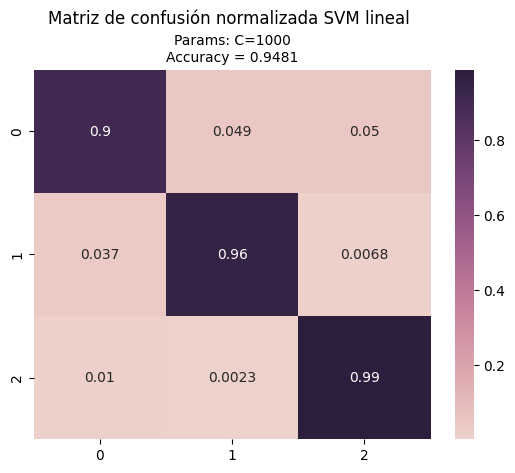

In [ ]:
# y_class_1_2 = y_val[y_val != 3]
print(classification_report(y_val, y_pred_final))

accu_score = accuracy_score(y_val, y_pred_final)
plt.title(f'Params: C={best_model.C}\nAccuracy = {accu_score:.4f}', fontsize = 10)
sns.heatmap(np.round(confusion_matrix(y_val, y_pred_final, normalize='true'), 4), annot=True, cmap=sns.cubehelix_palette(as_cmap=True))
plt.suptitle('Matriz de confusión normalizada SVM lineal', x=0.43, y=1.005)


plt.show()

Se concluye que la clasificación en cascada no mejoró la clasificación global, de manera que se vuelve a este punto inicial, penalizando mucho más el error en la clase 1 para mejorar la clasificación entre 1 y 2

Se calcula la tercera predicción del conjunto de test, esta vez con el clasificador en cascada

In [ ]:
y_test_pred = best_model.predict(df_test)

In [ ]:
print(best_model.classes_)
best_model_2.classes_
print("Shape de clases:", best_model.classes_.shape)

[1. 2. 3.]
Shape de clases: (3,)


In [ ]:
y_pred_1_2 = best_model_2.predict(df_test) # Predicción del conjunto de validación

y_test_pred_1_2 = y_test_pred[y_test_pred != 3]

# Paso 1: máscara de elementos clasificados como 1 o 2 por el primer modelo
mask_1_2 = y_test_pred != 3  # boolean array del mismo largo que y_pred

# Paso 2: inicializa un array con las predicciones del primer modelo
# (esto evitará errores de tamaño o indexación)
y_test_pred_final = y_test_pred.copy()

# Paso 3: reemplaza las posiciones de clase 1 o 2 por la nueva predicción del segundo modelo
y_test_pred_final[mask_1_2] = y_test_pred_1_2

with open('pred_test.csv', 'w') as f:
  f.write('Id,Category\n')
  for i in range(len(df_test)):
    f.write(f'{df_test.index[i]},{int(y_test_pred_final[i])}\n')

# test_pred_function(df_test, best_model)

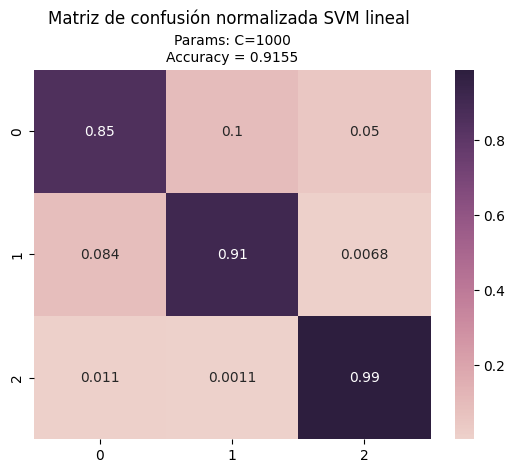

In [ ]:
accu_score = accuracy_score(y_val, y_pred)
plt.title(f'Params: C={best_model.C}\nAccuracy = {accu_score:.4f}', fontsize = 10)
sns.heatmap(np.round(confusion_matrix(y_val, y_pred, normalize='true'), 4), annot=True, cmap=sns.cubehelix_palette(as_cmap=True))
plt.suptitle('Matriz de confusión normalizada SVM lineal', x=0.43, y=1.005)
# for text in disp_norm.text_.ravel():
#     text.set_fontsize(14) # Ajusta fontsize
plt.savefig('conf_mat_svm.svg')

plt.show()

In [ ]:
print("Clases en y_val:", np.unique(y_val))
print("Clases en y_pred:", np.unique(y_pred))

Clases en y_val: [1 2 3]
Clases en y_pred: [1 2 3]


# Borrador

#### Borrador de las celdas para conseguir el mejor SVM

In [ ]:
ps = predefined_split(y_val)

# 1° iteración:
# parameters = {'C':[0.01, 0.1, 1, 10, 100]}
# svc = svm.SVC(kernel='linear') #decision_function_shape{‘ovo’, ‘ovr’}, default=’ovr’

# 2° iteración:
# parameters = {'C':[0.1, 1, 10], 'degree':[2,3,4]}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

# 2° a) iteración:
# parameters = {'C':[0.1, 1, 10, 100, 200], 'degree':[2,3,4]}
# parameters = {'C':[0.1, 1, 10, 100, 1000], 'degree':[2,3,4],'kernel':['poly']}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

# 2° a) iteración:
# parameters = {'C':[100, 200, 500, 1000], 'degree':[2,3,4]}
# parameters = {'C':[100, 200, 500, 1000], 'degree':[2,3,4], 'kernel':['poly']}
# parameters = {'C':[200, 500, 1000, 5000], 'degree':[2,3,4], 'coef0':[-5, -1, 1, 5]}
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')
parameters = {'C':[200, 500, 1000, 2000], 'degree':[2,3,4,5]}
svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')
# parameters = {'C':[200, 500, 1000, 2000], 'degree':[2,3,4],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
# svc = svm.SVC(kernel='poly', coef0=1)

# svc = svm.SVC(kernel='poly', gamma='scale')
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')

# 3° iteración:
# parameters = {'C':[0.01, 0.1, 1, 10, 100], 'degree':[2,3,4], 'coef0':[-1, 1]}
# parameters = {'C':[0.01, 0.1, 1, 10, 100], 'kernel':['poly'], 'degree':[2,3,4], 'coef0':[-1, 1]} #Probado el 10/07, debo definir el kernel dentro de los parámetros
# svc = svm.SVC(kernel='poly', gamma='scale')
# Poco viable por el timepo de entrenamiento que toma

# 4° iteración:
# parameters = {'kernel':['rbf'],'C':[0.01, 0.1, 1, 10, 100],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
# parameters = {'kernel':['rbf'],'C':[1, 10, 100, 1000, 2000],'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
# svc = svm.SVC(kernel='rbf')

# 5° iteración: (09/07) Selección del kernel mediante el GridSearch
# parameters = {'C':[0.01, 0.1, 1, 10, 100], 'kernel':['poly', 'rbf']} #Al tener como resultado el mayor C, se plantea un nuevo conjunto de valores C para el GridSearch
# parameters = {'C':[100, 200, 500, 1000, 2000],'kernel':['linear', 'poly', 'rbf', 'sigmoid']}
# parameters = {'C':[0.01, 0.1, 1, 10, 100],'kernel':['linear', 'poly', 'rbf', 'sigmoid']}  #--------> Para probar el mejor kernel
# parameters = {'C':[0.01, 0.1, 1, 10, 100],'kernel':['linear', 'poly', 'rbf', 'sigmoid']} #Al tener como resultado el mayor C, se plantea un nuevo conjunto de valores C para el GridSearch
# parameters = {'C':[0.1, 1, 10, 100], 'kernel':['rbf'], 'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*100]}
# parameters = {'C':[1, 10, 100, 200], 'kernel':['rbf'], 'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10]} #Probado el 10/07
# parameters = {'C':[1, 10, 100], 'kernel':['rbf'], 'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10]} # Pruebo este vector el 10/07 para verificar el clasificador con el nuevo vector de características y de esta forma evaluar el tiempo de cálculo y el nuevo vector
# parameters = {'C':[0.01, 0.1, 1, 10, 100],'kernel':['sigmoid','poly', 'rbf']} #Al tener como resultado el mayor C, se plantea un nuevo conjunto de valores C para el GridSearch

best_model = make_clf(svc, parameters, df_train, y_train, df_val, y_val)
# best_model = make_clf(parameters, df_train.iloc[:,0:44], y_train, df_val.iloc[:,0:44], y_val)

y_pred = best_model.predict(df_val) # Predicción del conjunto de validación
# y_pred = best_model.predict(df_val.iloc[:,0:44]) # Predicción del conjunto de validación

Tiempo GridSearch SVM lineal:  129.43655729293823


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,1.059953,0.0,0.025252,0.0,200,2,"{'C': 200, 'degree': 2}",0.785354,0.785354,0.0,15
1,1.968902,0.0,0.026243,0.0,200,3,"{'C': 200, 'degree': 3}",0.835859,0.835859,0.0,11
2,2.271038,0.0,0.017093,0.0,200,4,"{'C': 200, 'degree': 4}",0.854798,0.854798,0.0,8
3,3.453155,0.0,0.025424,0.0,200,5,"{'C': 200, 'degree': 5}",0.891414,0.891414,0.0,3
4,2.511131,0.0,0.023767,0.0,500,2,"{'C': 500, 'degree': 2}",0.796717,0.796717,0.0,13
5,6.270993,0.0,0.026727,0.0,500,3,"{'C': 500, 'degree': 3}",0.833333,0.833333,0.0,12
6,4.300199,0.0,0.026990,0.0,500,4,"{'C': 500, 'degree': 4}",0.866162,0.866162,0.0,7
7,3.811153,0.0,0.015512,0.0,500,5,"{'C': 500, 'degree': 5}",0.883838,0.883838,0.0,5
8,5.232903,0.0,0.023627,0.0,1000,2,"{'C': 1000, 'degree': 2}",0.789141,0.789141,0.0,14
9,19.762902,0.0,0.019646,0.0,1000,3,"{'C': 1000, 'degree': 3}",0.849747,0.849747,0.0,9


Tiempo entrenamiento SVM lineal:  33.46855592727661
Tiempo GridSearch + Entrenamiento = 162.90511322021484


In [ ]:
def calculation_feature_vector(df_data):

  caracs_list = []

  big_data_arr = np.zeros((len(df_data), 18))

  for i in range(0, len(df_data)):
  # for i in range(0, 2):
    data_list = []

    for j in range(1,10):

      if j == 9:
        df_calc = df_data.loc[i, f'Humidity_0':f'Humidity_127'] #display(df_trainval.loc[i, f'Humidity_0':f'Humidity_127'])
      else:
        df_calc = df_data.loc[i, f'R{j}_0':f'R{j}_127'] #display(df_trainval.loc[i, f'R{j}_0':f'R{j}_127'])

      if i == 0:
        caracs_list.append('mean_' + str(j))
        caracs_list.append('var_' + str(j))
        caracs_list.append('mad_' + str(j)) # Desde aquí es el nuevo vector de carcaterísticas que debería haber probado desde un principio
        caracs_list.append('max_' + str(j))

        caracs_list.append('min_' + str(j))
        caracs_list.append('sma_' + str(j))
        caracs_list.append('enrgy_' + str(j))
        caracs_list.append('iqr_' + str(j))

        caracs_list.append('entpy_' + str(j))
        caracs_list.append('arCoeff_' + str(j))
        caracs_list.append('corr_' + str(j))

        df = pd.DataFrame(columns=caracs_list)

      data_list.append(np.mean(df_calc))
      data_list.append(np.var(df_calc))
      data_list.append(np.median(np.abs(df_calc - np.median(df_calc))))
      data_list.append(np.max(df_calc))

      data_list.append(np.min(df_calc))
      data_list.append(np.sum(np.abs(df_calc)))
      data_list.append(np.sum(df_calc**2)/len(df_calc))
      data_list.append(sp.stats.iqr(df_calc))

      data_list.append(sp.stats.entropy(df_calc))
      data_list.append(arr_coef) # No sé como implementar esto en python pero puedes dejarlo en este formato para cuando descubra la librería que permite calcular esta característica
      data_list.append(np.corrcoef(df_calc[:-1], df_calc[1:])[0][1])


    big_data_arr[i,:] = np.array(data_list)

  df = pd.DataFrame(big_data_arr, columns=caracs_list)

  if 'class' in df_data.columns:
    df = pd.concat([df, df_data['class']], axis=1)

  return df

Se organizan los datos en un array de la forma i,j,k, se hace esto para facilitar la programación del cálculo de características

In [ ]:
array_train_val = np.zeros((len(df_trainval), 9, 128)) # Matriz -> n° de muestras X n° de sensores X tamaño de la ventana  ->  [8795, 8, 127]

k = array_train_val.shape[-1]

for i in range(array_train_val.shape[0]):

  for j in range(array_train_val.shape[1]):

    array_train_val[i,j,:] = np.array(df_trainval.loc[i][j*k : k + j*k])

In [ ]:
print(array_train_val[0,0,:].shape)
np.array(df_trainval.loc[0][2*128 : 128 + 2*128]).shape

(128,)


(128,)

In [ ]:
train_val_caracs = pd.DataFrame()
# np.zeros((len(df_trainval), 18)) # Matriz -> n° de muestras X n° de sensores X tamaño de la ventana  ->  [8795, 8, 127]

column_names_caracs = []

for i in range(array_train_val.shape[0]):
  means = []
  variances = []

  print(i)

  for j in range(array_train_val.shape[1]):

    means.append(np.mean(array_train_val[i,j,:]))
    variances.append(np.var(array_train_val[i,j,:]))

    if i == 0:
      column_names_caracs.append('mean_' + str(j+1))
      column_names_caracs.append('vars_' + str(j+1))

  display(pd.DataFrame(means).concat(pd.DataFrame(variances)))


  # train_val_caracs = train_val_caracs.append(pd.Series(means + variances), ignore_index=True)

# train_val_caracs

NameError: name 'array_train_val' is not defined

In [ ]:
df_trainval_caracs = pd.DataFrame(array_train_caracs, columns=column_names_caracs)
df_trainval_caracs
# array_train_val[0,0,:]

,mean_1,mean_2,mean_3,mean_4,mean_5,mean_6,mean_7,mean_8,mean_9
0,12.754292,10.025339,10.148645,11.289939,11.385055,18.354793,4.825439,5.305171,60.131052
1,11.967599,8.068474,8.285822,7.607900,11.844489,16.910116,2.535805,3.026097,65.021354
2,10.874177,6.733694,4.255943,8.015534,14.331759,14.787651,1.883080,2.149658,56.372610
3,12.554823,9.927928,10.074674,11.206576,10.498980,16.661062,7.049197,7.333878,64.552841
4,8.396118,5.376859,3.503016,6.654920,5.419658,14.696602,2.338161,2.889587,58.124579
...,...,...,...,...,...,...,...,...,...
8791,12.412083,9.383410,9.548767,10.667314,10.898194,18.001598,5.556913,6.264065,50.446031
8792,12.834633,9.708894,9.818239,10.988033,19.437108,17.201457,6.097525,6.517089,53.291634
8793,11.981392,9.590782,9.755056,11.072576,10.708553,16.235656,6.379035,7.499586,67.555945
8794,12.913830,10.145803,10.285827,11.450341,11.323898,17.286553,6.387599,6.876442,52.303113


In [ ]:
caracs_list = []

big_data_arr = np.zeros((len(df_trainval), 18))

for i in range(0, len(df_trainval)):
  data_list = []

  for j in range(1,10):

    if j == 9:
      df_calc = df_trainval.loc[i, f'Humidity_0':f'Humidity_127'] #display(df_trainval.loc[i, f'Humidity_0':f'Humidity_127'])
    else:
      df_calc = df_trainval.loc[i, f'R{j}_0':f'R{j}_127'] #display(df_trainval.loc[i, f'R{j}_0':f'R{j}_127'])

    if i == 0:
      caracs_list.append('mean_' + str(j))
      caracs_list.append('var_' + str(j))

      df_train_val = pd.DataFrame(columns=caracs_list)

    data_list.append(np.mean(df_calc))
    data_list.append(np.var(df_calc))

  big_data_arr[i,:] = np.array(data_list)

df_train_val = pd.DataFrame(big_data_arr, columns=caracs_list)
df_train_val = pd.concat([df_train_val, df_trainval['class']], axis=1)
df_train_val
# display(array_train_caracs)
# print(big_data_arr)

,mean_1,var_1,mean_2,var_2,mean_3,var_3,mean_4,var_4,mean_5,var_5,mean_6,var_6,mean_7,var_7,mean_8,var_8,mean_9,var_9,class
0,12.754292,1.906951e-04,10.025339,2.522271e-03,10.148645,1.373784e-03,11.289939,0.002741,11.385055,3.019404e-03,18.354793,0.000251,4.825439,1.891078e-04,5.305171,2.026727e-04,60.131052,0.004940,1
1,11.967599,4.615858e-02,8.068474,1.747379e-01,8.285822,1.192520e-01,7.607900,0.037851,11.844489,6.111635e-04,16.910116,0.052403,2.535805,7.630309e-03,3.026097,3.469361e-02,65.021354,0.012975,1
2,10.874177,1.686482e-04,6.733694,8.399944e-03,4.255943,7.255871e-02,8.015534,0.014101,14.331759,4.511163e-05,14.787651,0.020747,1.883080,1.527344e-03,2.149658,1.502168e-03,56.372610,0.005181,1
3,12.554823,9.594409e-06,9.927928,1.547504e-06,10.074674,5.384760e-07,11.206576,0.000003,10.498980,5.700092e-07,16.661062,0.000034,7.049197,1.462127e-07,7.333878,5.272732e-08,64.552841,0.000700,1
4,8.396118,1.375398e-01,5.376859,1.803704e-01,3.503016,2.255354e-01,6.654920,0.032712,5.419658,3.459920e-02,14.696602,1.606592,2.338161,7.527932e-03,2.889587,8.011927e-03,58.124579,0.052991,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8791,12.412083,2.465645e-04,9.383410,1.878341e-04,9.548767,3.238135e-04,10.667314,0.000181,10.898194,7.399777e-05,18.001598,0.000071,5.556913,3.080433e-05,6.264065,1.567876e-05,50.446031,0.129468,3
8792,12.834633,4.851733e-07,9.708894,6.730447e-07,9.818239,2.962567e-06,10.988033,0.000012,19.437108,3.249446e-04,17.201457,0.000003,6.097525,4.279667e-06,6.517089,1.666033e-06,53.291634,0.000174,3
8793,11.981392,1.075543e-04,9.590782,4.493687e-05,9.755056,3.997650e-05,11.072576,0.000064,10.708553,3.387687e-05,16.235656,0.000048,6.379035,6.832402e-06,7.499586,5.392002e-05,67.555945,0.029843,3
8794,12.913830,2.502985e-04,10.145803,5.793843e-05,10.285827,7.715424e-06,11.450341,0.000036,11.323898,2.544722e-03,17.286553,0.001164,6.387599,3.191764e-05,6.876442,5.058336e-05,52.303113,0.003369,3


# Borrador

In [ ]:
#Esto debe ir desde la nueva selección de características al momento de reducir el vector
N_derv = 1
plt.figure()
plt.grid()
plt.xlabel('Index')
plt.ylabel('Derivative de Magnitud medida')
plt.title(f'Signals of R{start+1}')

for i in range(num_sign_per_graph):
  plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==1].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]],edge_order=N_derv), **plot_kwargs_1)
  plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==2].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]],edge_order=N_derv), **plot_kwargs_2)
  plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==3].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]],edge_order=N_derv), **plot_kwargs_3)
  if i == 0:
    plt.legend(loc=8, bbox_to_anchor=(0.5, -0.25), ncol=3)
plt.show()

filename = f'grad_of_signals_R{start}.svg'
filepath = os.path.join(folder, filename)
plt.savefig(filepath)


N_derv = 2
plt.figure()
plt.grid()
plt.xlabel('Index')
plt.ylabel('Segunda derivada de Magnitud medida')
plt.title(f'Signals of R{start+1}')

for i in range(num_sign_per_graph):
  plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==1].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]],edge_order=N_derv), **plot_kwargs_1)
  plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==2].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]],edge_order=N_derv), **plot_kwargs_2)
  plt.plot(np.arange(0,128), np.gradient(df_trainval[df_trainval['class']==3].sample(n=num_sign_per_graph, random_state=rs).iloc[i][idx[0]:idx[1]],edge_order=N_derv), **plot_kwargs_3)
  if i == 0:
    plt.legend(loc=8, bbox_to_anchor=(0.5, -0.25), ncol=3)
plt.show()

#### EL MEJOR RESULTADO EN TEST
REDUCCIÓN DEL VECTOR DE CARACTERÍSTICAS (SOLO LAS MEDIAS) Y NUEVO POLY

In [ ]:
df_train

,mean_R1,var_R1,mad_R1,max_R1,min_R1,ran_R1,sma_R1,enrgy_R1,iqr_R1,entpy_R1,...,mad_Humidity,max_Humidity,min_Humidity,ran_Humidity,sma_Humidity,enrgy_Humidity,iqr_Humidity,entpy_Humidity,arCoeff_Humidity,corr_Humidity
5693,0.526979,-0.158350,-0.272628,0.504717,0.539609,-0.340592,0.526979,0.542611,-0.304642,0.136466,...,-0.447712,0.078780,0.124418,-0.395919,0.095731,0.052556,-0.348864,0.211472,0.757430,0.703104
2435,0.205834,-0.158279,-0.282334,0.160054,0.244177,-0.330449,0.205834,0.186040,-0.303655,0.136414,...,-0.120137,0.479461,0.509377,-0.207917,0.495414,0.452429,-0.178888,0.198444,-0.414175,-0.464410
67,0.695675,-0.157622,-0.245588,0.694801,0.690926,-0.310816,0.695675,0.733042,-0.257287,0.136079,...,0.015618,0.306252,0.222429,0.781580,0.276988,0.232366,0.517356,-0.056046,0.258798,0.322598
7082,1.087978,-0.158812,-0.337107,1.101093,1.062662,-0.394255,1.087978,1.184198,-0.358198,0.136722,...,-0.578261,-1.045566,-0.977820,-0.727959,-1.012109,-0.987019,-0.619577,0.239313,-0.462535,-0.893262
5029,-0.162365,-0.150788,-0.032739,-0.194373,-0.113803,-0.155062,-0.162365,-0.213154,-0.151443,0.131849,...,-0.005205,1.916024,1.834080,0.959097,1.868859,1.926918,0.102325,-0.013669,0.087250,0.496174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,0.814096,-0.158413,-0.330173,0.814381,0.808497,-0.360225,0.814096,0.868001,-0.299568,0.136510,...,-0.382036,-0.943312,-0.900310,-0.495807,-0.924456,-0.908446,-0.389838,0.221490,-0.280392,-0.299979
5723,-0.611347,-0.036459,-0.083352,-0.658869,-0.950557,1.194040,-0.611347,-0.685662,-0.077733,0.056907,...,-0.525400,1.153480,1.080293,0.789306,1.048309,1.027308,-0.482760,0.118492,-1.172359,0.911826
8741,0.607134,-0.158432,-0.321160,0.589297,0.611721,-0.341901,0.607134,0.632824,-0.306474,0.136514,...,-0.367620,-0.621799,-0.601641,-0.254089,-0.614478,-0.625517,-0.286021,0.211301,1.054066,0.650232
1939,0.709671,-0.153167,-0.120098,0.730181,0.679749,-0.185493,0.709671,0.748955,-0.184000,0.133680,...,0.525001,1.389206,1.426694,-0.165423,1.407064,1.413756,0.190905,0.167598,0.638429,0.797557


Tiempo GridSearch SVM lineal:  108.54535174369812


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.103924,0.0,0.030709,0.0,1,2,"{'C': 1, 'degree': 2}",0.731061,0.731061,0.0,20
1,0.121941,0.0,0.026732,0.0,1,3,"{'C': 1, 'degree': 3}",0.770202,0.770202,0.0,19
2,0.146642,0.0,0.025613,0.0,1,4,"{'C': 1, 'degree': 4}",0.777778,0.777778,0.0,17
3,0.191453,0.0,0.023500,0.0,1,5,"{'C': 1, 'degree': 5}",0.795455,0.795455,0.0,13
4,0.184476,0.0,0.027030,0.0,10,2,"{'C': 10, 'degree': 2}",0.775253,0.775253,0.0,18
5,0.219987,0.0,0.023480,0.0,10,3,"{'C': 10, 'degree': 3}",0.797980,0.797980,0.0,12
6,0.371031,0.0,0.021347,0.0,10,4,"{'C': 10, 'degree': 4}",0.819444,0.819444,0.0,10
7,0.380248,0.0,0.019577,0.0,10,5,"{'C': 10, 'degree': 5}",0.819444,0.819444,0.0,10
8,0.670309,0.0,0.024652,0.0,100,2,"{'C': 100, 'degree': 2}",0.782828,0.782828,0.0,16
9,2.140335,0.0,0.035702,0.0,100,3,"{'C': 100, 'degree': 3}",0.823232,0.823232,0.0,9


Tiempo entrenamiento SVM lineal:  32.13842153549194
Tiempo GridSearch + Entrenamiento = 140.68377327919006


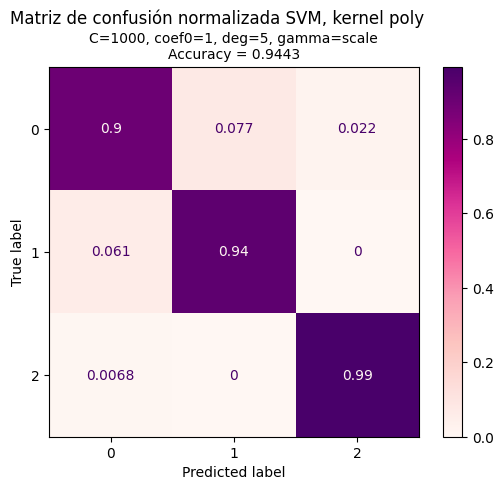

In [ ]:
# parameters = {'C':[200, 500, 1000, 2000], 'degree':[2,3,4,5]} # C PROBADOS DE FORMA EMPÍRICA
parameters = {'C':[1, 10, 100, 1000, 2000], 'degree':[2,3,4,5]} #MISMOS c PROBADOS EN LA BÚSQUEDA DEL MEJOR POLY
svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')
best_model = make_clf(svc, parameters, df_train[[col for col in df_train.columns if col.startswith('mean_')]], y_train, df_val[[col for col in df_val.columns if col.startswith('mean_')]], y_val) # Solo las medias de las mediciones de cada sensor (EMPÍRICO)

y_pred = best_model.predict(df_val[[col for col in df_val.columns if col.startswith('mean_')]]) # Predicción del conjunto de validación

conf_mat(best_model, y_val, y_pred)

#### Ahora si probamos con el kernel lineal de nuevo??

Tiempo GridSearch SVM lineal:  1.991894006729126


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.172627,0.0,0.033377,0.0,1,{'C': 1},0.633838,0.633838,0.0,4
1,0.206281,0.0,0.033055,0.0,2,{'C': 2},0.637626,0.637626,0.0,3
2,0.328967,0.0,0.034101,0.0,5,{'C': 5},0.641414,0.641414,0.0,1
3,0.449628,0.0,0.032308,0.0,10,{'C': 10},0.640152,0.640152,0.0,2


Tiempo entrenamiento SVM lineal:  5.107477903366089
Tiempo GridSearch + Entrenamiento = 7.099371910095215


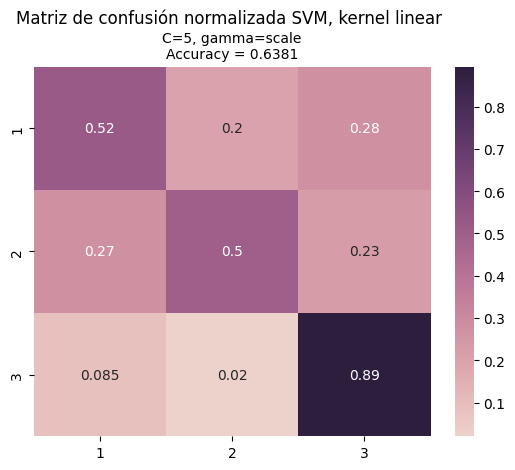

In [ ]:
parameters = {'C':[1, 2, 5, 10]}
svc = svm.SVC(kernel='linear')
best_model = make_clf(svc, parameters, df_train[[col for col in df_train.columns if col.startswith('mean_')]], y_train, df_val[[col for col in df_val.columns if col.startswith('mean_')]], y_val)

y_pred = best_model.predict(df_val[[col for col in df_val.columns if col.startswith('mean_')]]) # Predicción del conjunto de validación

conf_mat(best_model, y_val, y_pred)

### Reclasificador en cascada, toma los valores clasificados como 1 o 2 y los vuelve a pasar por un SVM (No sirve)

In [ ]:
# Separación de los datasets
df_val_1_2 = df_val_filter[y_val != 3]         #Estos son los datos que voy a usar para validar el segundo clasificador
df_train_1_2 = df_train_filter[y_train != 3]

y_train_1_2 = y_train[y_train != 3]  #Estas son las clases de los datos que voy a usar para validar el segundo clasificador
y_val_1_2 = y_val[y_val != 3]

df_val_pred_1_2 = df_val_filter[y_pred_filter != 3]    #Estos son los datos que voy a reclasificar, los que fueron predichos como 1 o 2
y_pred_1_2 = y_pred_filter[y_pred_filter != 3]         #Estas son las clases de los datos que voy a reclasificar

In [ ]:
mask_1_2 = (y_pred_filter == 1) | (y_pred_filter == 2)


In [ ]:
df_val_pred_1_2

,mean_R1,var_R1,mad_R1,min_R1,ran_R1,sma_R1,enrgy_R1,iqr_R1,mean_R2,var_R2,...,sma_R4,enrgy_R4,iqr_R4,entpy_R4,mean_R6,max_R6,min_R6,ran_R6,sma_R6,ran_Humidity
239,1.096543,-0.158607,-0.304521,1.066853,-0.364152,1.096543,1.194178,-0.319017,0.748626,-0.164941,...,0.742589,0.783413,-0.319538,0.155221,-0.538695,-0.562684,-0.506485,-0.257107,-0.538695,-0.712138
5350,0.514111,-0.156605,-0.192896,0.520910,-0.294782,0.514111,0.528180,-0.226845,0.366458,-0.163319,...,0.371481,0.332268,-0.235143,0.154479,0.484701,0.441852,0.522624,-0.246298,0.484701,0.493322
7493,-2.436857,-0.158313,-0.267081,-2.173449,-0.340265,-2.436857,-2.452145,-0.299145,-0.862523,-0.164917,...,-0.824571,-0.948139,-0.281265,0.154465,0.928797,0.888128,0.958825,-0.166168,0.928797,-0.186394
6571,0.818759,-0.158171,-0.240735,0.808927,-0.351063,0.818759,0.873338,-0.278287,0.429849,-0.164300,...,0.426695,0.397770,-0.284097,0.154873,-1.100757,-1.109215,-1.074705,-0.233139,-1.100757,-0.621816
6549,0.634276,-0.158563,-0.326707,0.644714,-0.358589,0.634276,0.663481,-0.325923,0.715461,-0.163931,...,0.710410,0.743290,-0.279404,0.154824,-1.048698,-1.057271,-1.022676,-0.228321,-1.048698,-0.188785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2530,0.295776,-0.116197,0.361759,0.228701,0.190475,0.295776,0.285280,0.153826,-0.011892,-0.046762,...,0.187367,0.118454,0.375288,0.118497,0.775180,0.793735,0.772125,0.155759,0.775180,10.533425
943,-0.031109,-0.137036,-0.156150,0.004843,0.115216,-0.031109,-0.071961,-0.090700,-0.153198,-0.154976,...,-0.095407,-0.198563,0.495424,0.116568,-1.775178,-1.534969,-1.862237,1.023084,-1.775178,1.069654
5597,-5.223277,4.343969,1.097718,-5.646002,4.955066,-5.223277,-4.644852,6.441921,-2.959463,0.134985,...,-3.124802,-2.663501,1.223410,-0.479132,-2.977505,-2.790807,-3.119639,0.904946,-2.977505,2.989597
2263,-1.541668,-0.109294,0.395039,-1.442766,0.199310,-1.541668,-1.617419,0.290112,-0.103461,-0.146906,...,-0.278799,-0.396756,-0.284267,0.154840,-1.451974,-1.438123,-1.433927,-0.156769,-1.451974,-0.603237


In [ ]:
from sklearn.ensemble import RandomForestClassifier


In [ ]:
# parameters = {'C':[1, 10, 100, 1000, 2000], 'gamma':[gamma_default*0.01, gamma_default*0.1, gamma_default, gamma_default*10, gamma_default*10], 'class_weight': [
#         {1: 1, 2: 1},     # Sin penalización
#         {1: 1, 2: 3},     # Penaliza más errores en clase 2
#         {1: 3, 2: 1},     # Penaliza más errores en clase 1
#         'balanced'        # Automático según la distribución de clases
#     ]}

# svc = svm.SVC(kernel='rbf')

parameters = {'n_estimators':[50, 100, 150, 200, 250, 1000]}
rf_clf = RandomForestClassifier(max_depth=8, random_state=42)


# parameters = {'C':[1, 10, 100, 1000, 2000], 'degree':[2,3,4,5]} #MISMOS c PROBADOS EN LA BÚSQUEDA DEL MEJOR POLY
# svc = svm.SVC(kernel='poly', coef0=1, gamma='scale')
# ps = predefined_split(y_val_1_2)
best_model_cascade = make_clf(rf_clf, parameters, df_train_1_2, y_train_1_2, df_val_1_2, y_val_1_2)


# conf_mat(best_model_cascade, y_val_1_2, y_pred_1_2)

Tiempo GridSearch SVM lineal:  17.65004277229309


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,mean_test_score,std_test_score,rank_test_score
0,0.561496,0.0,0.016686,0.0,50,{'n_estimators': 50},0.778409,0.778409,0.0,6
1,0.999919,0.0,0.025434,0.0,100,{'n_estimators': 100},0.787879,0.787879,0.0,1
2,1.493069,0.0,0.031244,0.0,150,{'n_estimators': 150},0.780303,0.780303,0.0,5
3,3.641921,0.0,0.094943,0.0,200,{'n_estimators': 200},0.784091,0.784091,0.0,2
4,2.408961,0.0,0.030154,0.0,250,{'n_estimators': 250},0.784091,0.784091,0.0,2
5,7.099068,0.0,0.105504,0.0,1000,{'n_estimators': 1000},0.784091,0.784091,0.0,2


Tiempo entrenamiento SVM lineal:  2.6019928455352783
Tiempo GridSearch + Entrenamiento = 20.25203561782837


In [ ]:
y_pred_1_2 = best_model_cascade.predict(df_val_pred_1_2)

In [ ]:
# Paso 1: máscara de elementos clasificados como 1 o 2 por el primer modelo
# Paso 2: inicializa un array con las predicciones del primer modelo
# (esto evitará errores de tamaño o indexación)
y_pred_final = y_pred_filter.copy()

# Paso 3: reemplaza las posiciones de clase 1 o 2 por la nueva predicción del segundo modelo
y_pred_final[mask_1_2] = y_pred_1_2

In [ ]:
pd.DataFrame(y_pred_final)

,0
0,2.0
1,1.0
2,2.0
3,2.0
4,2.0
...,...
2634,1.0
2635,3.0
2636,2.0
2637,2.0


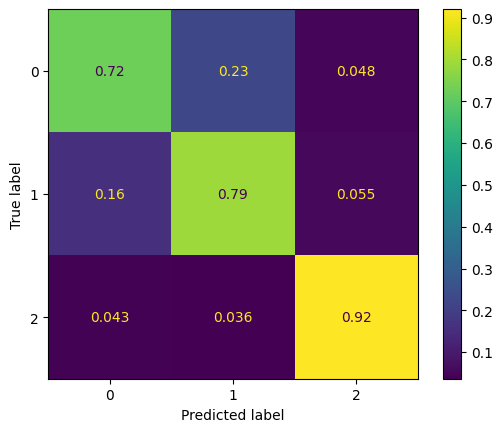

In [ ]:
# conf_mat(best_model_cascade, y_val, y_pred_final)

confusion_mat = confusion_matrix(y_val, y_pred_final, normalize='true')
ConfusionMatrixDisplay(confusion_matrix=confusion_mat).plot()

In [ ]:
len(mask_1_2)

2639

In [ ]:
conf_mat(best_model_cascade, y_val, y_pred_final)

### Reducción de la media a solo las 4 primeras medias